In [1]:
from skimage import io,filters, morphology, measure, draw,exposure
import matplotlib.pyplot as plt
import numpy as np
import scipy
from scipy import stats
import trackpy as tp
import pandas as pd
from scipy.stats import median_abs_deviation
from scipy.optimize import curve_fit
from sklearn.neighbors import KernelDensity
import seaborn as sns
from scipy.interpolate import make_interp_spline, BSpline
import imageio
from skimage.filters import threshold_otsu,threshold_multiotsu
from scipy.stats import ttest_ind,ttest_rel
import warnings
warnings.filterwarnings('ignore')

In [4]:
PATH = '<PATH/TO/DIR>/WAVE/Fig4DE_S3C_Beads_assay/'

In [5]:
def fill_multi_contours(cells_label_mask_clean, pad):
    num_cells = np.max(cells_label_mask_clean)
    output = np.zeros_like(cells_label_mask_clean)
    
    for target in range(1, num_cells+1):
        output += fill_contours((cells_label_mask_clean==target) * target, pad)
        
    return output

In [6]:
def fill_contours(cells_label_mask_clean, pad):
    return np.pad(np.maximum.accumulate(cells_label_mask_clean, 1),((0,0),(pad,0)), mode='constant')[:, :-pad] & \
           np.pad(np.maximum.accumulate(cells_label_mask_clean[:,::-1],1)[:,::-1],((0,0),(0,pad)), mode='constant')[:, pad:] & \
           np.pad(np.maximum.accumulate(cells_label_mask_clean, 0),((pad,0),(0,0)), mode='constant')[:-pad,:] & \
           np.pad(np.maximum.accumulate(cells_label_mask_clean[::-1,:],0)[::-1,:],((0,pad),(0,0)), mode='constant')[pad:,:]

In [7]:
def seg_cells(image, threshold, sigma,min_size, max_size, plot = True):
    """
    Segment out regions with a given fluorescence threshold in a cell
 
    Parameters
    ----------
    image : 2D array
        Raw tif image (single frame).
    threshold: float
        threshold used for segmentation
    sigma: float
        Standard deviation for Gaussian kernel.The larger the value, the smoothier the gaussian fitting.
    min_size: float
        minimum size of the segmented region
    max_size: float
        maximum size of the segmented region
    plot: bool
        whether or not plot the segmentation image
    
    Returns
    -------
    region_properties: list of RegionProperties
        Each item describes one labeled region with the corresponding attributes. 
    label_mask_clean:2D array 
        Segmentations based on fluorescent intensities of the image. 
        Each integer corresponds to a unique segmentation and 0 is the background.
        
    """
    smooth = filters.gaussian(image,sigma,preserve_range=True)
    cell_mask = smooth > threshold
    label_mask = measure.label(cell_mask)
    region_properties = measure.regionprops(label_mask)  
    label_mask_clean = label_mask.copy()
    for r in region_properties:
        if r.area <= min_size or r.area >= max_size:
            label_mask_clean[label_mask_clean == r.label] = 0
    if plot:
        plt.figure(figsize = (10,10))
        plt.imshow(image)
        plt.contour(label_mask_clean,colors = 'r',linewidths = 0.7)

    region_properties = measure.regionprops(label_mask_clean,intensity_image=image)
    return label_mask_clean,region_properties

In [8]:
def PeakWidth(data,rel_height):
    peaks, _ = find_peaks(data)
    print(rel_height)
    results = peak_widths(data, peaks, rel_height)
    plt.plot(data)
    plt.plot(peaks, data[peaks], "x")

    plt.hlines(*results[1:], color="C3")
    plt.show()
    return results

In [9]:
def find_max_integral(time, signal,spf):
    max_integral = 0
    max_t_start = -1
    max_t_end = -1
    new_sig = []
    for s in signal:
        if s<1:
            new_sig.append(0)
        else:
            new_sig.append(s-1)
    for start_idx in range(len(time)-1):
        start_t = time[start_idx]
        desired_end_t = start_t + 60//spf+1
        if desired_end_t > time[-1]:
            break
        try:
            end_idx = time.index(desired_end_t)
        except Exception:
#             print("time not found: ", desired_end_t)
            continue

        target_sig = new_sig[start_idx:end_idx]
        target_time = time[start_idx:end_idx]

        r = scipy.integrate.simps(np.array(target_sig),np.array(target_time)*spf)
        
        if r > max_integral:
            max_integral = r
            max_t_start = start_idx
            max_t_end = end_idx
    
    return max_integral,max_t_start,max_t_end

In [10]:
def get_top_n_index(cur,n):
    """
    Find out the window of length n that contains highest fluorescent signal
    """
    max_wave = -1
    std_frame = -1
    end_frame = -1
    for j in range(cur.frame.min(),cur.frame.max()-n):
        reg = cur[(cur.frame>=j) & (cur.frame <= j+n)]
        if reg.norm_wave.mean()> max_wave:
            max_wave = reg.norm_wave.mean()
            std_frame = reg.frame.min()
            end_frame = reg.frame.max()
    return max_wave,std_frame,end_frame
                

In [11]:
def get_low_to_high(cur,n,low,high):
    """
    Find out first window of length n where the flurescent signal go from less than low to more than high
    """
    cur=cur.sort_values('frame')
    for j in range(cur.frame.min(),cur.frame.max()-n):
        reg = cur[(cur.frame>=j) & (cur.frame <= j+n)]
        reg = reg.sort_values('frame')
        reg = reg.reset_index()
        if reg.norm_sig.min()<= low and reg.norm_sig.max()>=high and reg.norm_sig.idxmax()>reg.norm_sig.idxmin():
            return reg.frame.min(),reg.frame.max()
        else:
            continue
    return -1,-1
    

In [12]:
class Intensity_on_beads:
    def __init__(self, intensity, time):
        self.intensity = intensity
        self.time = time
    

# Extract WAVE complex and Membrane fluorescent intensities on beads

In [13]:
image = io.imread(PATH + 'example_images/cell14_240403_pmw7_200nm_tirf_016.tif')

In [14]:
spf = 3


In [15]:
image.shape

(90, 322, 319, 3)

In [16]:
beads = image[:,:,:,1]

In [17]:
mem= image[:,:,:,2]

In [18]:
cells = image[:,:,:,0]

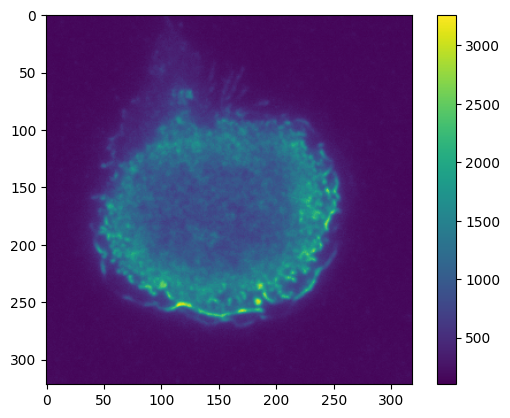

In [19]:
plt.imshow(cells[10])

plt.colorbar()

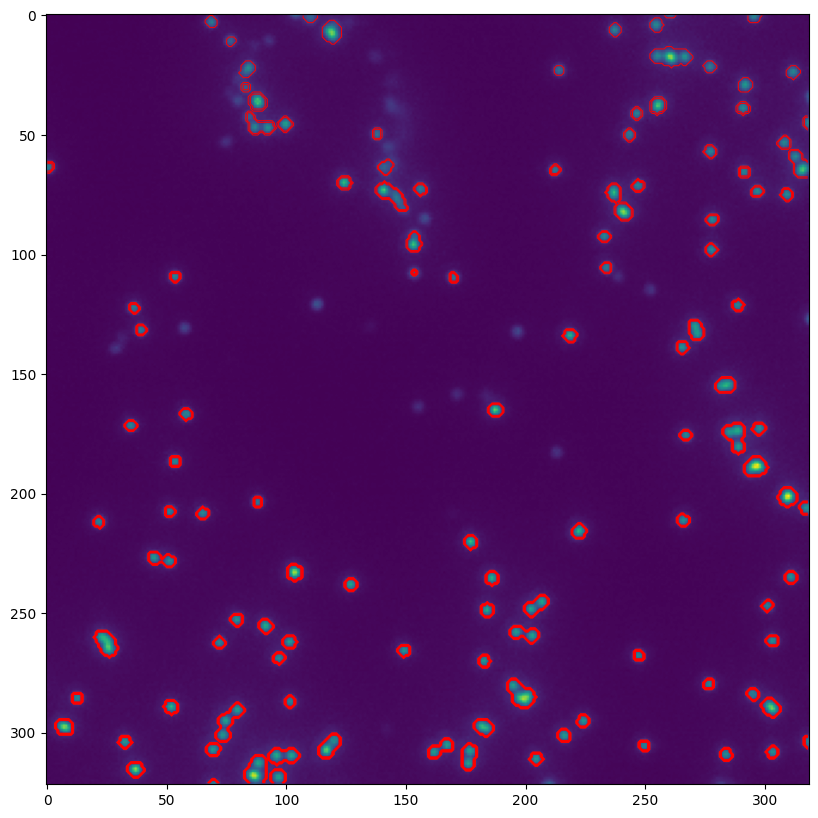

In [20]:
i = 0
label_mask_clean,beads_features= seg_cells(beads[i],threshold_otsu(beads[i]),1,3,100)

for r in beads_features:
    y_center, x_center = r.centroid # note that image coordinates are often given as (y, x) rather than (x, y)
#     ax.text(x_center, y_center, str(r.label), fontweight = 'bold', color = 'white')
plt.show()

[ 547 1228]


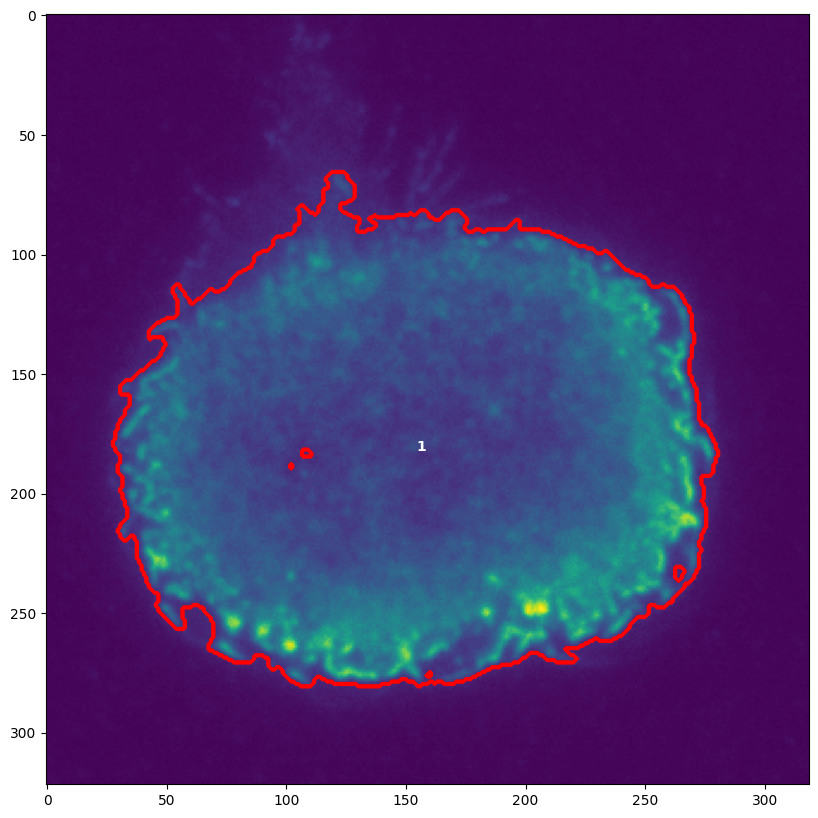

In [21]:
i = 20
print(threshold_multiotsu(cells[i]))
label_mask_clean,cells_features = seg_cells(cells[i],threshold_multiotsu(cells[i])[0],1,1000,2000000,False)
plt.figure(figsize = (10,10))  
ax = plt.subplot()
plt.imshow(cells[i])
plt.contour(label_mask_clean,colors = 'red')

for r in cells_features:
    y_center, x_center = r.centroid # note that image coordinates are often given as (y, x) rather than (x, y)
    ax.text(x_center, y_center, str(r.label), fontweight = 'bold', color = 'white')
plt.show()

In [28]:
features = pd.DataFrame()
for i in range(0,cells.shape[0]):
        beads_label_mask_clean,beads_features = seg_cells(beads[i],threshold_otsu(beads[i]),1,3,100,False)  
        cells_label_mask_clean,cells_features = seg_cells(cells[i],threshold_multiotsu(cells[i])[0],1,1000,10000000,False)
        # shrink the cell mask boundary to target for beads within the cells
        shrinked_cell_mask = fill_multi_contours(cells_label_mask_clean, 4)
        beads_left = shrinked_cell_mask*beads_label_mask_clean
        beads_properties = measure.regionprops(beads_left,intensity_image=cells[i])
        mem_properties = measure.regionprops(beads_left,intensity_image=mem[i])
        for j in range(len(beads_properties)):
            y = beads_properties[j].centroid[0]
            x = beads_properties[j].centroid[1]
            features = features.append([{'y': y,
                                         'x': x,
                                         'area':beads_properties[j].area,
                                         'bbox': beads_properties[j].bbox,
                                         'frame': i,
                                         'wave_intensity': beads_properties[j].intensity_mean,
                                         'perimeter':beads_properties[j].perimeter,
                                         'mem_intensity': mem_properties[j].intensity_mean},])


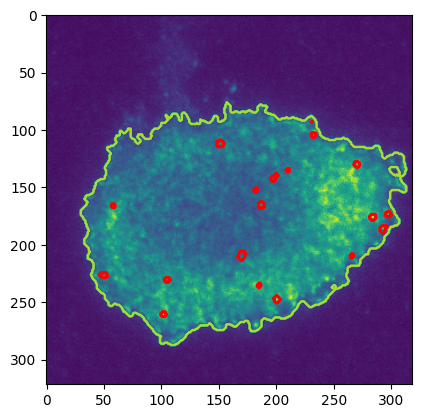

In [29]:
plt.contour(cells_label_mask_clean)
plt.contour(beads_left,colors = 'red')
plt.imshow(cells[-1])

In [30]:
t = tp.link_df(features,10, memory=3)

Frame 89: 19 trajectories present.


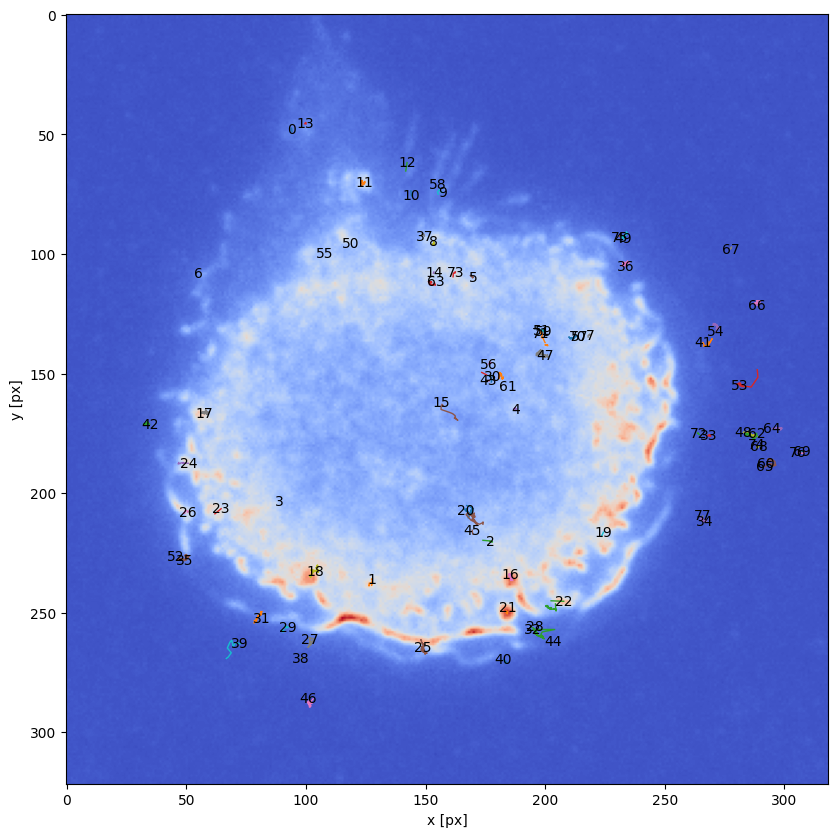

In [31]:
plt.figure(figsize=(10,10))
plt.imshow(cells[10],cmap = 'coolwarm')
# t_new = t[t.frame<10]
tp.plot_traj(t,label = True)
plt.show()

In [32]:
# Calculate the background for WAVE and membrane 
n = 1
# n += 1
wave_background = []
MEM_background = []
for i in np.unique(t.particle):
    particle = t[t.particle == i]
    for frame in particle.frame:
        bbox = particle[particle.frame ==frame].bbox[0]
        width = (bbox[2]-bbox[0]+bbox[3]-bbox[1])//2
        if bbox[0]>=width and bbox[2]+width<512 and bbox[1]-width>=0 and bbox[3]+width<512:
            cell_background = (cells[frame,bbox[0]-width:bbox[0],bbox[1]-width:bbox[3]+width].mean()\
                            +cells[frame,bbox[0]:bbox[2],bbox[1]-width:bbox[1]].mean()\
                            +cells[frame,bbox[0]:bbox[2],bbox[3]:bbox[3]+width].mean()\
                            +cells[frame,bbox[2]:bbox[2]+width,bbox[1]-width:bbox[3]+width].mean())/4
            mem_background = (mem[frame,bbox[0]-width:bbox[0],bbox[1]-width:bbox[3]+width].mean()\
                            +mem[frame,bbox[0]:bbox[2],bbox[1]-width:bbox[1]].mean()\
                            +mem[frame,bbox[0]:bbox[2],bbox[3]:bbox[3]+width].mean()\
                            +mem[frame,bbox[2]:bbox[2]+width,bbox[1]-width:bbox[3]+width].mean())/4
            wave_background.append(cell_background)
            MEM_background.append(mem_background)
        else:
            t = t[t.bbox !=bbox]
t['wave_background'] = wave_background
t['mem_background'] = MEM_background
t['cell'] = n

In [33]:
t['norm_wave'] = t['wave_intensity']/t['wave_background']
t['norm_mem'] = t['mem_intensity']/t['mem_background']

# Calculate and plot the mean WAVE vs. membrane intensity on beads

In [22]:
full_t = pd.read_csv(PATH + "csv_data/full_data_200nm.csv")

In [23]:
# Calculate the average of the top three WAVE complex intensity on each bead, 
# then calculate the average of wave/membrane intensity on beads in each cell.
result_wave = []
result_mem = []
for p in np.unique(full_t.cell):
    max_wave = []
    cor_mem= []
    t = full_t[full_t.cell == p]
    n = 0
    for i in np.unique(t.particle):
        cur = t[t.particle == i]
        if len(cur)>=10 and cur.norm_wave.max()>=3:
            n+=1
            ind = np.argpartition(cur.norm_wave, -3)[-3:]
            max_three = cur.iloc[ind,:]
            print(max_three)
            max_wave.append(max_three.norm_wave.mean())
            cor_mem.append(max_three.norm_mem.mean())
    print(n)
    result_wave.append(np.mean(max_wave))
    result_mem.append(np.mean(cor_mem))

      Unnamed: 0           y           x  area                  bbox  frame  \
1570           0  215.644068  307.254237    59  (211, 302, 221, 313)     22   
705            0  216.236364  308.218182    55  (212, 303, 221, 314)     10   
983            0  216.125000  307.910714    56  (212, 303, 222, 314)     14   

      wave_intensity  perimeter  mem_intensity  particle  wave_background  \
1570     1233.745763  30.970563    1272.372881         5       375.815625   
705      1448.600000  32.142136    1268.200000         5       411.622449   
983      1151.517857  32.384776    1260.535714         5       324.574747   

      mem_background  cell  norm_wave  norm_mem  
1570     1284.666667     1   3.282849  0.990430  
705      1572.224490     1   3.519244  0.806628  
983      1145.672121     1   3.547774  1.100259  
      Unnamed: 0           y           x  area                  bbox  frame  \
1138           0  266.068966  288.620690    29  (263, 286, 270, 292)     16   
2147           0

       Unnamed: 0           y           x  area                  bbox  frame  \
20030           0  227.400000  160.960000    25  (225, 159, 231, 164)      0   
20164           0  226.500000  161.500000    24  (224, 159, 230, 165)      2   
20095           0  226.909091  161.090909    22  (225, 159, 230, 164)      1   

       wave_intensity  perimeter  mem_intensity  particle  wave_background  \
20030     1249.640000  15.656854    1139.280000         1       629.150000   
20164      967.000000  15.313708    1153.166667         1       471.996875   
20095     1194.136364  14.242641    1476.818182         1       393.807870   

       mem_background  cell  norm_wave  norm_mem  
20030     1388.889583     5   1.986235  0.820281  
20164     1050.164375     5   2.048742  1.098082  
20095     1091.571759     5   3.032282  1.352928  
       Unnamed: 0           y           x  area                  bbox  frame  \
20240           0  230.413793  282.275862    29  (228, 280, 234, 286)      3   
20

       Unnamed: 0      y      x  area                  bbox  frame  \
45790           0  282.0  390.0    21  (280, 388, 285, 393)     18   
45976           0  282.0  390.0    21  (280, 388, 285, 393)     21   
46120           0  282.8  390.0    10  (281, 389, 285, 392)     23   

       wave_intensity  perimeter  mem_intensity  particle  wave_background  \
45790      796.571429  13.656854     561.761905        19       357.439815   
45976     1210.809524  13.656854     574.523810        19       450.443333   
46120     1543.600000   8.828427     674.600000        19       461.784722   

       mem_background  cell  norm_wave  norm_mem  
45790      634.187500    13   2.228547  0.885798  
45976      556.900000    13   2.688040  1.031646  
46120      491.050926    13   3.342683  1.373788  
       Unnamed: 0           y           x  area                  bbox  frame  \
45605           0  300.407407  384.259259    27  (298, 382, 304, 388)     14   
45803           0  300.384615  384.384615 

In [24]:
result = pd.DataFrame({'Membrane':result_mem,'WAVE complex':result_wave})

In [25]:
ttest_rel(result['Membrane'],result['WAVE complex'])[1]

6.322904517629102e-08

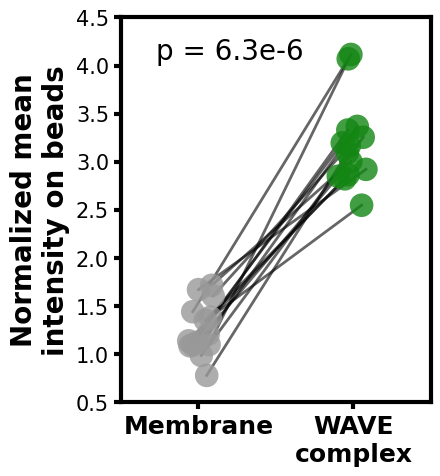

In [27]:
f, ax = plt.subplots(figsize =(4,5))
plt.ylim(0.5,4.5)
plt.ylabel('Normalized mean\nintensity on beads',size = 20,fontweight = 'bold')
plt.xticks(ticks = [0,1],labels = ['Membrane','WAVE\ncomplex'],size = 18,fontweight = 'bold')
plt.xlim(-0.4,1.4)
pal = ['#999999',"#138613"]
sns.stripplot(result,size =17, ax=ax,palette=pal,alpha = 0.8)

# Now connect the dots
# Find idx0 and idx1 by inspecting the elements return from ax.get_children()
# ... or find a way to automate it
idx0 = 0
idx1 = 1
locs1 = ax.get_children()[idx0].get_offsets()
locs2 = ax.get_children()[idx1].get_offsets()

set1 = result['Membrane']
set2 = result['WAVE complex']
# before plotting, we need to sort so that the data points
# correspond to each other as they did in "set1" and "set2"
sort_idxs1 = np.argsort(set1)
sort_idxs2 = np.argsort(set2)

# revert "ascending sort" through sort_idxs2.argsort(),
# and then sort into order corresponding with set1
locs2_sorted = locs2[sort_idxs2.argsort()][sort_idxs1]

for i in range(locs1.shape[0]):
    x = [locs1[i, 0], locs2_sorted[i, 0]]
    y = [locs1[i, 1], locs2_sorted[i, 1]]
    ax.plot(x, y, color="black", alpha=0.6,lw = 2)
y, h, col = 3, 0.3, 'k'
plt.text(0.2, 4, 'p = 6.3e-6', ha='center', va='bottom', color=col,size = 20)
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)

# increase tick width
ax.tick_params(width=3,size =5)
plt.yticks(fontsize = 15)
plt.savefig(PATH + 'result_figures/Fig4D_wave_vs_mem.png',dpi = 300,bbox_inches = 'tight')

# Plot WAVE and membrane signal on beads over time

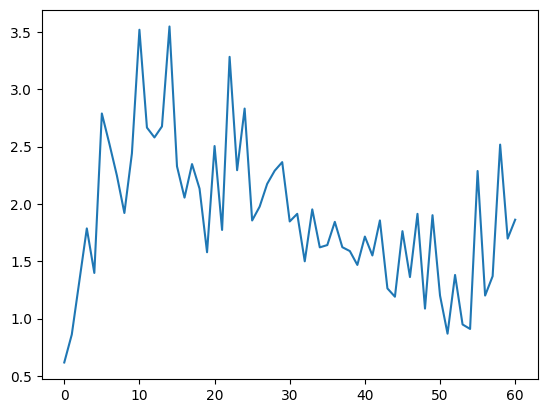

2.4711259174082096 4 24 1.5918326202909856


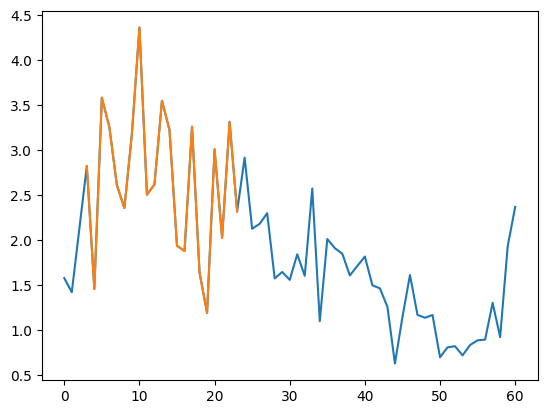

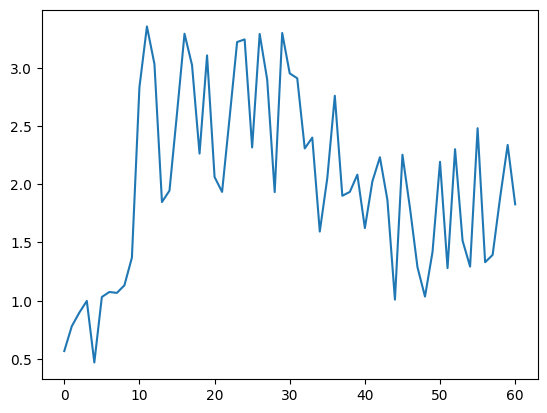

2.71853850418884 10 30 2.100503918434999


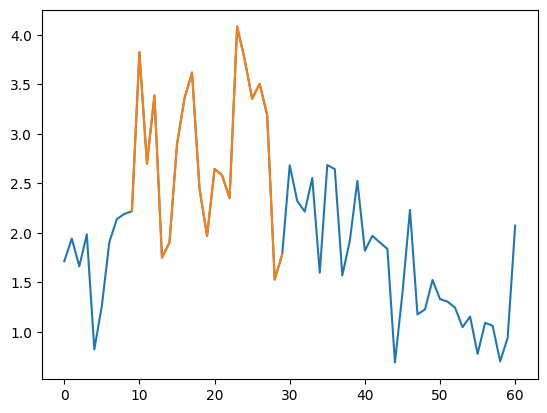

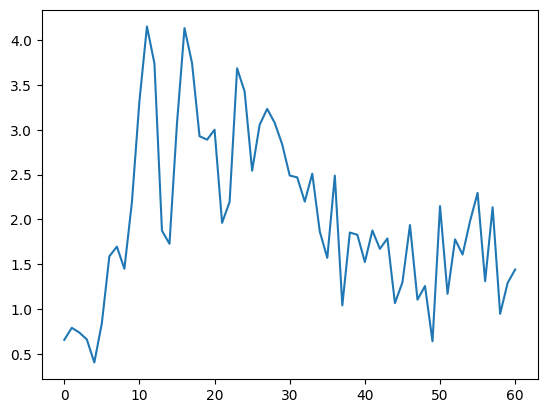

3.0044853920025822 9 29 1.820566592415549


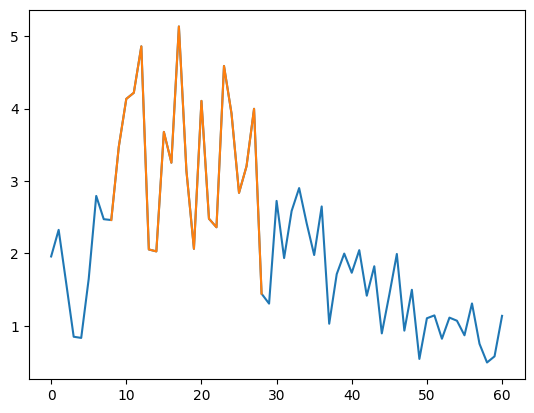

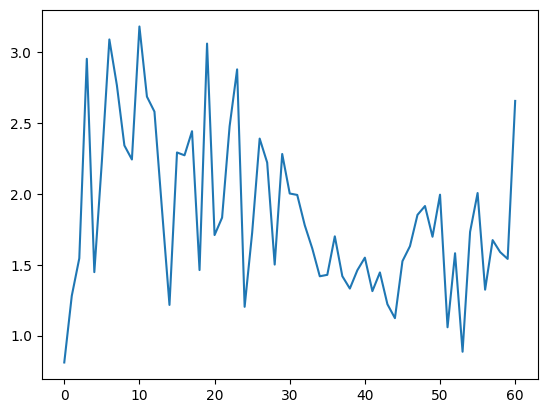

2.3354605877355716 2 22 1.4129166272928955


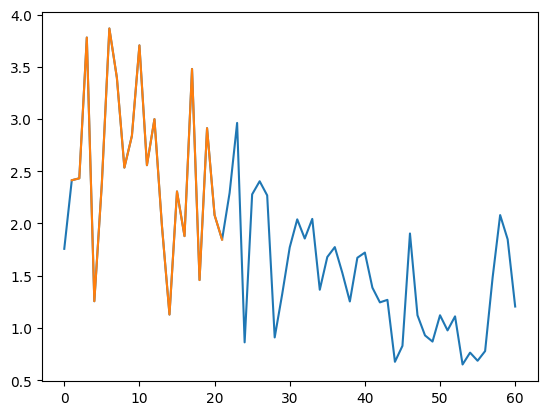

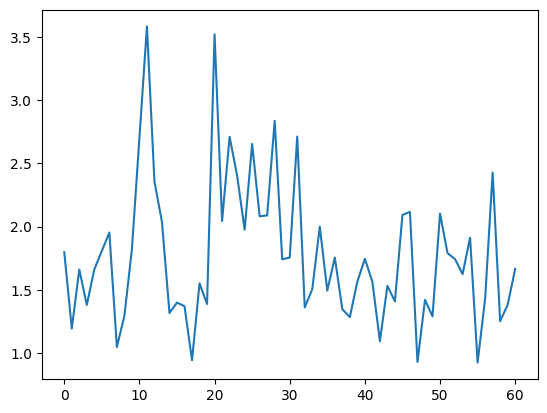

2.116953217376382 10 30 2.7017269595947515


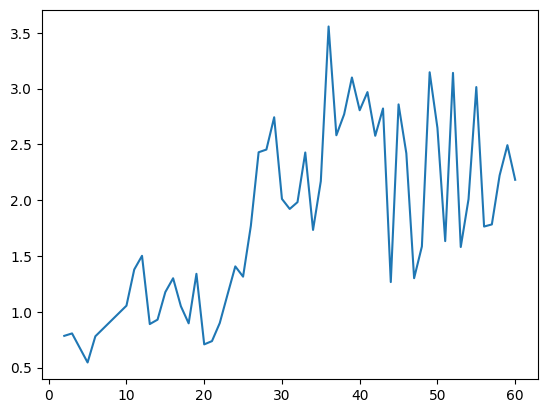

2.473491813631383 34 54 2.079883435261043


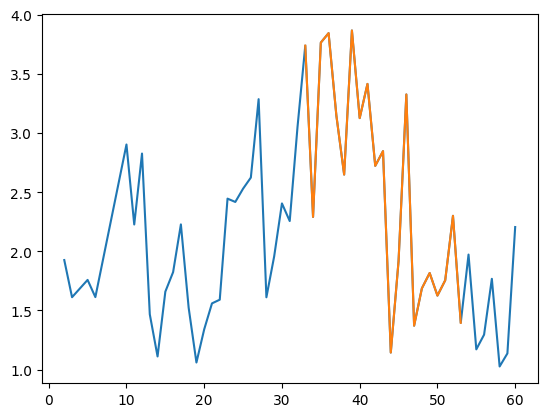

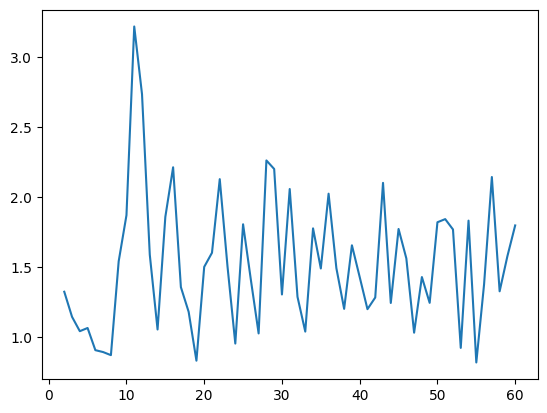

1.7084662789113922 8 28 0.8841895628593105


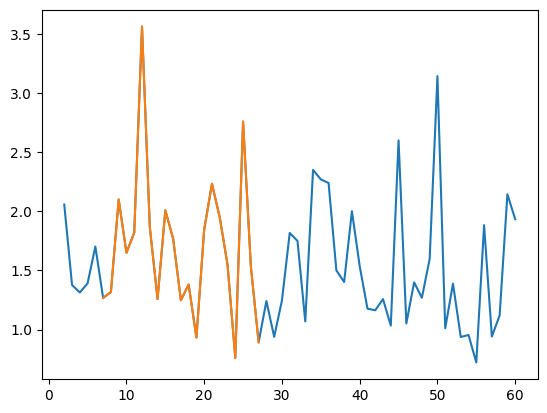

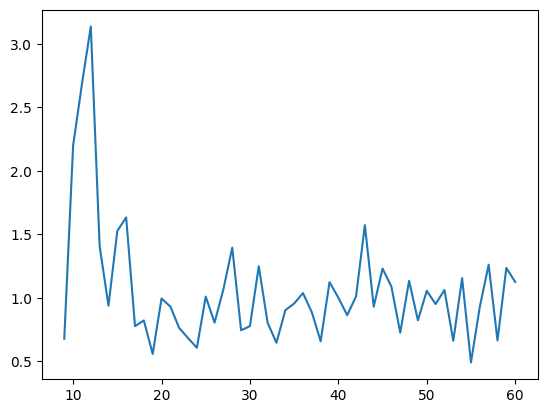

1.2119293173766692 9 29 1.437975459704369


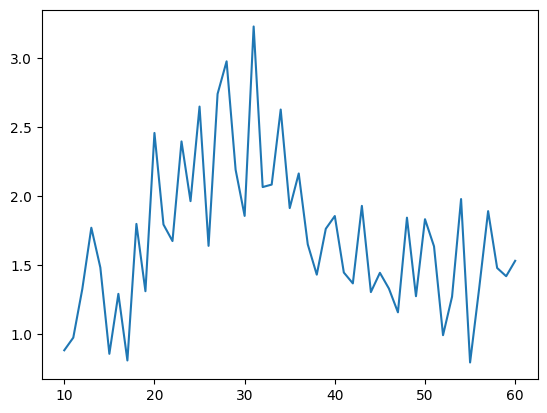

2.148495197001147 19 39 1.5540532741751432


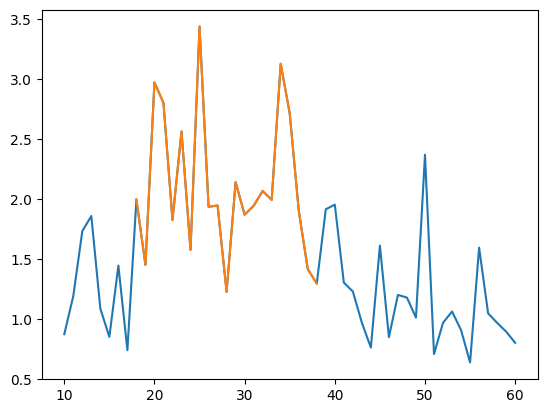

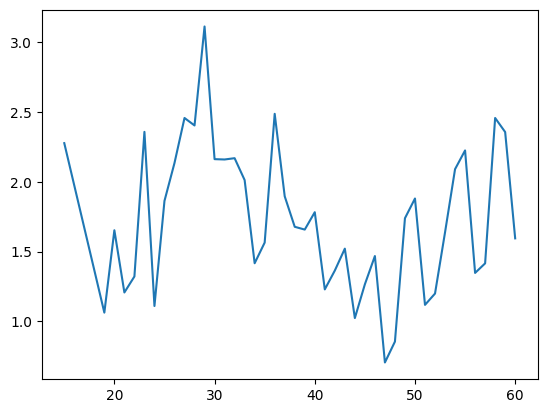

1.9336353216871767 19 39 1.3572919022748504


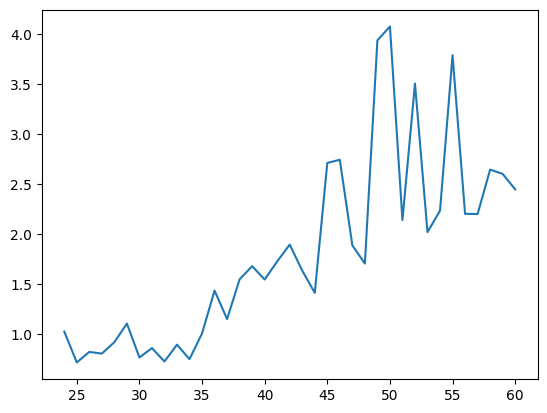

2.397651898714576 38 58 1.3507465491544832


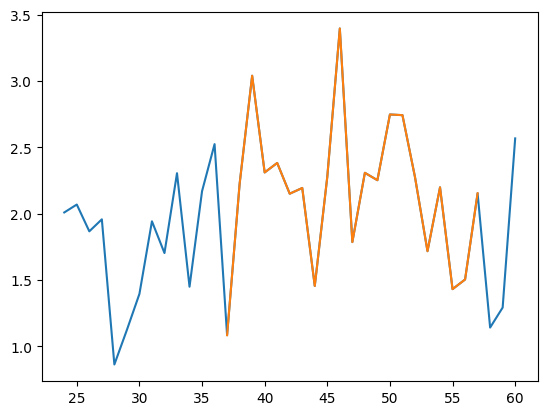

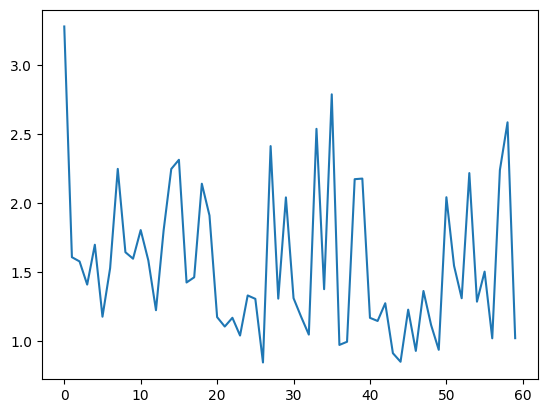

1.7555976092137922 -1 19 2.4429154232399752


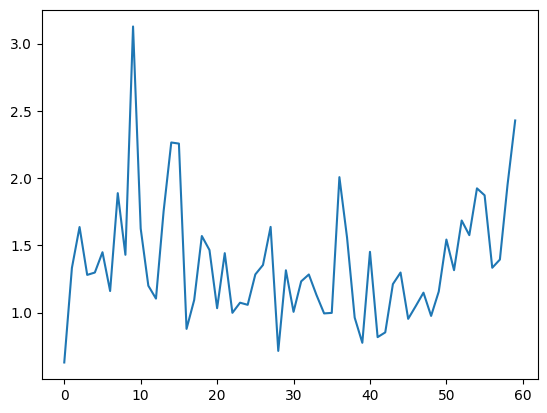

1.5372394136749032 0 20 0.9803344476030126


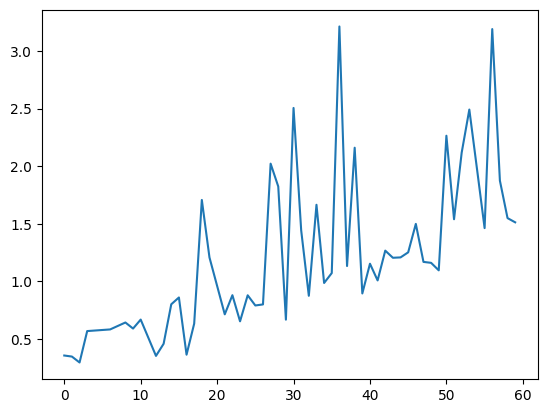

1.6415164857033713 35 55 1.0299198587636775


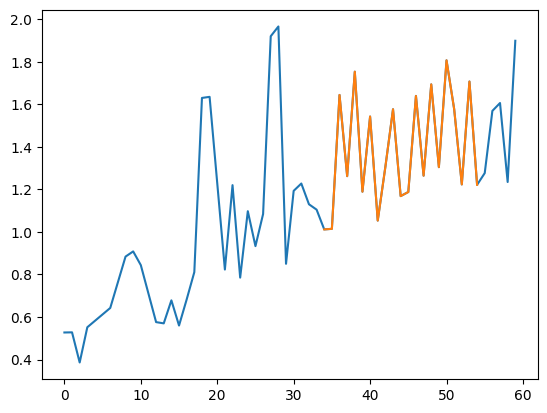

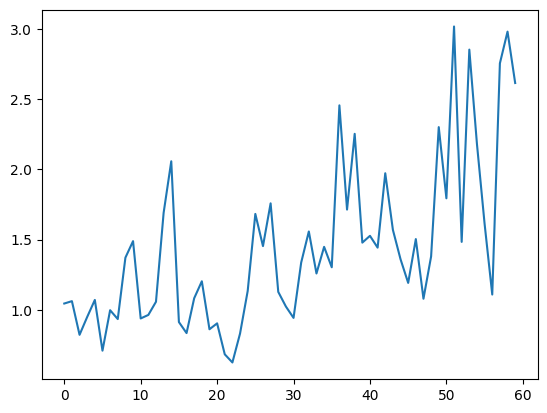

1.8493091752570965 37 57 2.0842805358556675


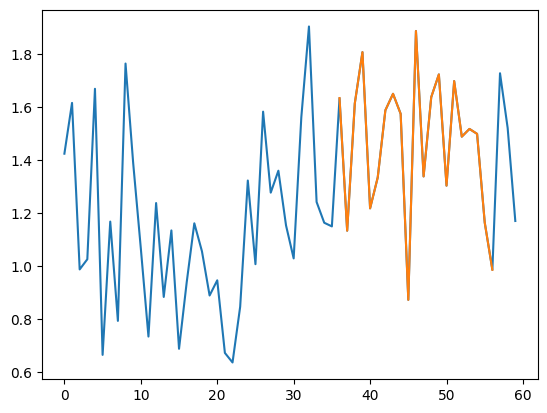

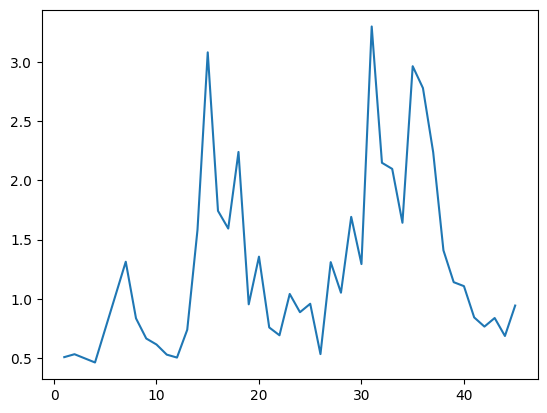

1.597153347601699 16 36 2.4122321955021437


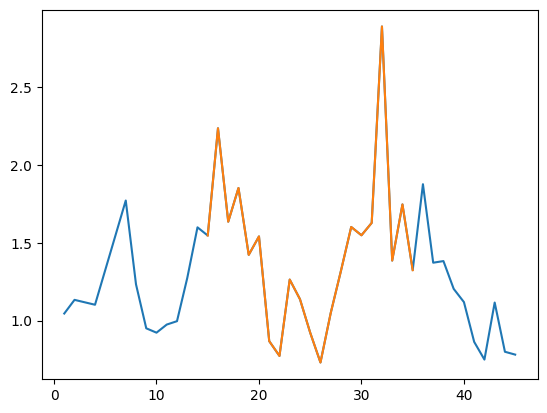

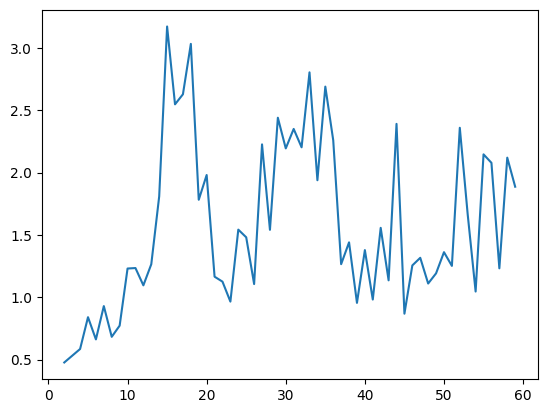

2.042857698616625 14 34 1.5368348225327084


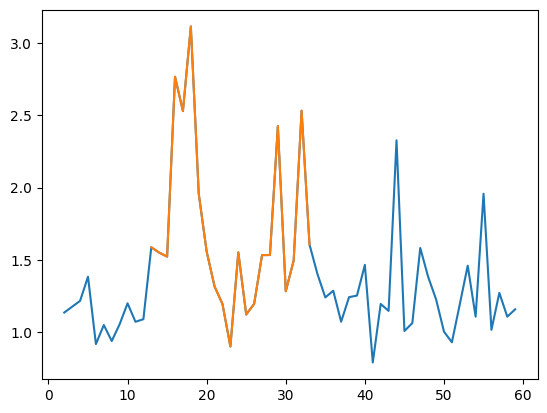

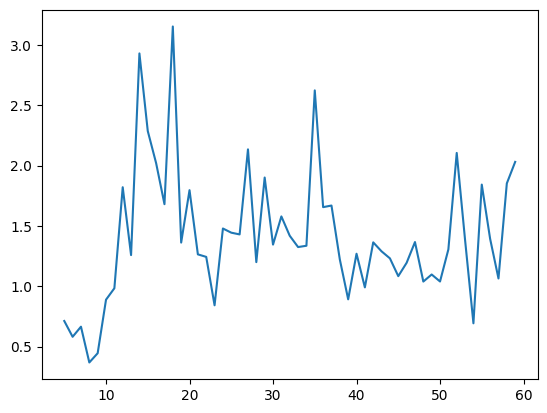

1.6946277005945842 11 31 0.9357207296764274


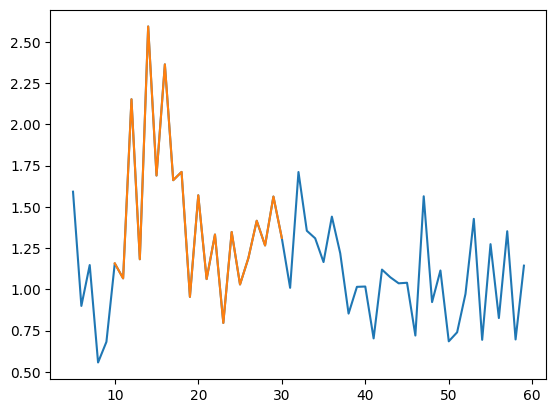

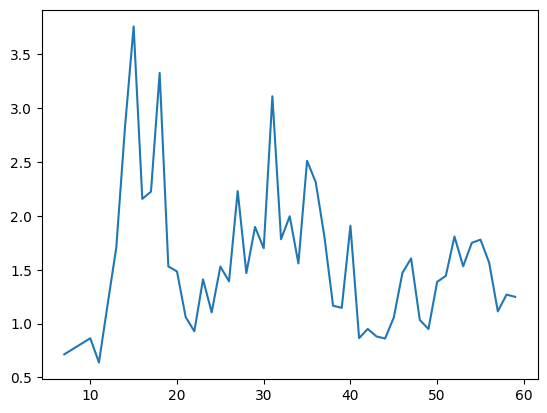

1.935178546753646 12 32 0.908987893046949


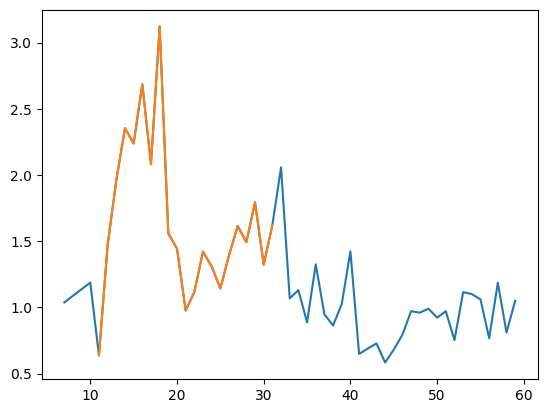

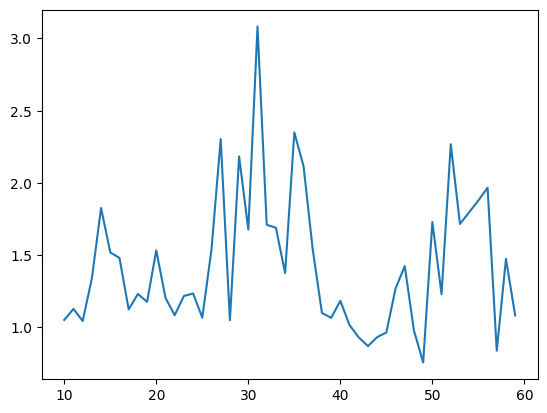

1.5952322922719706 16 36 1.5001882226321368


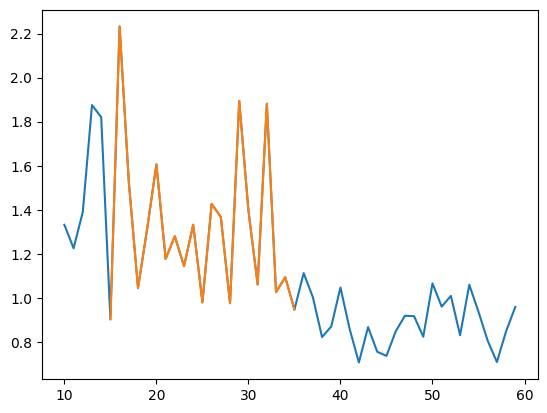

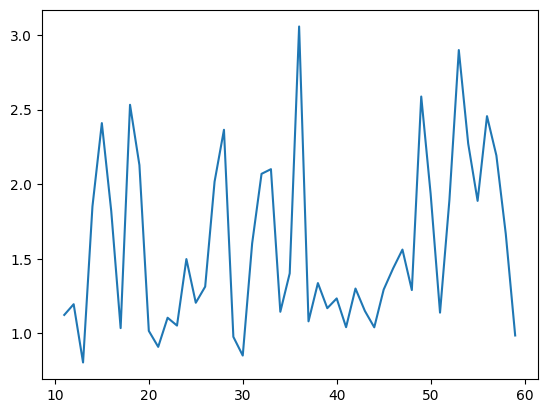

1.6690796335043976 35 55 1.272895233648967


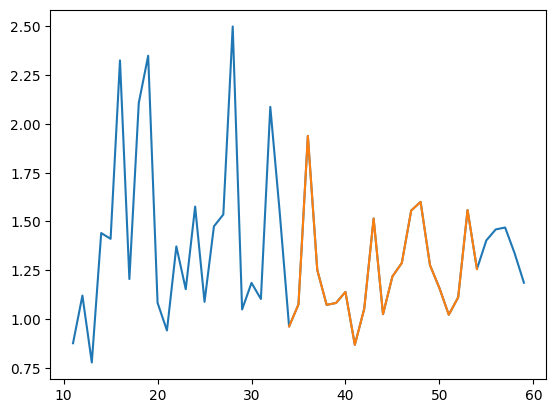

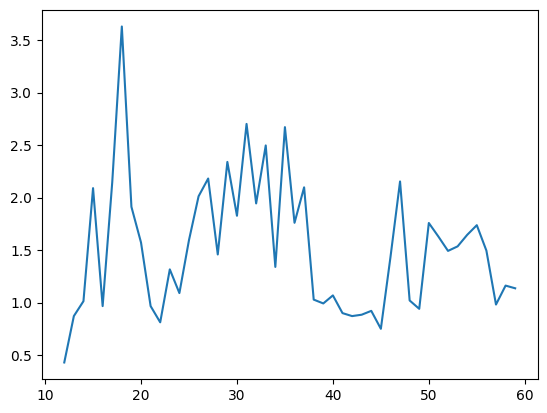

1.8988341353010423 16 36 1.5283868489107313


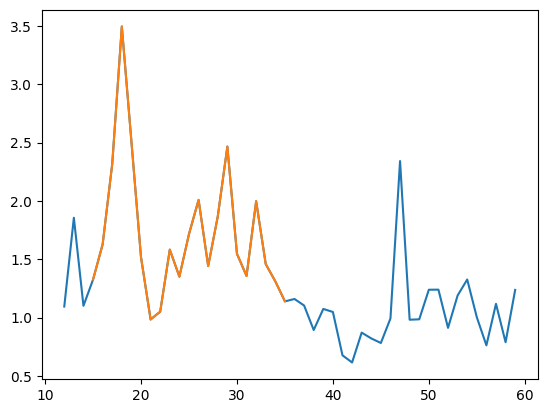

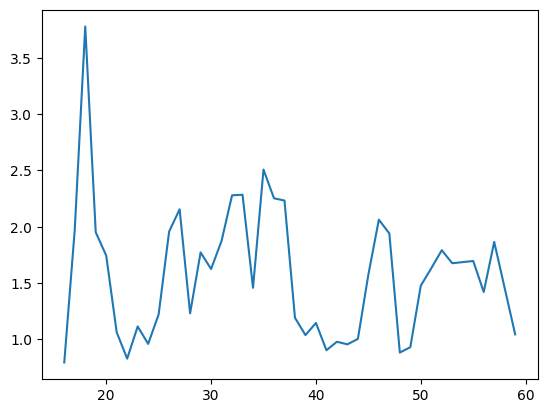

1.8224630197368588 16 36 1.3851912020063948


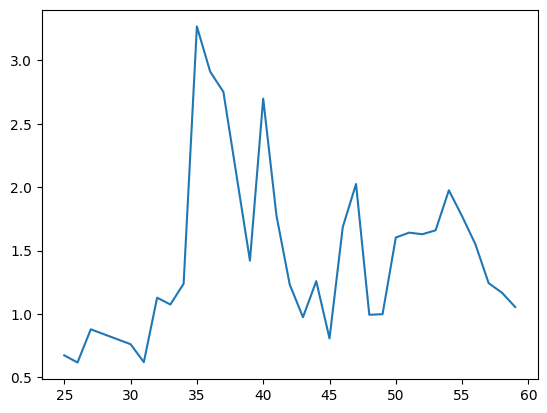

1.7547101719446907 34 54 1.1573623867520475


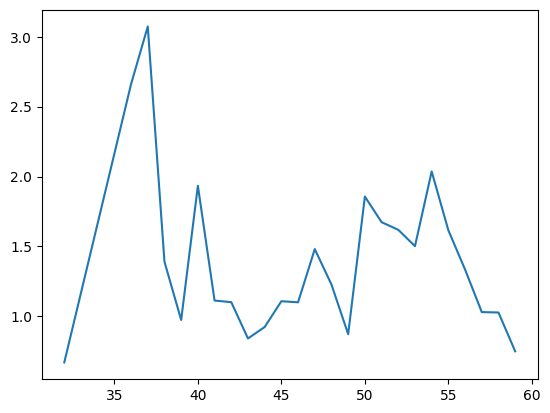

1.50512539064396 35 54 2.867371271738724


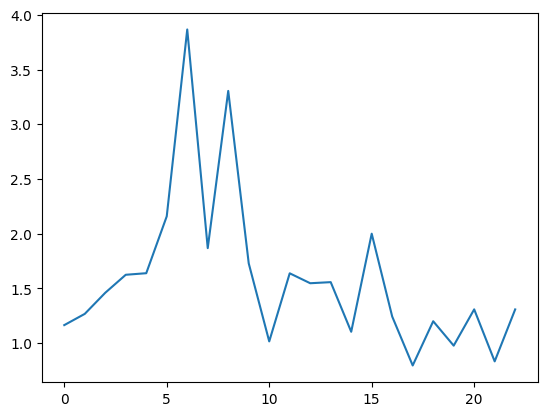

1.6409320109470193 -1 19 1.2154341231170906


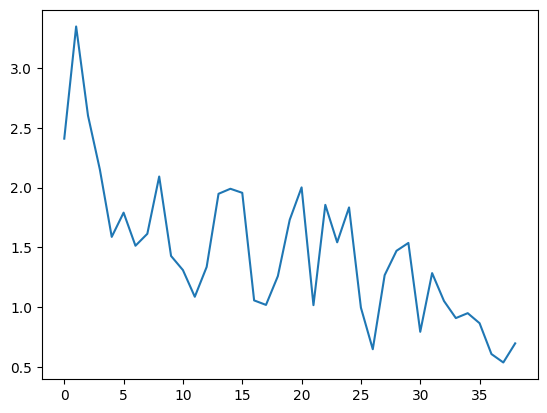

1.7728953127421039 -1 19 2.8787805786433385


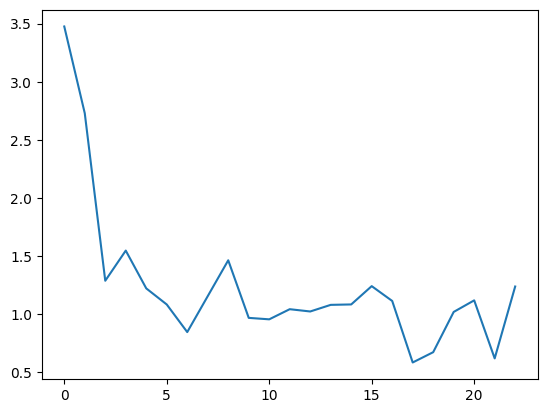

1.269853165620066 -1 19 3.1020360266967364


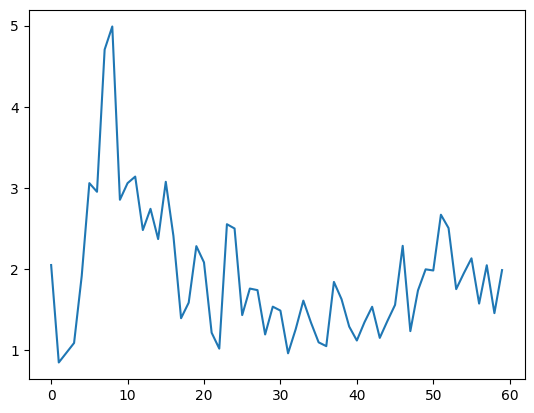

2.5912857994764043 3 23 1.5040597649804364


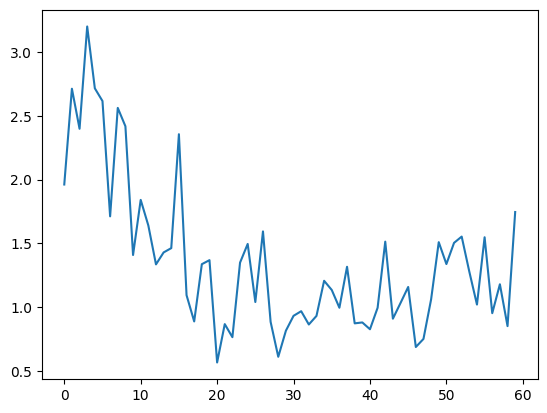

1.857853718707856 -1 19 2.3361003504326767


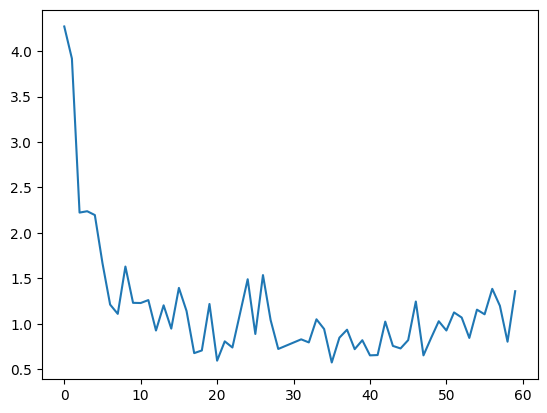

1.5708168881387048 -1 19 4.093701363056531


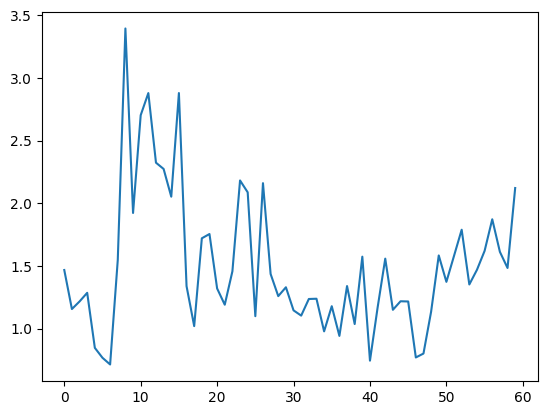

1.9402858976754733 6 26 0.7406956199743511


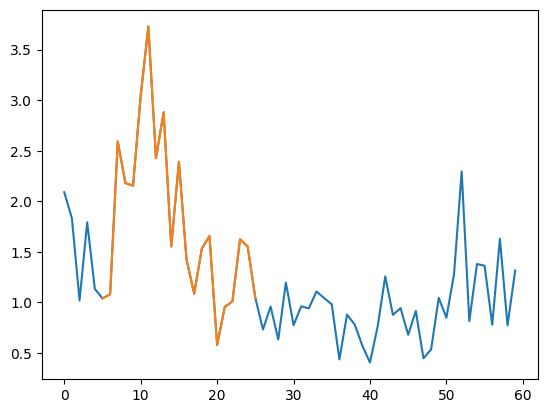

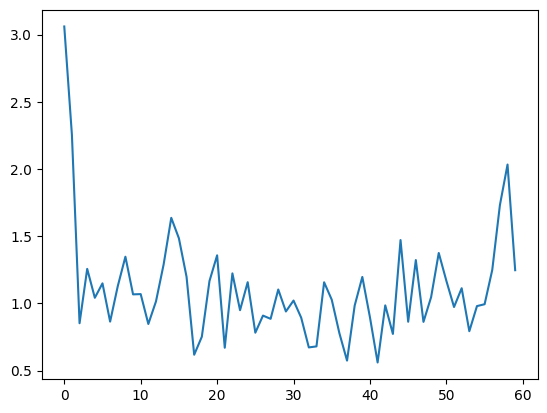

1.2593989097911444 -1 19 2.656812671889143


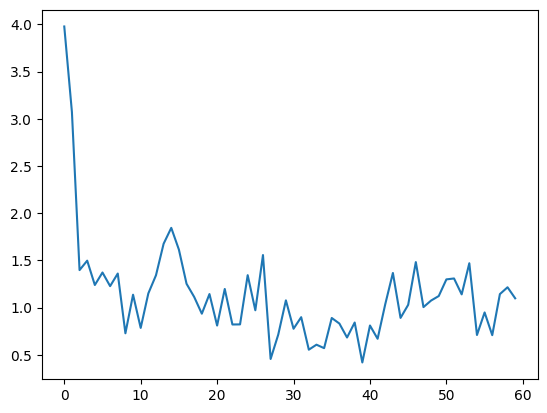

1.4602416826235824 -1 19 3.5249514208030925


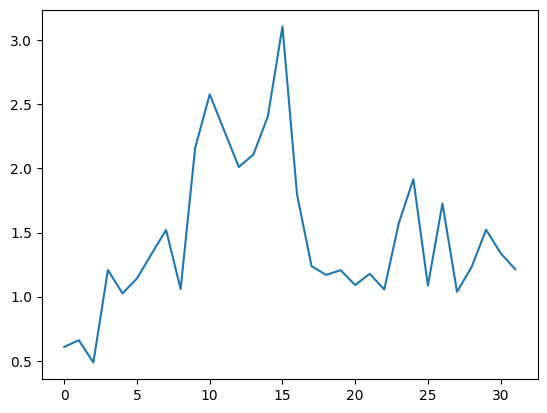

1.696347633656824 5 25 1.0834776242931183


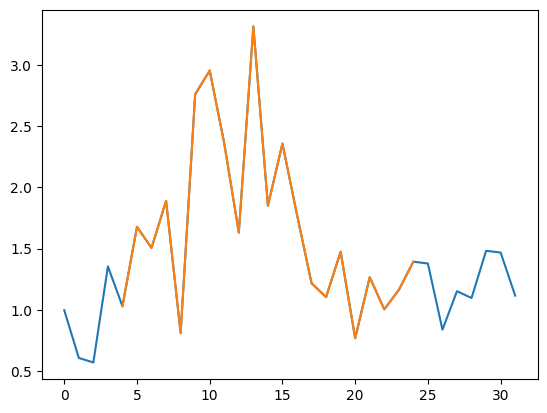

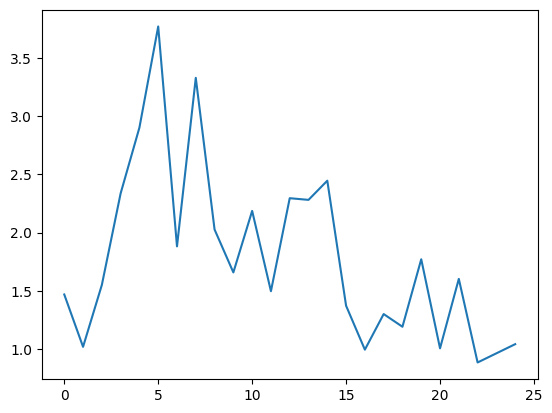

1.9367480346015675 2 21 1.2839515939591435


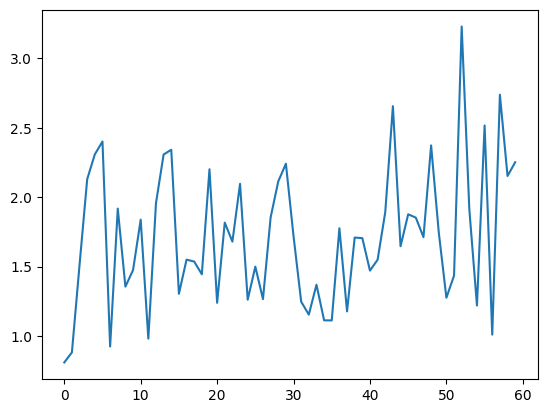

1.8895064814214602 37 57 1.4763959185483717


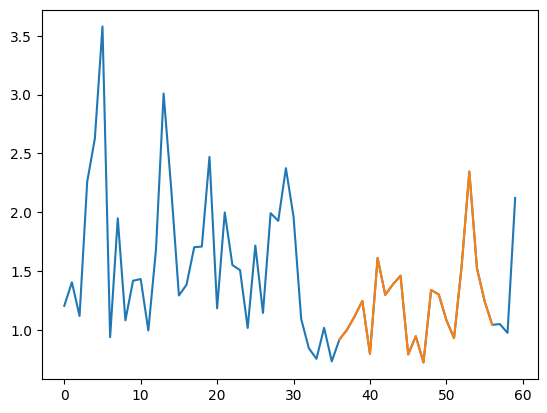

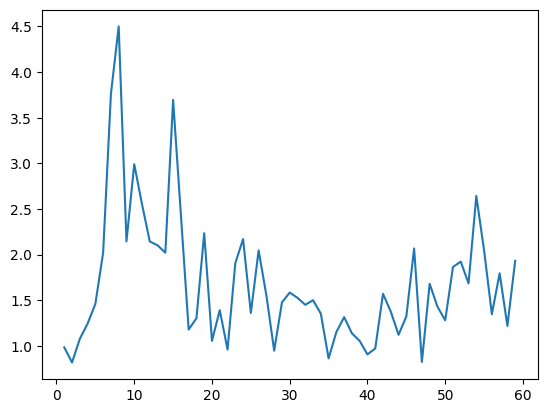

2.189383533451987 5 25 1.3519184326801605


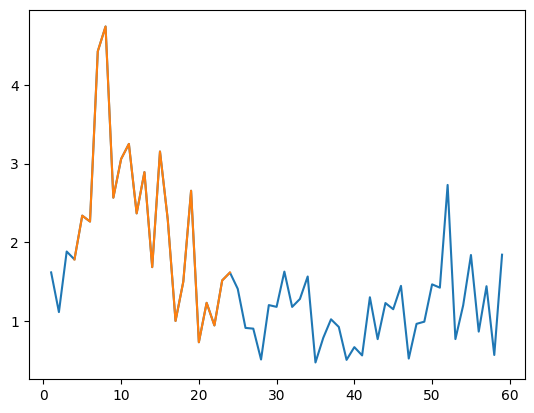

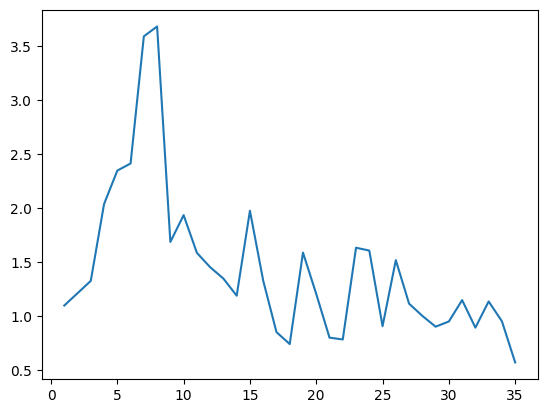

1.7075369441803416 0 20 1.2108532149622206


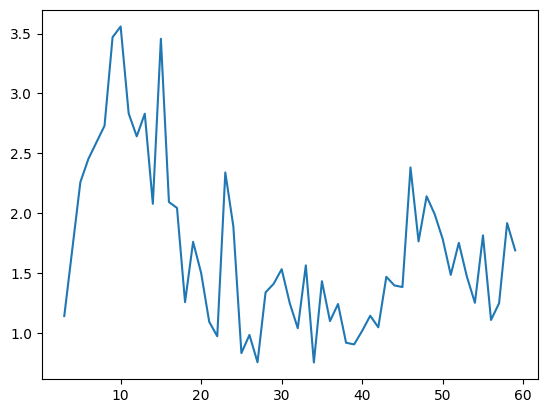

2.275901559778865 4 23 1.6991184500463339


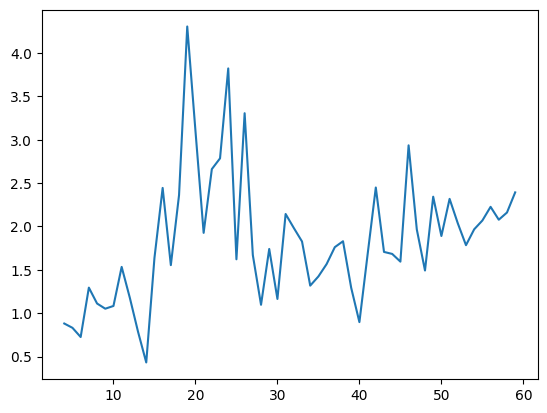

2.185279784732484 14 34 0.6084664015457675


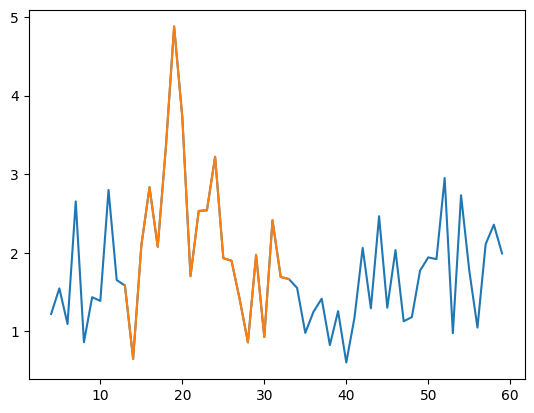

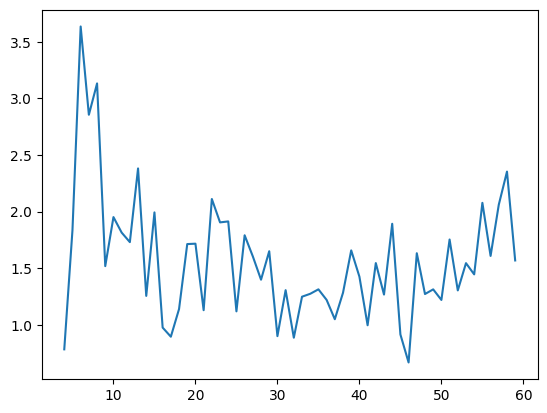

1.844261589894181 4 24 1.3100541959897976


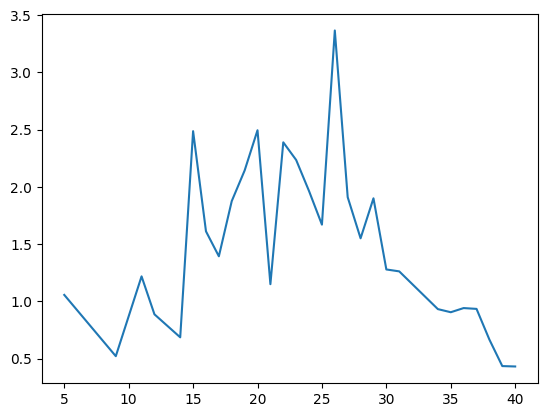

1.8543241116082672 13 30 0.7869683857572163


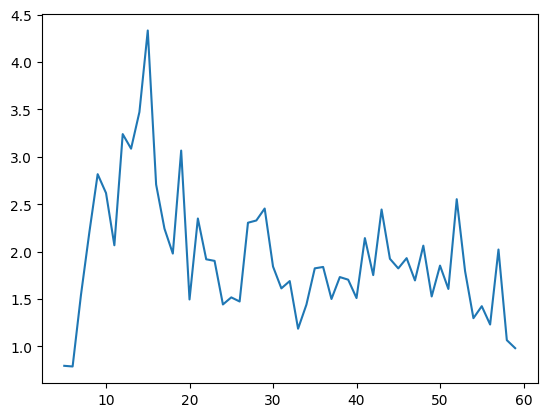

2.4189884904903103 8 28 1.8713058695467777


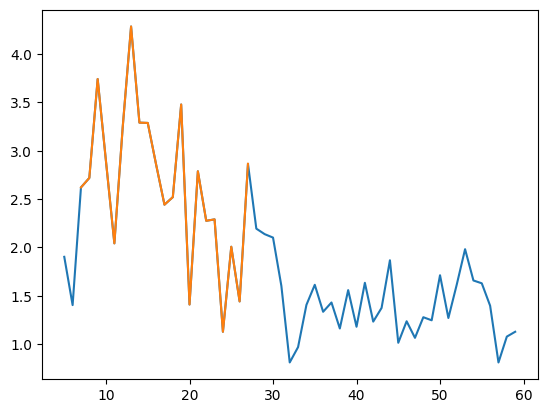

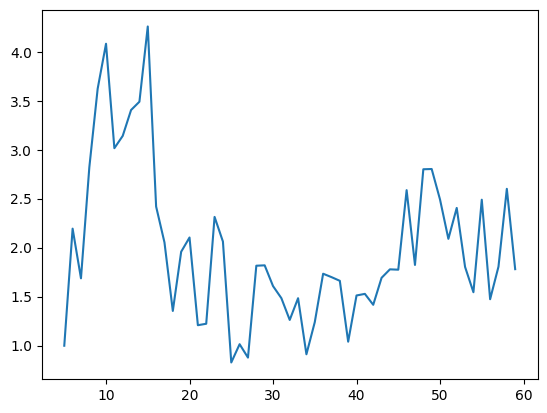

2.392851490572288 5 25 1.5958456125447151


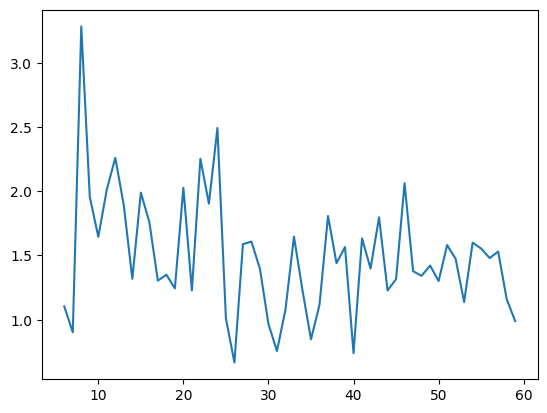

1.751574541683723 7 27 1.0026436883909016


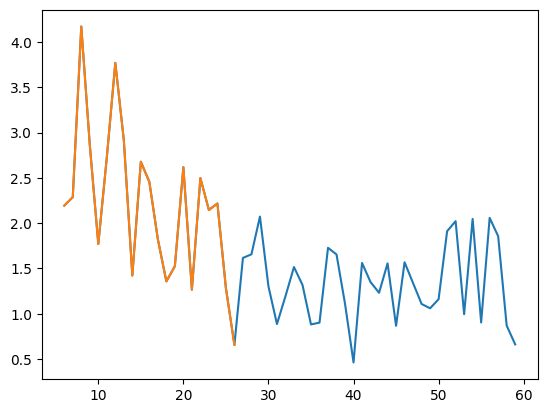

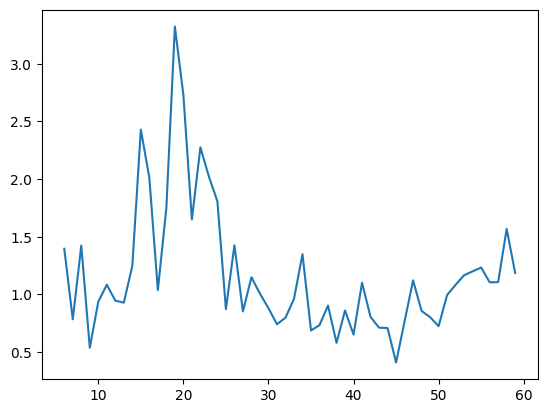

1.5528280292790686 5 25 1.0897389719724817


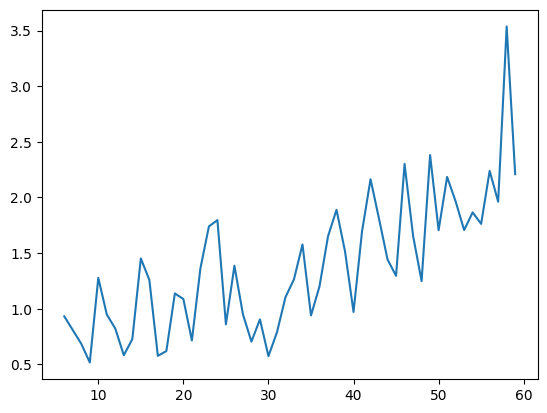

1.8712539693413914 37 57 1.4258503669933122


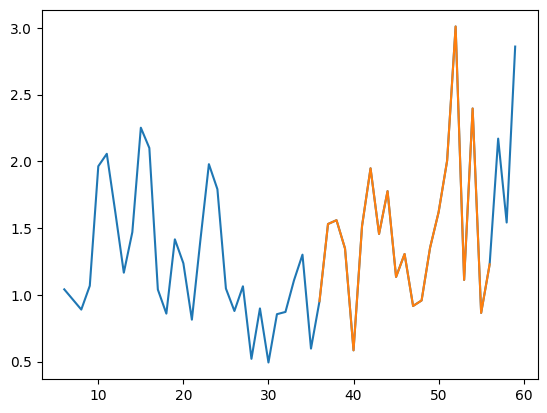

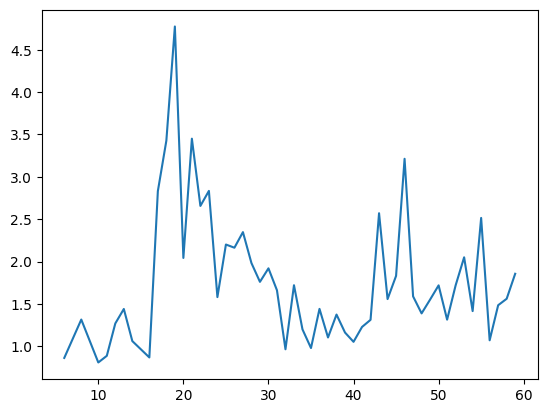

2.1847410823400226 12 32 1.079131558247015


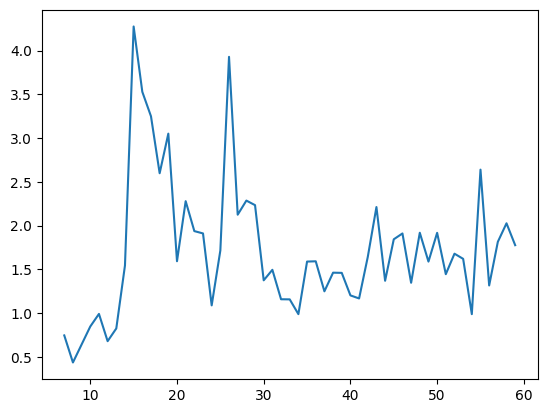

2.1690503902404297 14 34 1.1838407731792164


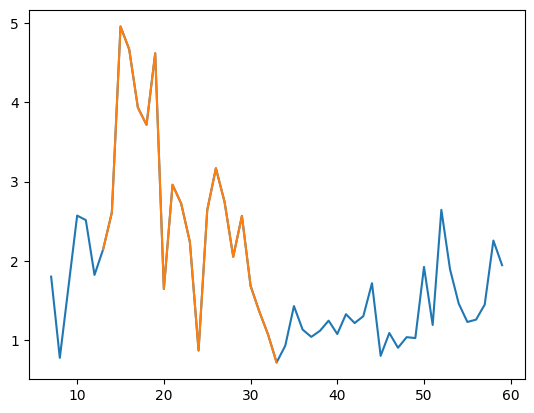

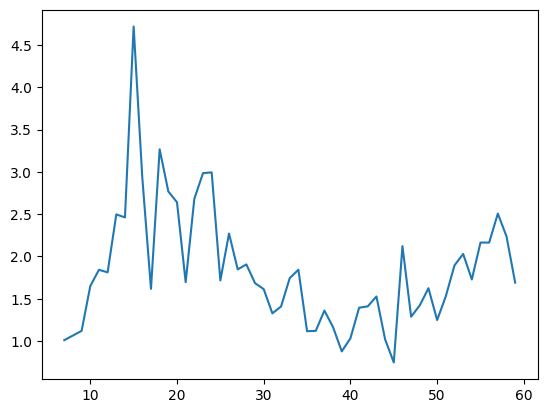

2.371294374382912 8 27 1.0661004892321317


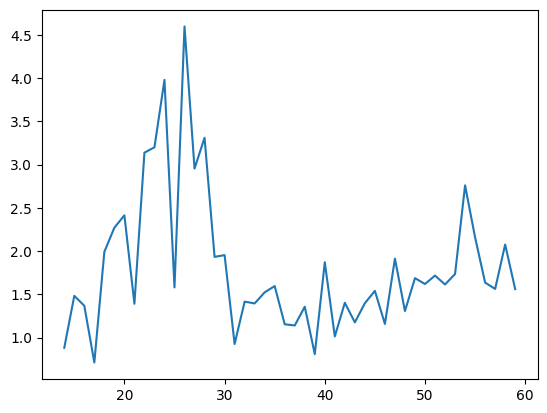

2.153348327213368 17 37 1.0403182399115192


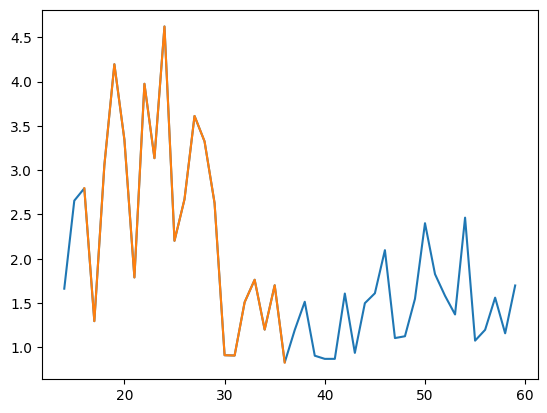

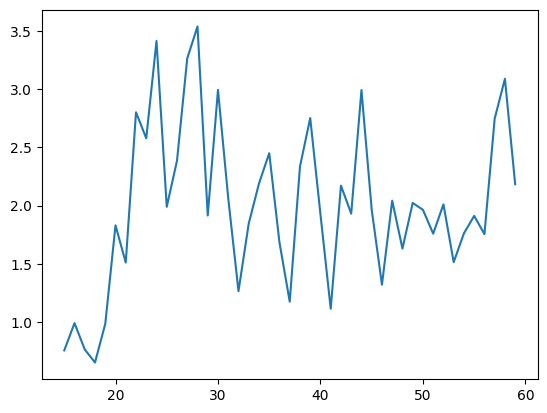

2.281820031888581 19 39 0.8169882261280834


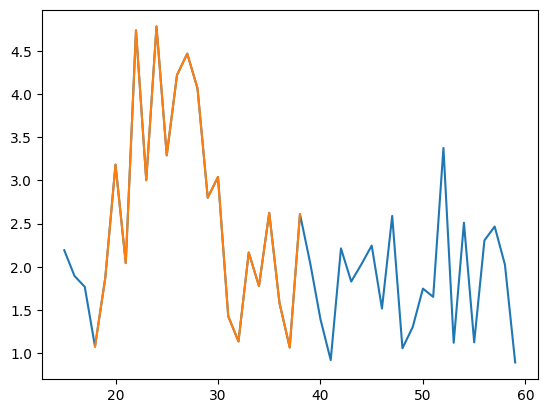

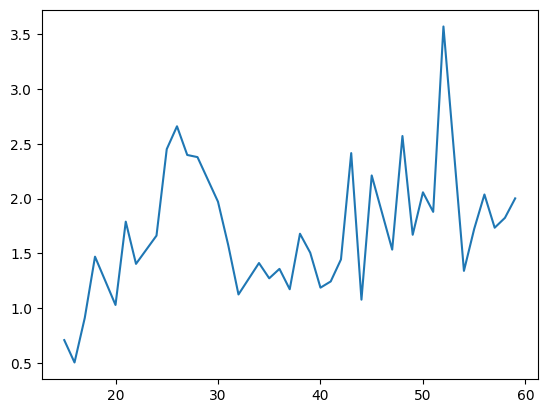

1.8584298408061684 37 57 1.265577560106978


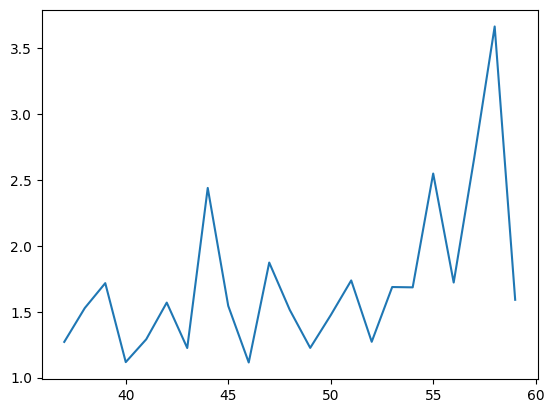

1.7444196906750729 37 57 1.399959010570583


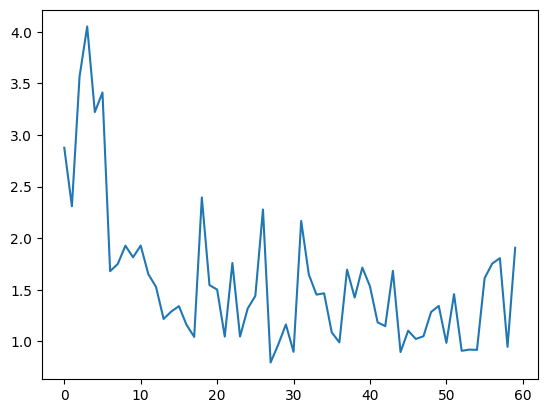

2.0574331859554564 -1 19 2.5924269249545393


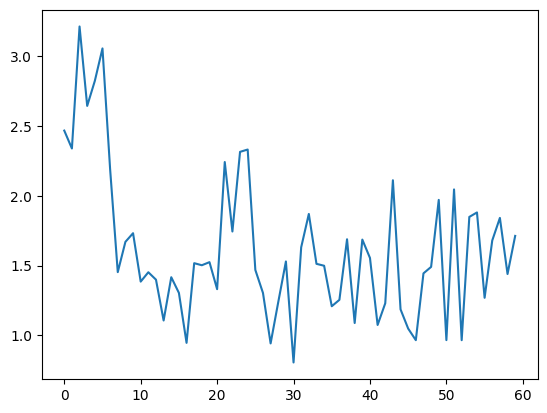

1.8320548387592313 -1 19 2.4032269318652846


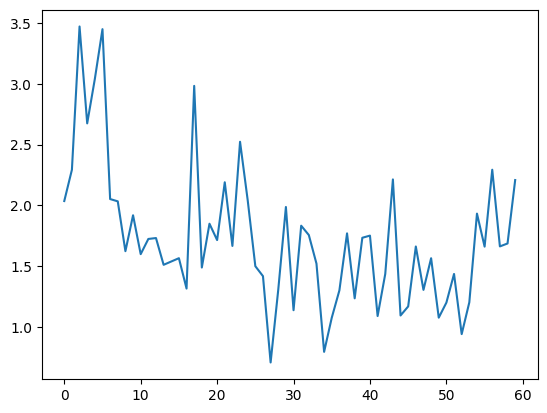

2.1118076940029407 0 20 2.1647712570586353


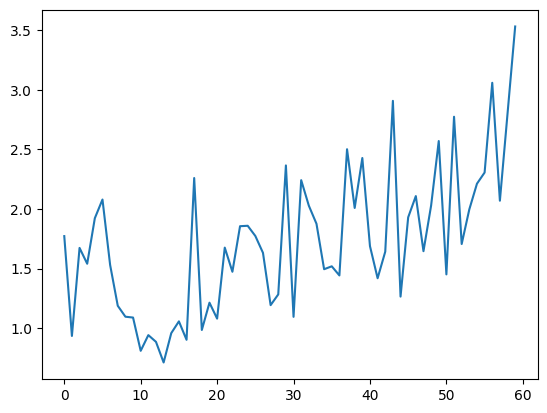

2.0826033718319947 36 56 1.4815367214724273


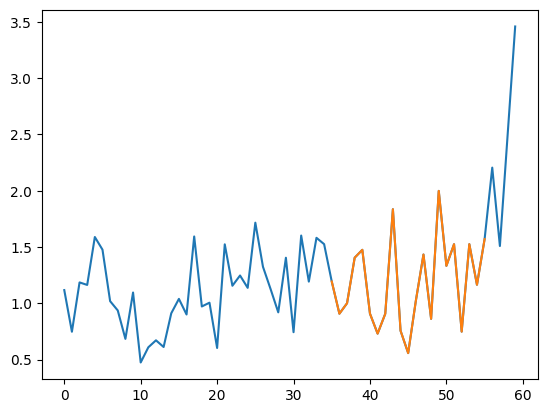

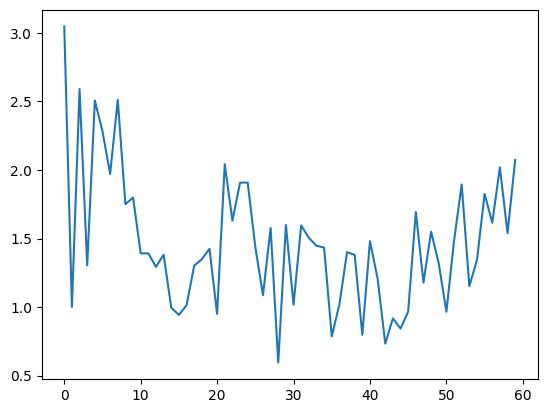

1.628629283458989 -1 19 2.0239914327668203


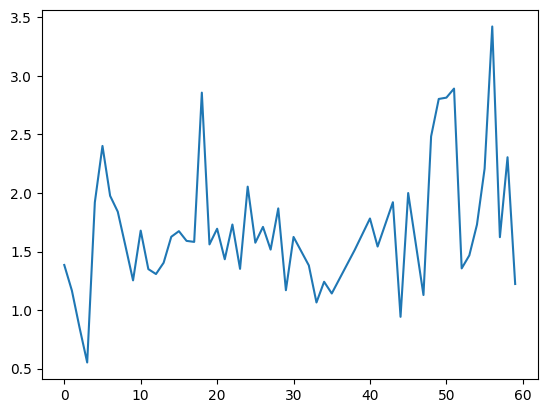

1.99991704360857 37 55 1.6473506725181992


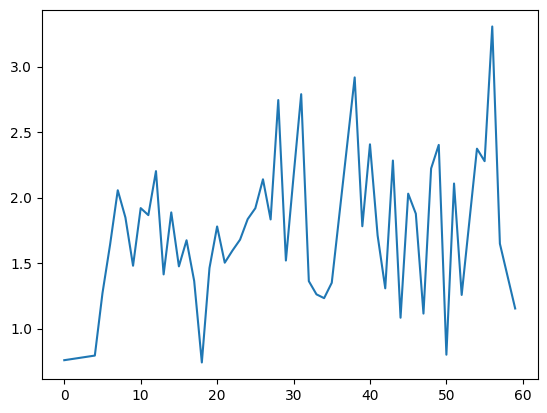

1.9586444133463283 37 55 2.3493313623370367


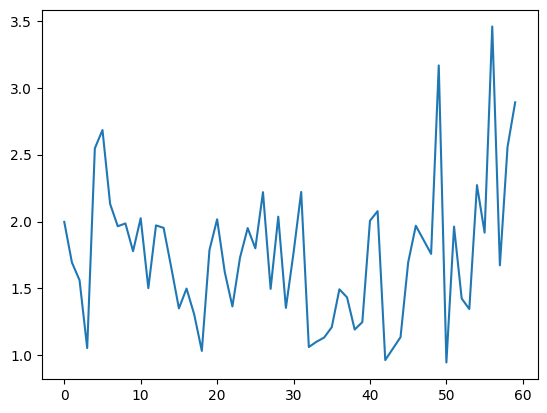

1.8301695869435477 37 57 1.463567878392044


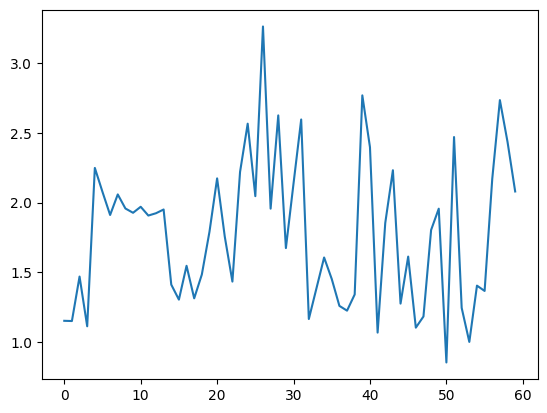

1.9831774050408413 19 39 1.6372272467581341


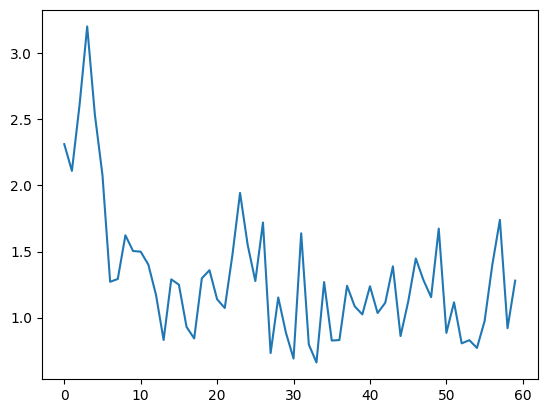

1.5977704458003754 -1 19 2.2113457745770173


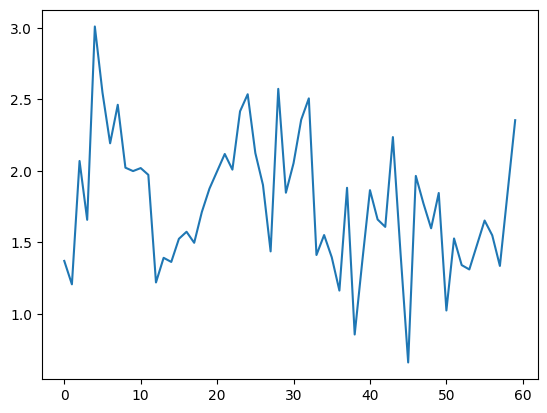

1.9734160831868721 3 23 1.8637118021015733


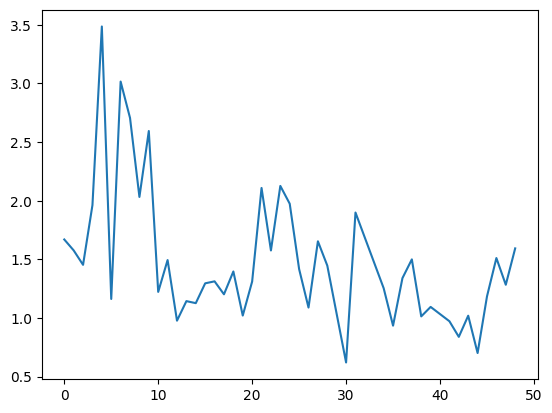

1.7276374440653375 3 23 1.707639683490034


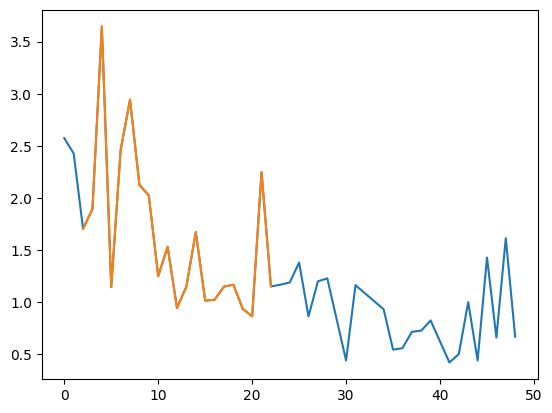

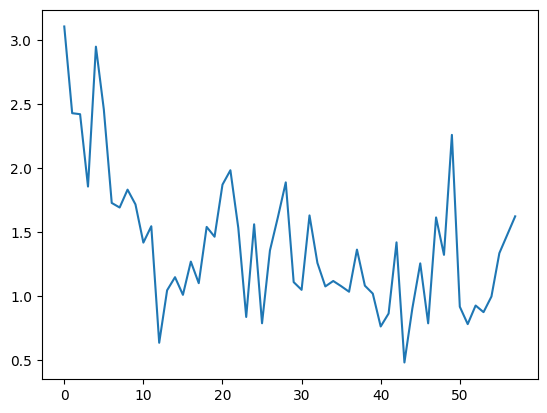

1.7235406200013765 -1 19 2.7658300682147523


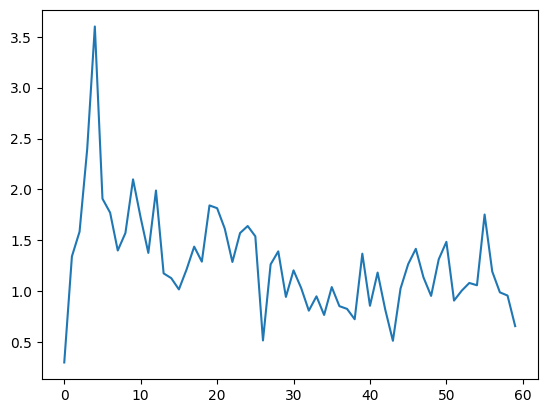

1.6812723679073887 0 20 0.8218168721974114


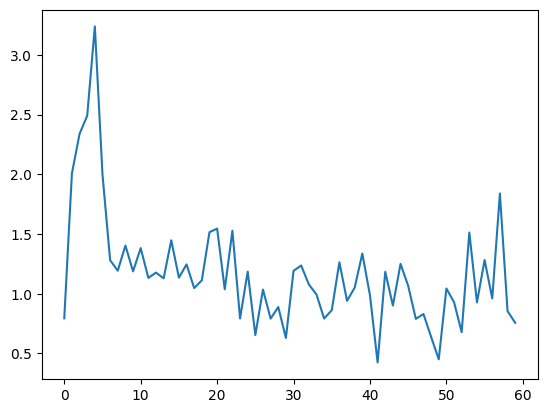

1.5258941628546454 0 20 1.4007468061189123


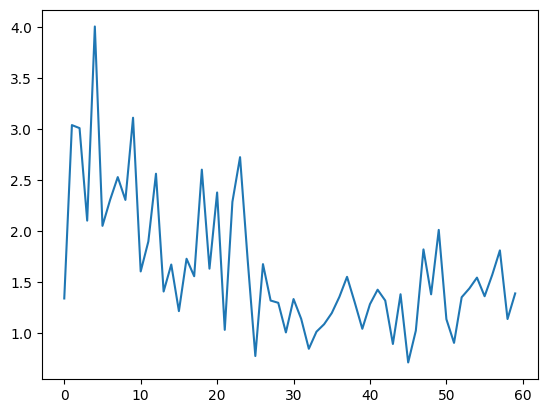

2.1923147013352624 -1 19 2.1882811950187455


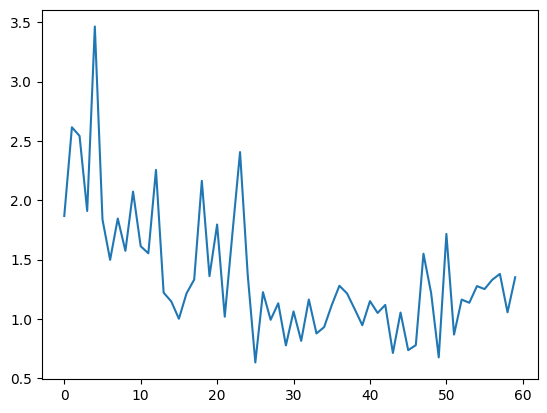

1.8036326258699324 -1 19 2.2410092453327537


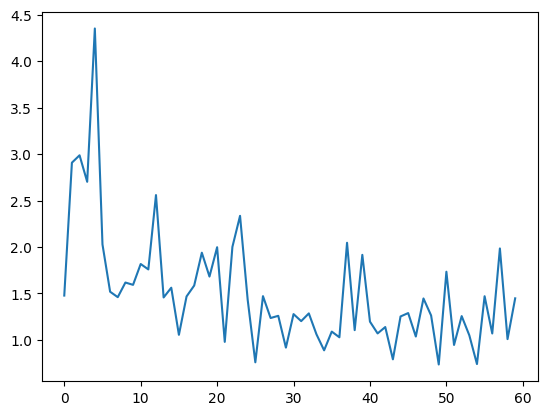

1.9770065547892184 -1 19 2.1923959217170546


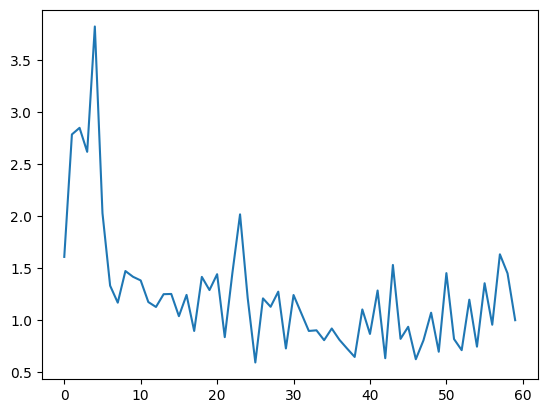

1.6498721704373953 -1 19 2.1986578630711624


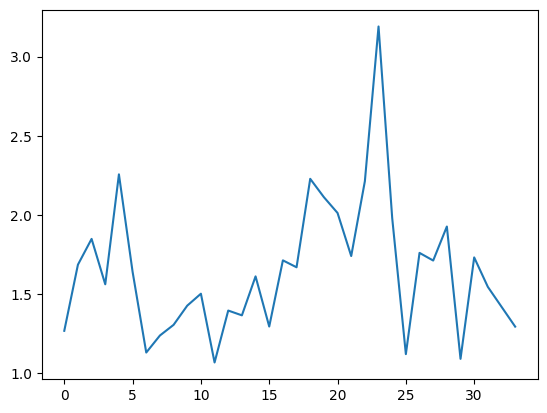

1.7701802048461932 11 30 1.2844437846856236


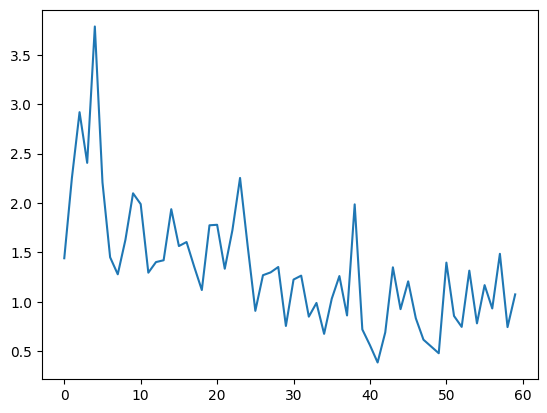

1.8437255368432544 -1 19 1.84791302455911


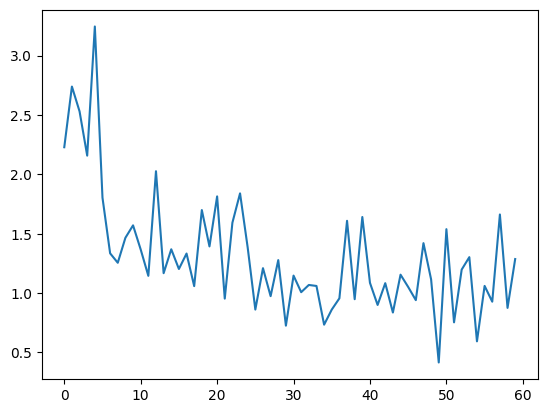

1.70965745942588 -1 19 2.483337212927821


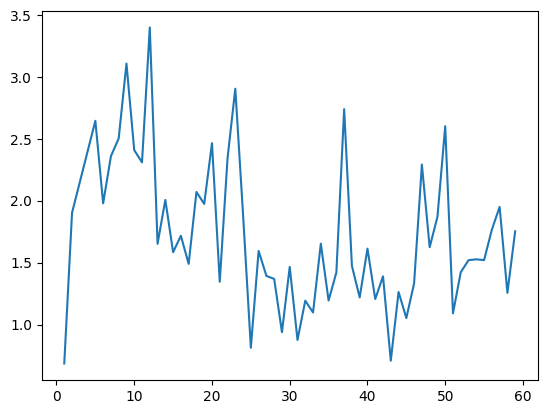

2.2268388806377692 4 22 2.3146590233352224


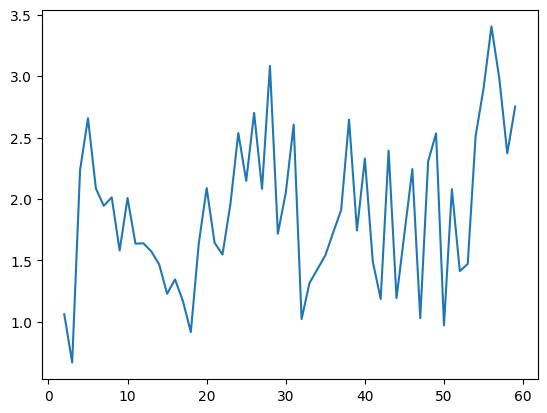

2.0595183719569845 37 57 1.8186983971746415


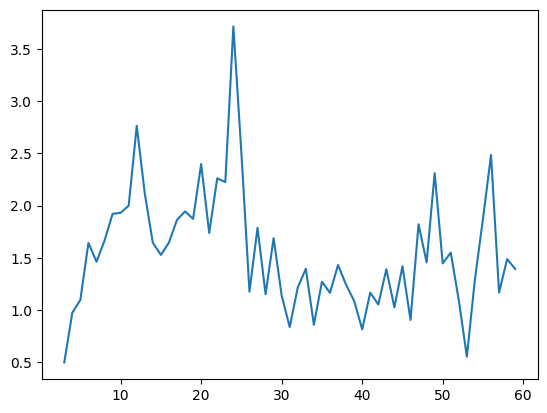

2.0069611902893416 6 26 1.3701875867724098


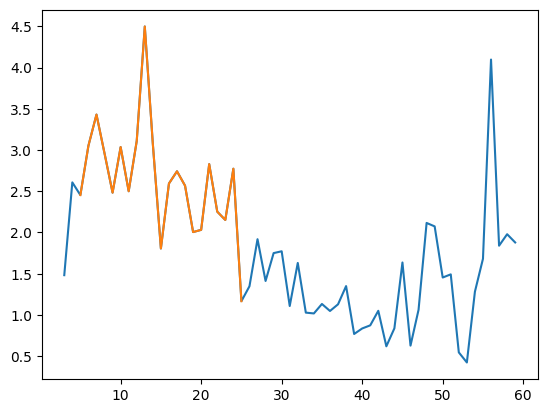

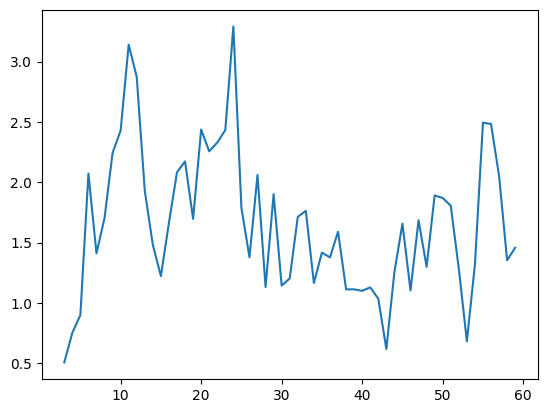

2.0961430928475737 5 25 0.8248140317800101


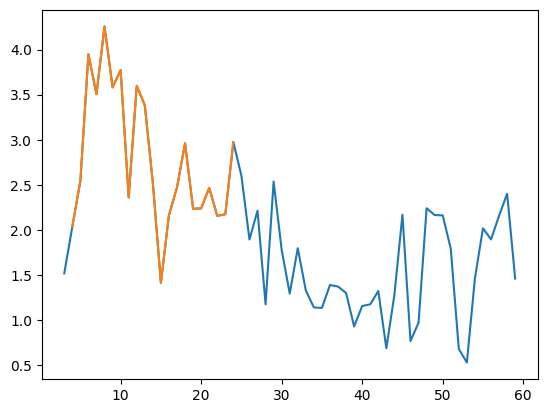

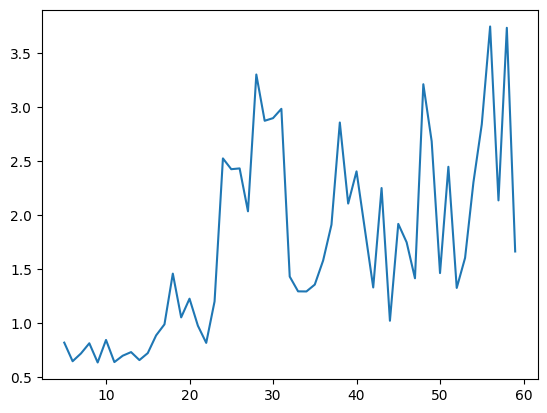

2.228906690228629 37 57 1.7464281665432664


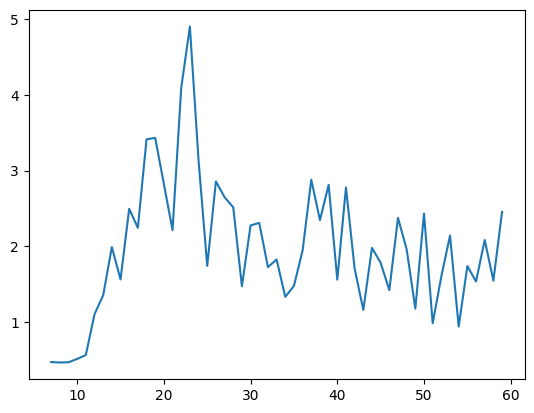

2.5275091948697335 17 37 2.370362144350919


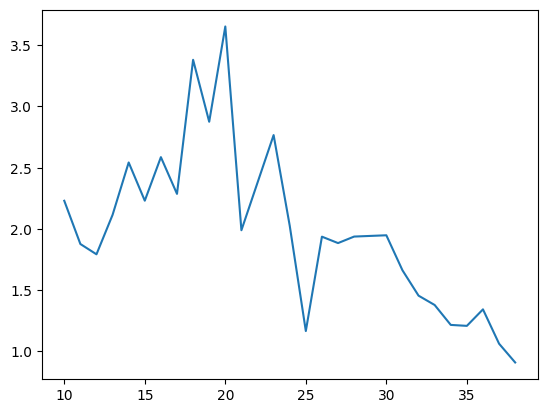

2.2746916230365635 9 29 2.0529254037321207


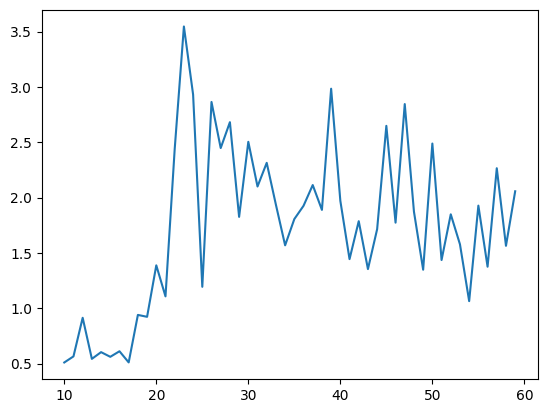

2.2039352255789177 21 41 1.2482672018326992


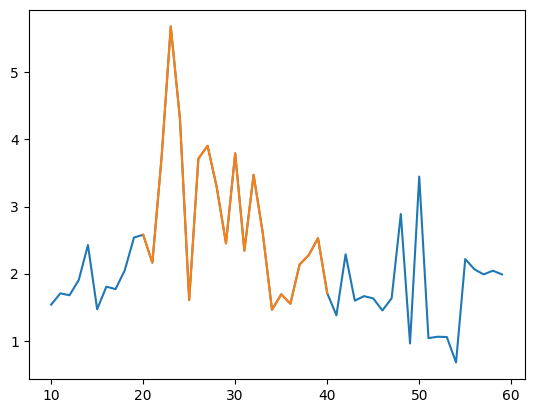

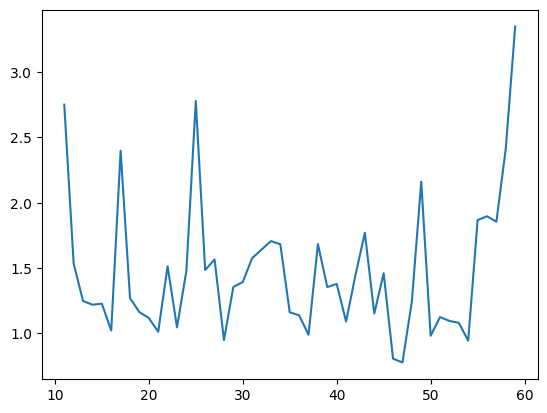

1.4810646565917496 10 30 2.1421265708613055


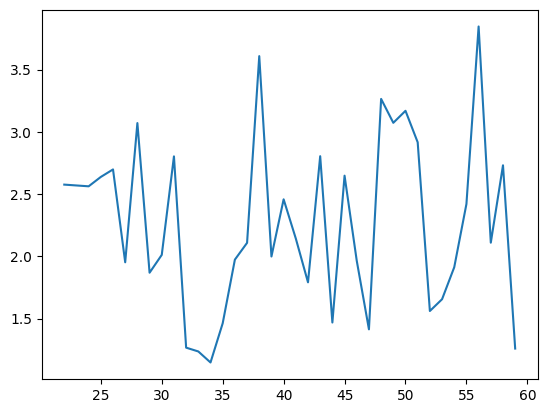

2.426517354728198 37 57 2.0406953339380687


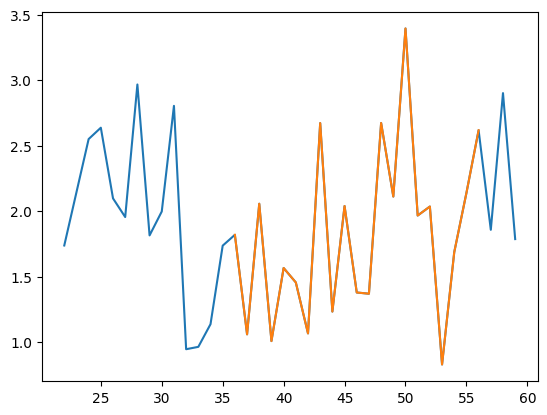

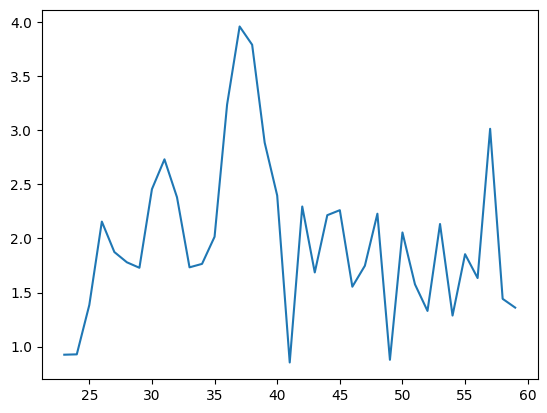

2.2739301866735726 25 45 1.1568803205785665


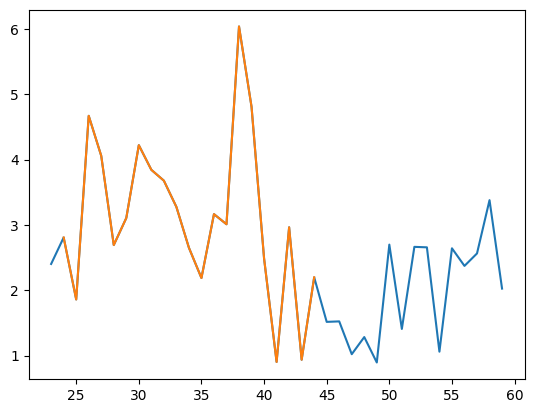

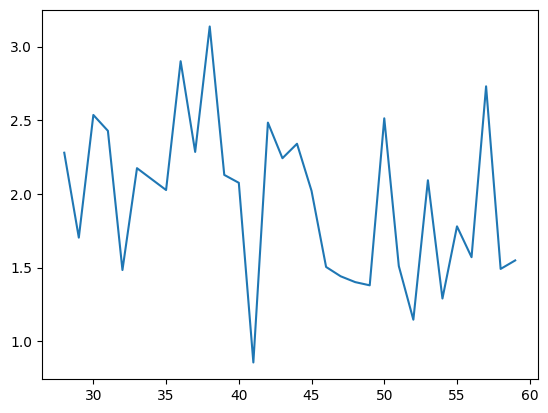

2.0729808403973933 27 47 1.9920323954759247


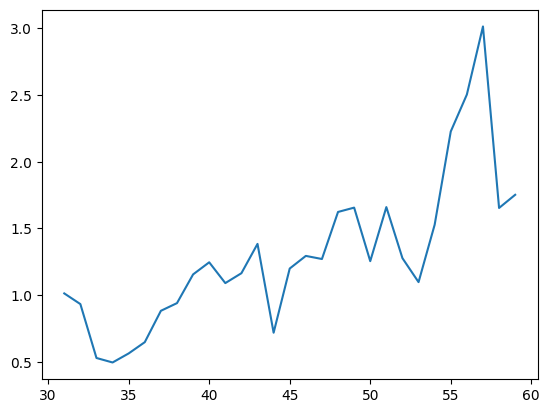

1.474630699526328 37 57 0.7658570125445833


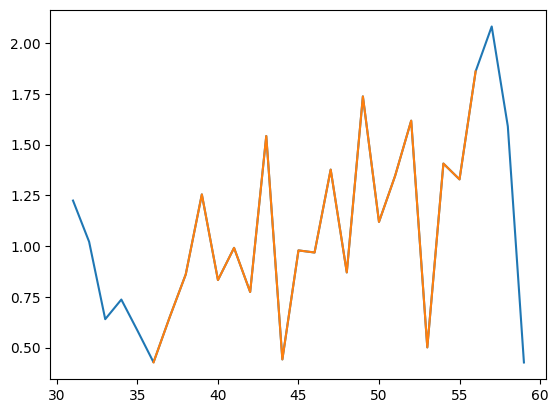

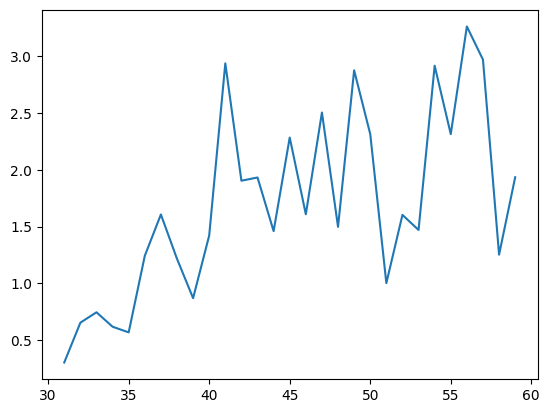

1.9976705406332869 36 56 0.9066677403285797


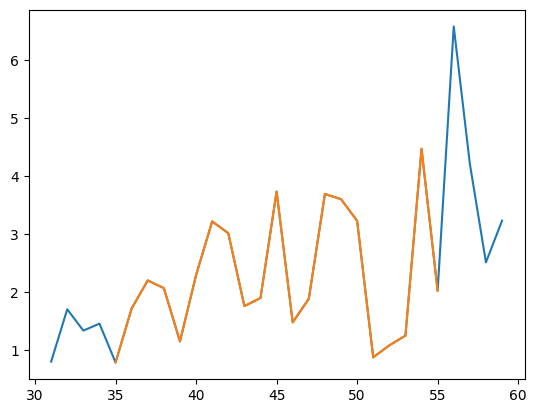

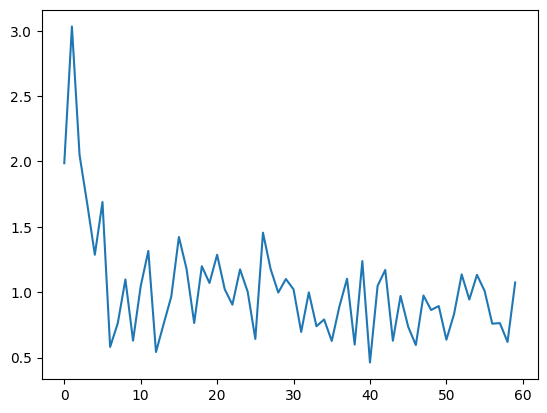

1.2538996481931821 -1 19 2.50925850403949


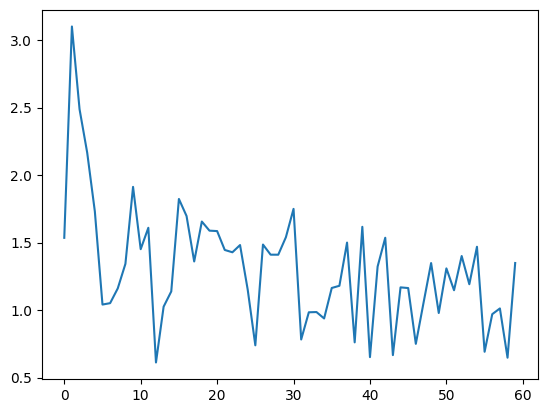

1.5752899574852 -1 19 2.3183525318751594


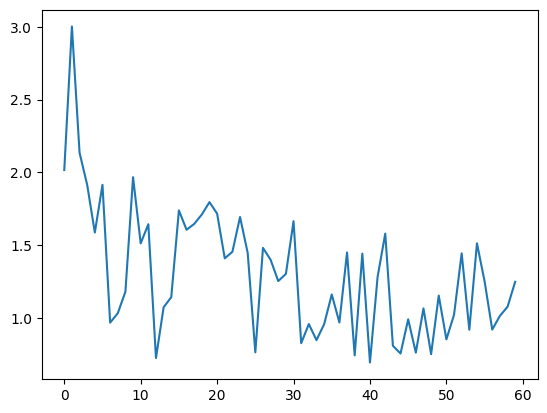

1.6189656391311429 -1 19 2.5085823659543225


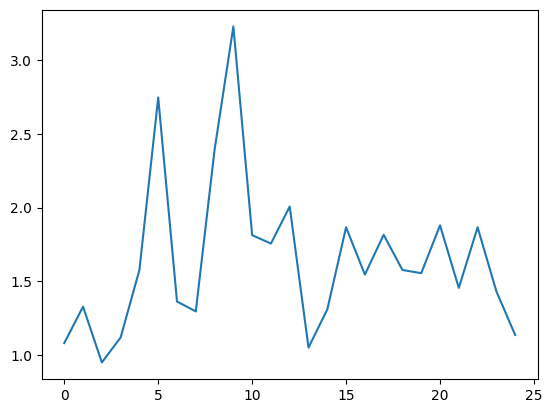

1.7459159441615744 2 22 1.1401835574709855


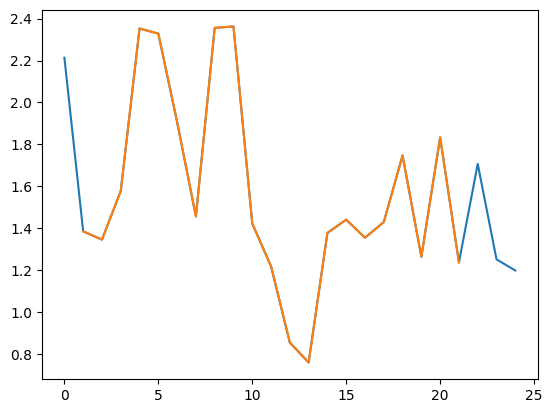

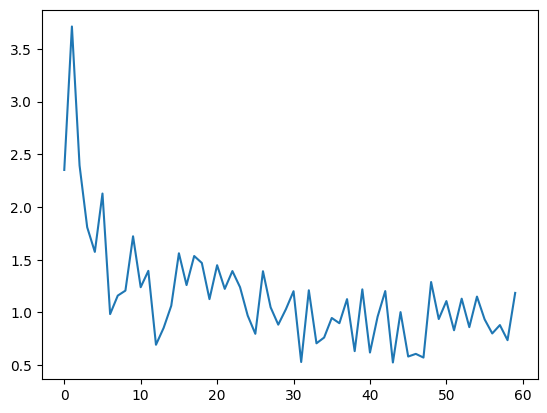

1.5569243245540256 -1 19 3.032804358685473


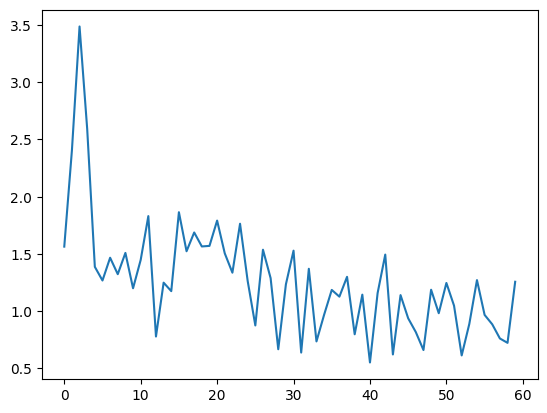

1.651349173487918 -1 19 1.983812807353031


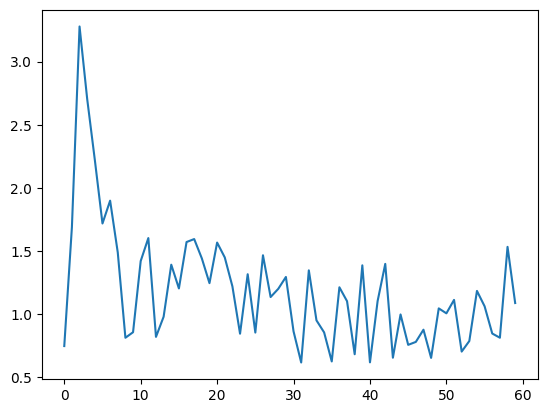

1.569590441217244 0 20 1.218644332177481


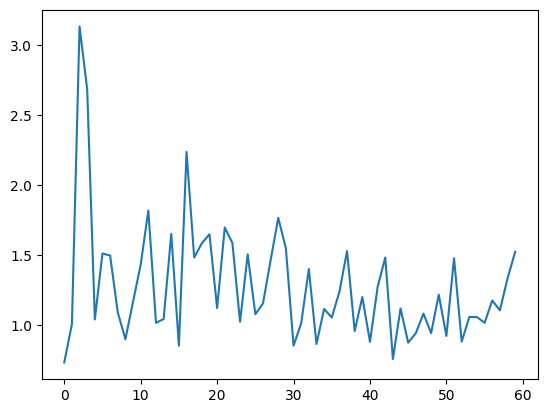

1.5311926866177037 1 21 0.8683009440056884


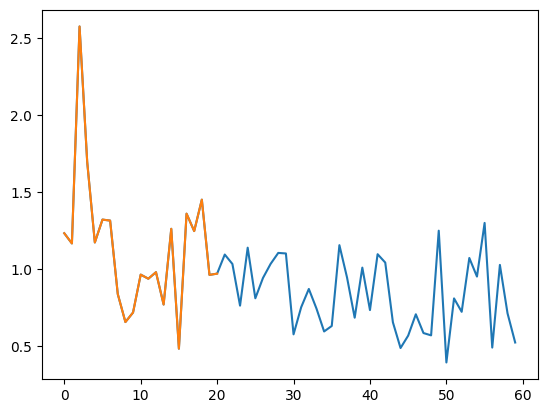

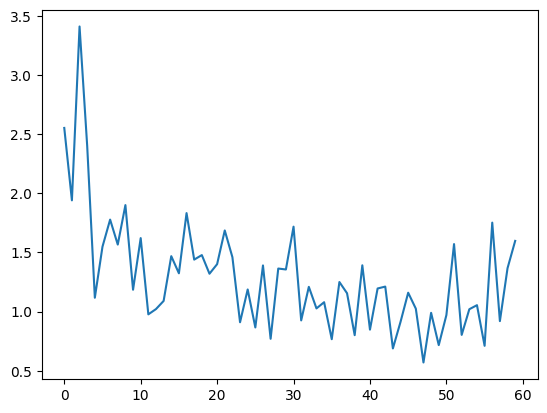

1.6358355986358615 -1 19 2.2455041398169864


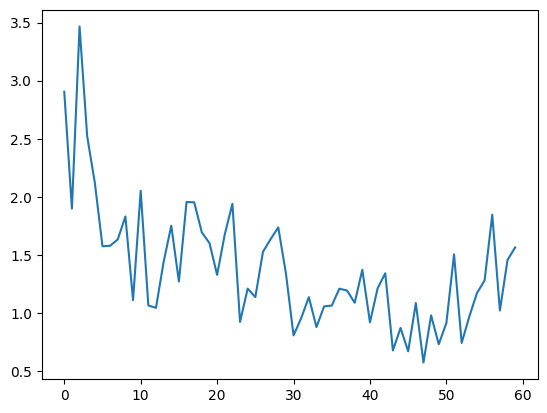

1.799157207911579 -1 19 2.4011470709727347


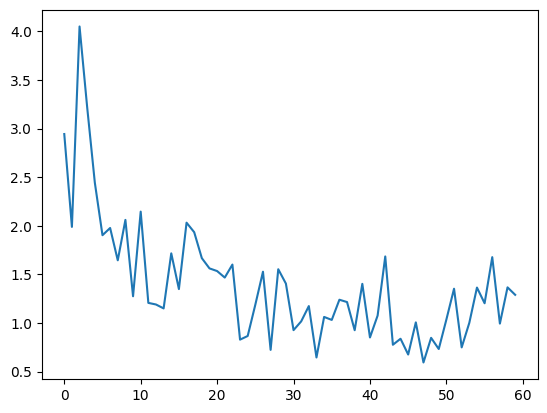

1.9520453936100255 -1 19 2.4661482725004182


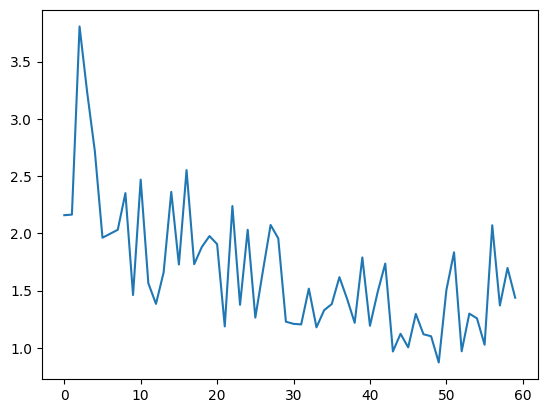

2.147036141955497 -1 19 2.1609297608728135


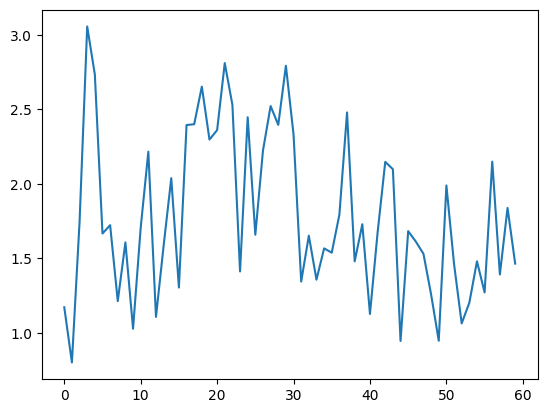

2.152234061932305 9 29 1.3174233713301067


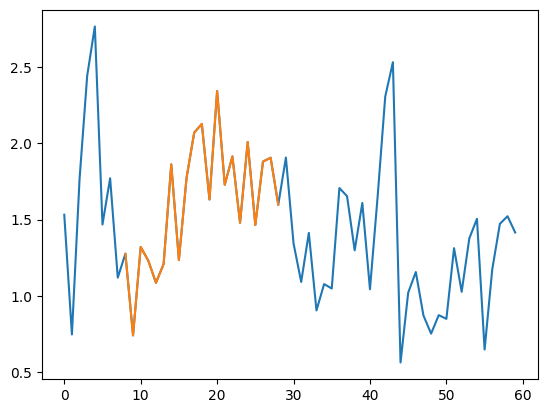

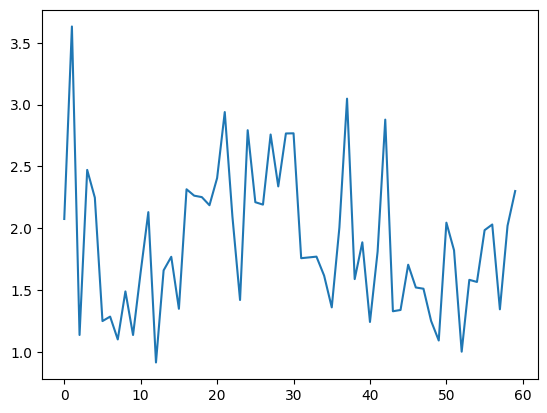

2.2236075534133772 16 36 1.8309276890244082


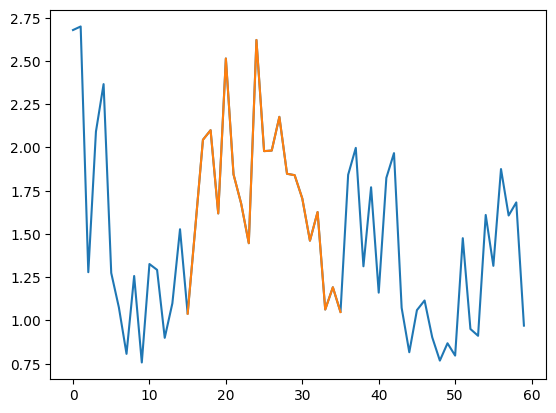

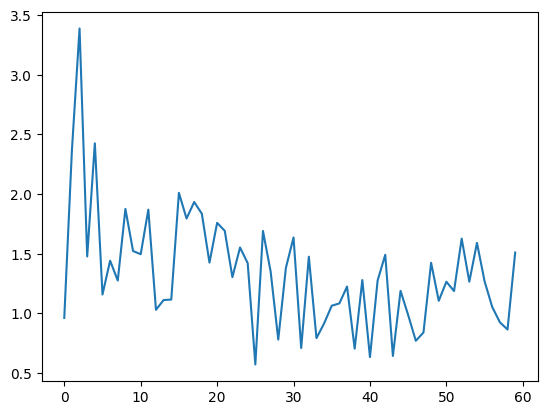

1.7151086859213411 0 20 1.6653673259126425


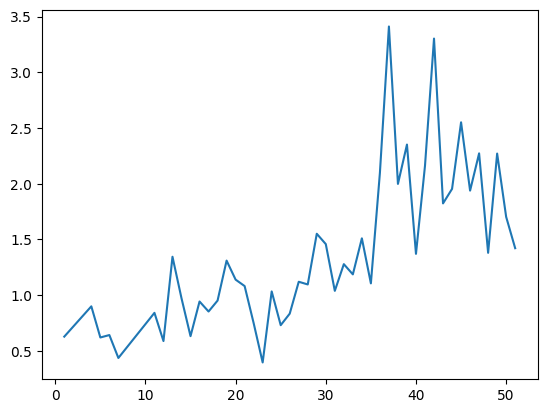

1.912578122772239 29 49 1.3235576127117896


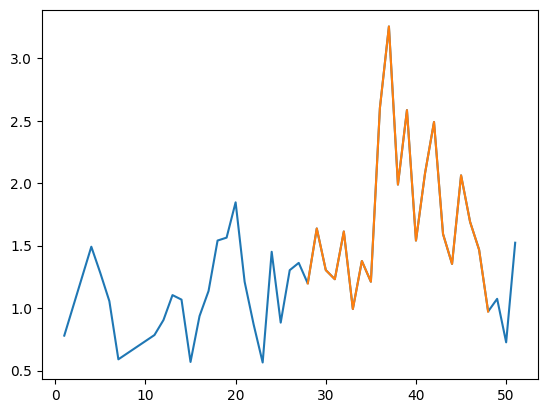

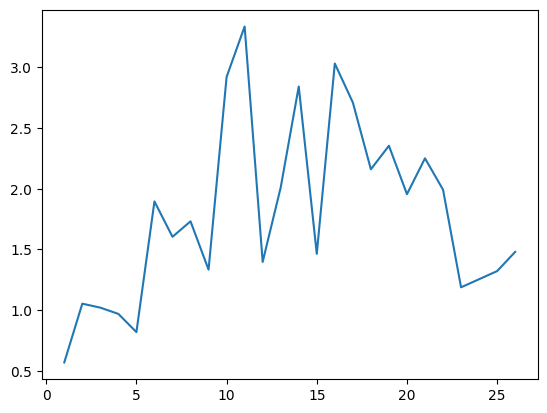

2.0160832387998417 4 24 0.9947171415093803


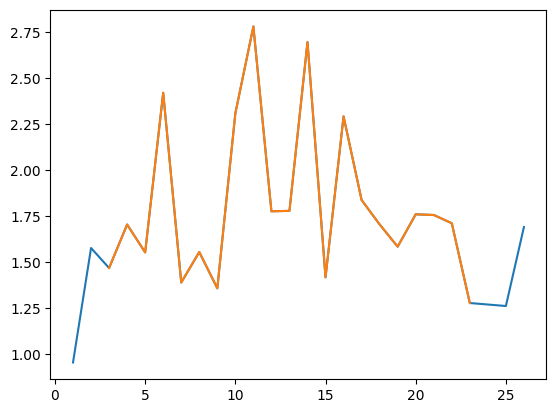

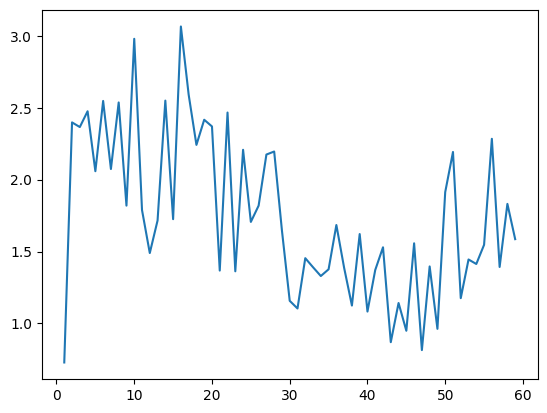

2.239779394864027 1 21 1.5633091673873731


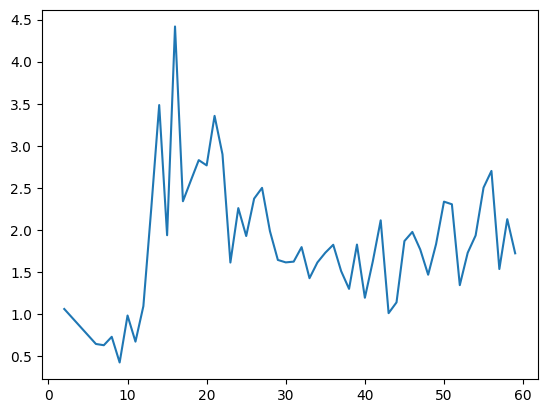

2.3637007208572913 12 32 0.8830346391858519


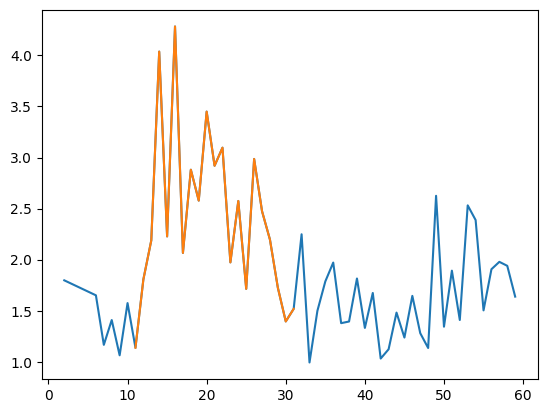

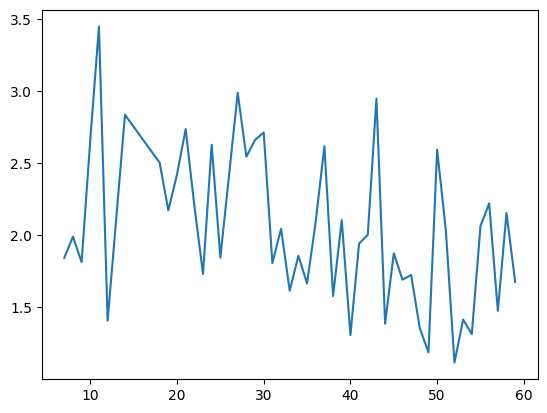

2.4668163333899296 9 29 1.9029348404190554


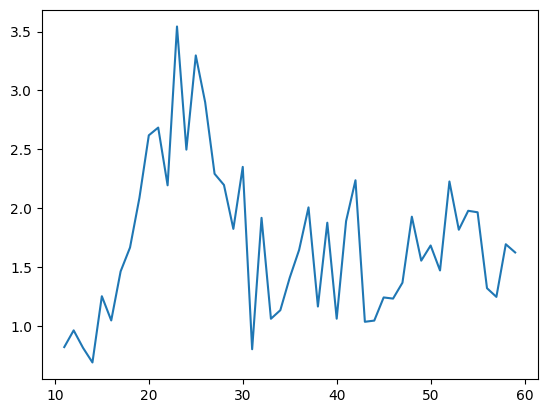

2.0767636600642354 16 36 1.1514322584887249


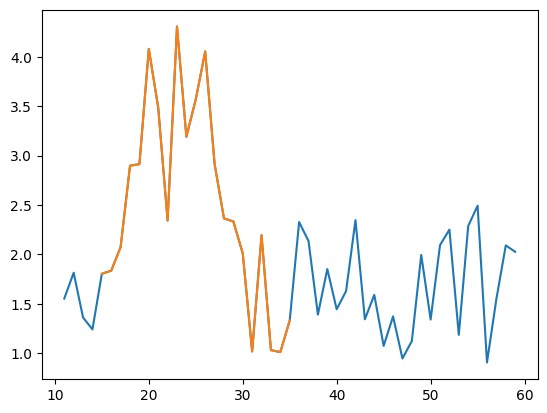

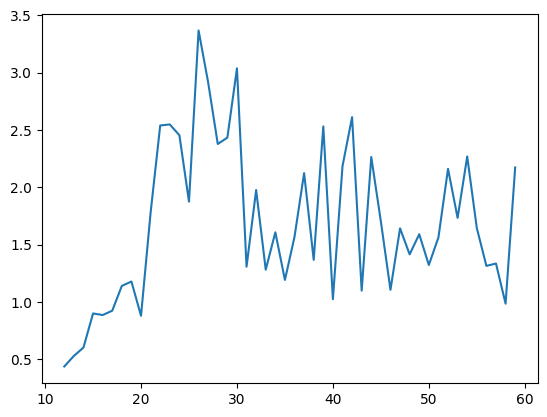

2.110372758180375 21 41 1.3296362556170254


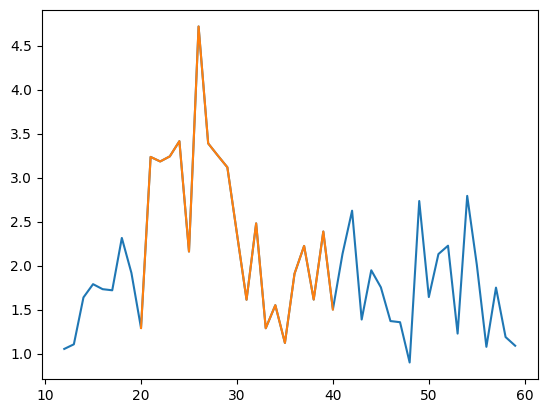

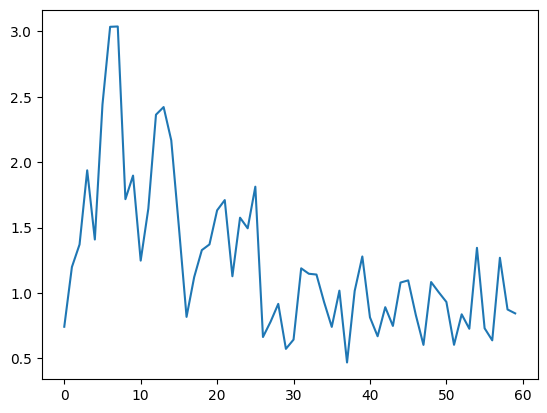

1.786119140187893 2 22 1.2845593138634


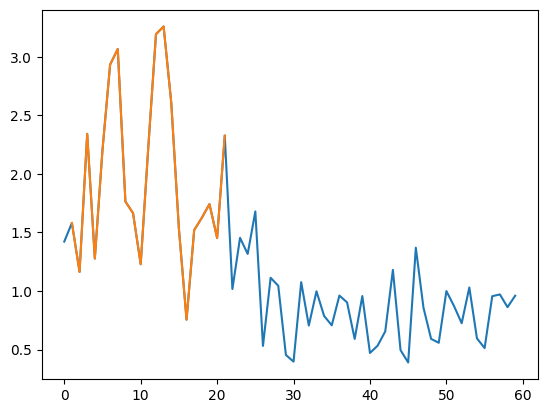

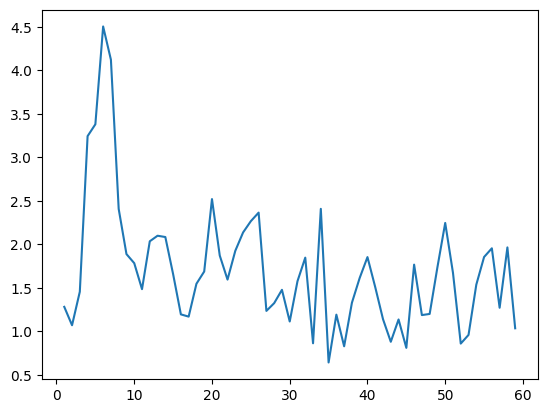

2.2054296761037686 3 23 1.2612905093586655


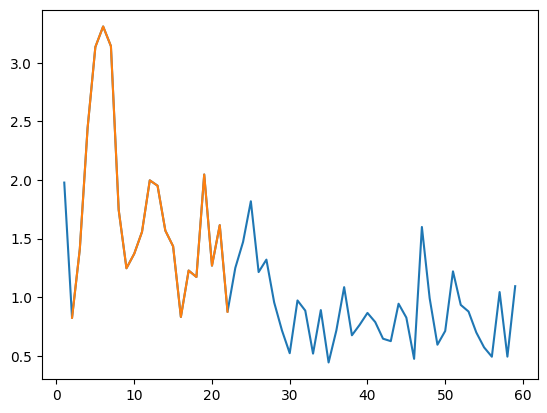

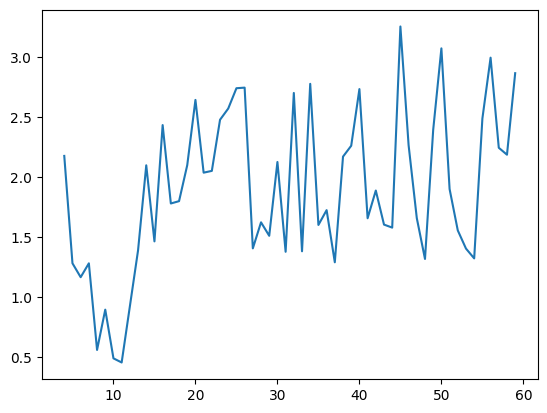

2.0923361997176873 37 57 1.5059598383253459


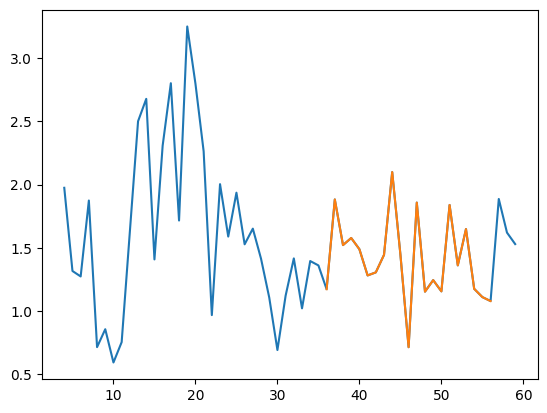

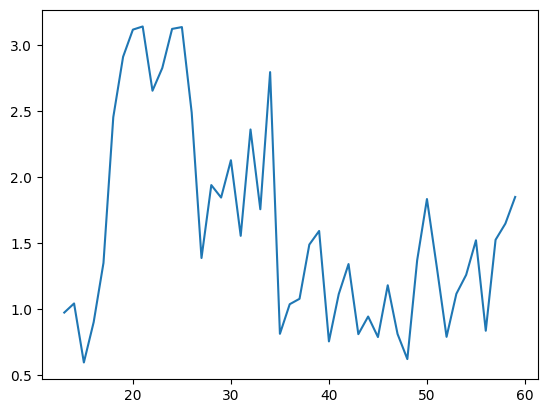

2.1905785424817137 17 37 1.1242928267523933


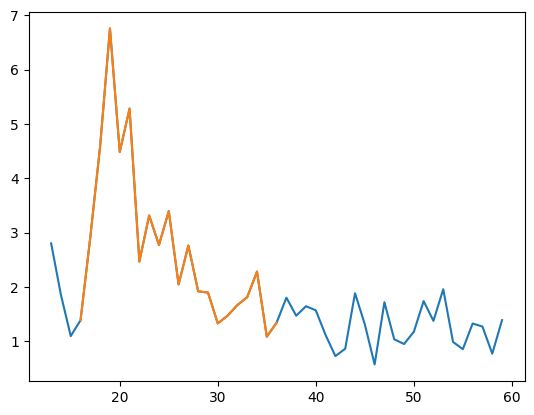

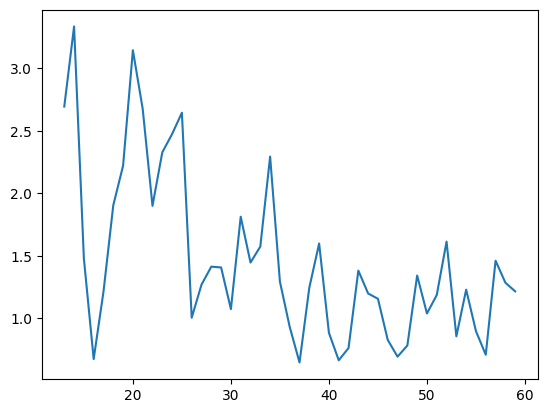

1.8896056602539548 12 32 3.01423622627083


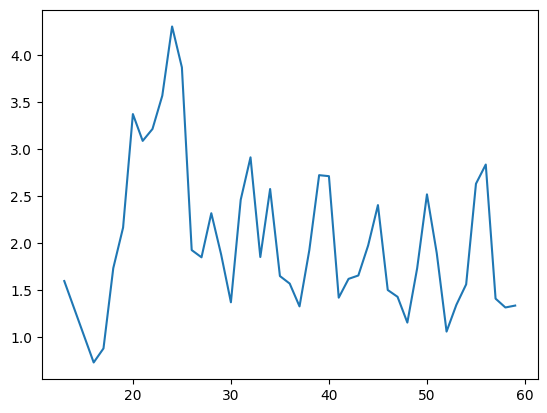

2.4992908665026805 19 39 1.9513903693274264


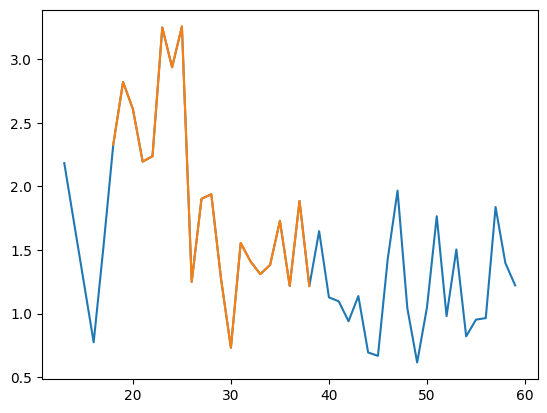

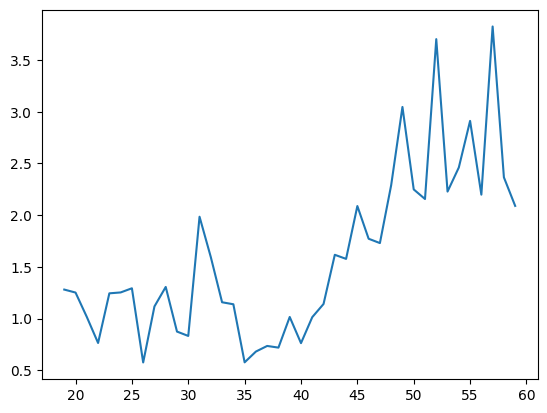

2.0413455590453626 37 57 0.7081691148835776


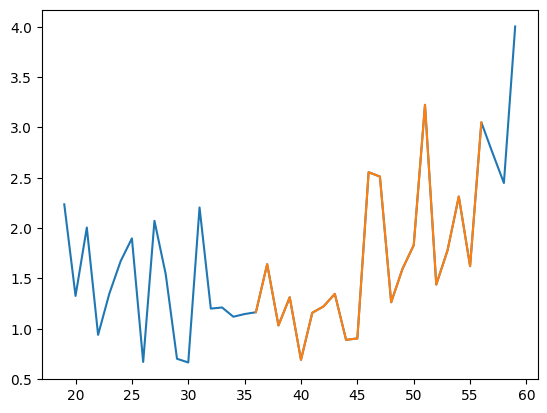

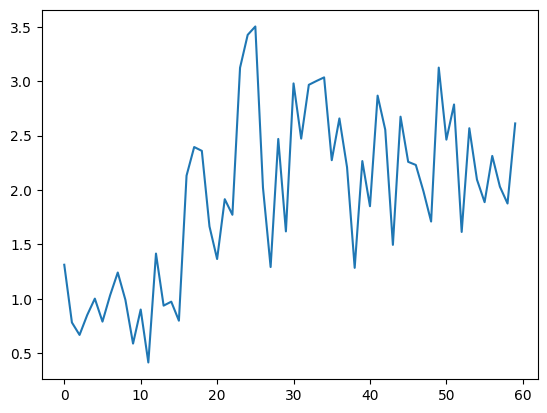

2.459830312420417 21 41 1.6407096987925303


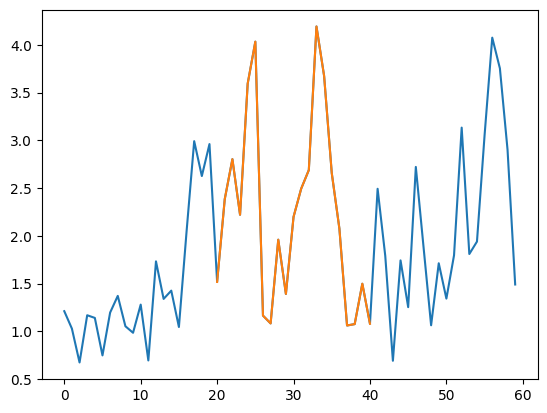

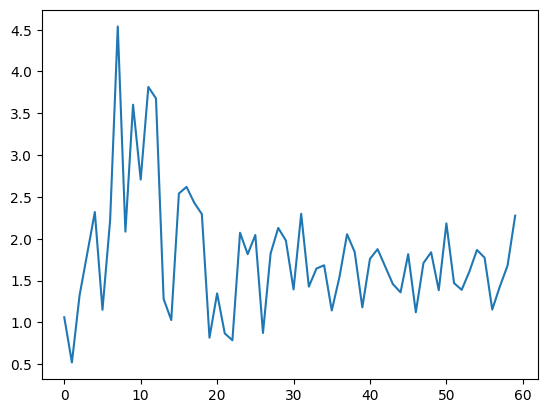

2.2098765727116536 3 22 1.8200079756524685


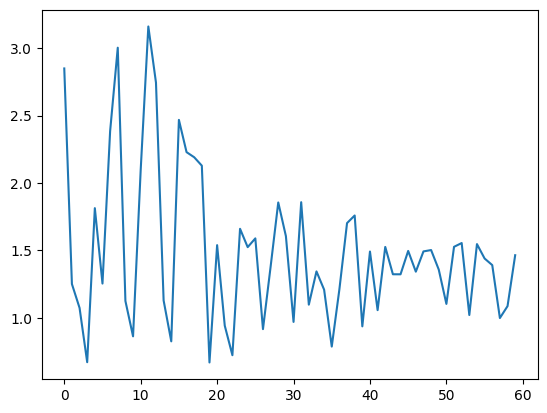

1.7841057131637104 -1 19 2.0501867645872953


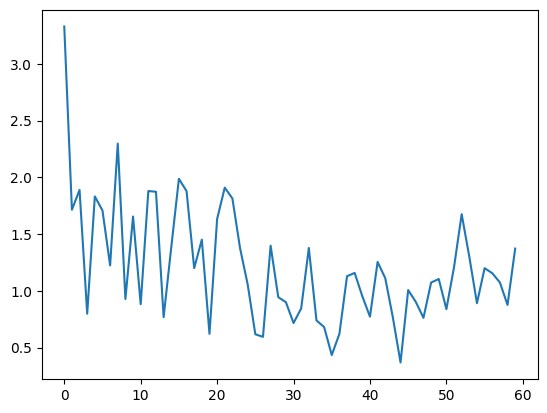

1.5678908261776339 -1 19 2.521214134917094


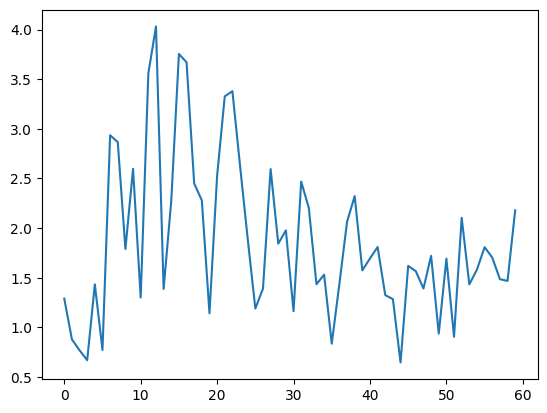

2.493540432716187 5 25 1.102791134383748


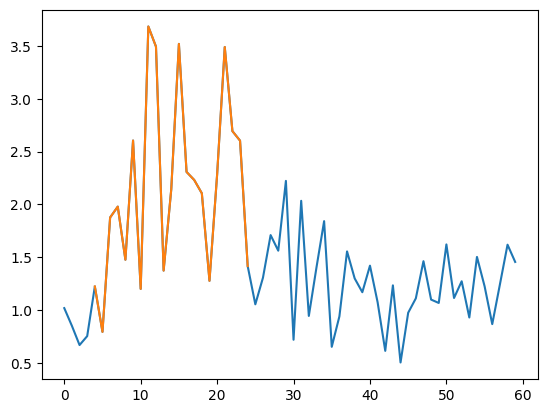

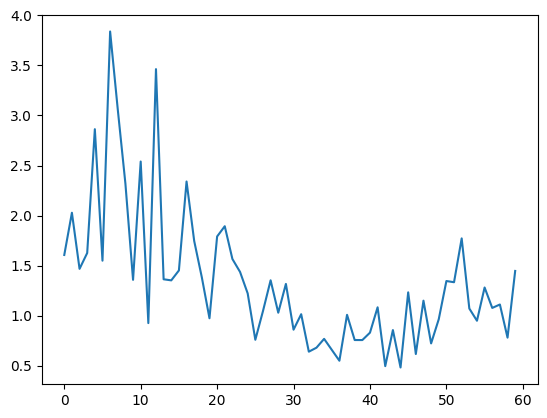

1.9682961542633002 0 20 1.8171796332728365


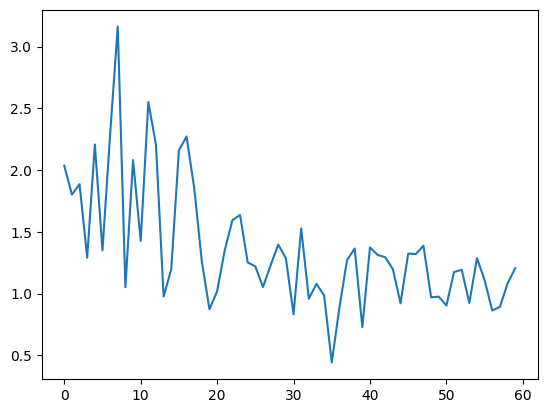

1.7597032863273836 -1 19 1.9185962760249113


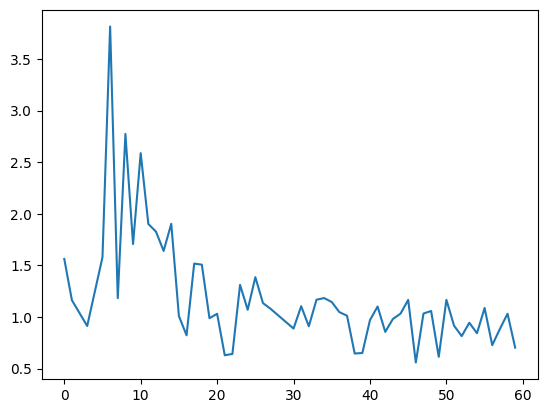

1.6540798042416724 -1 19 1.3625459039715935


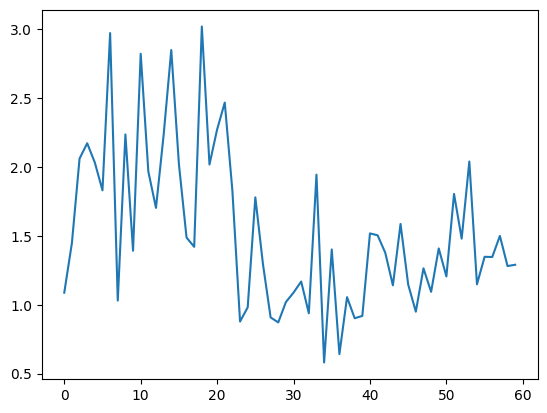

2.087228602434337 1 21 1.2677293106296545


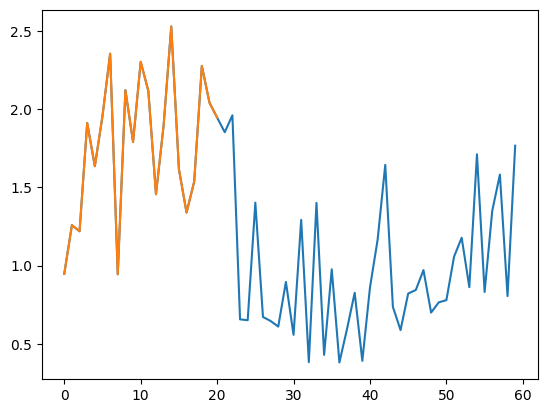

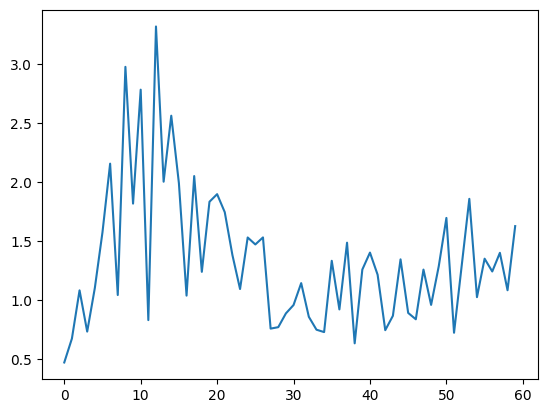

1.8252704102574657 4 24 0.9190904801446658


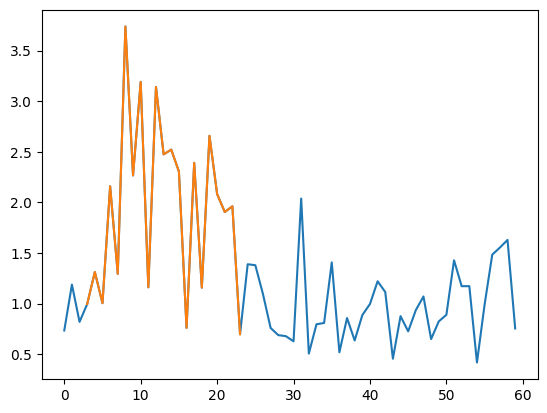

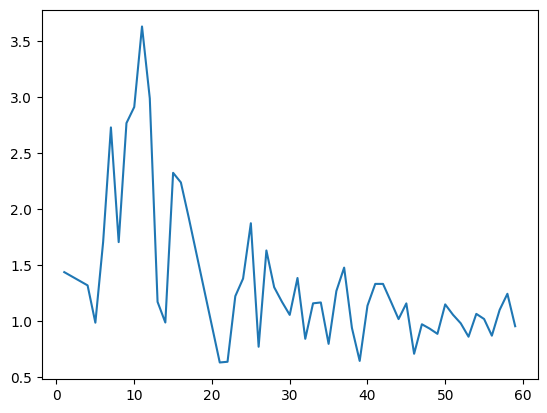

1.9658467280132754 0 20 1.3786565661797696


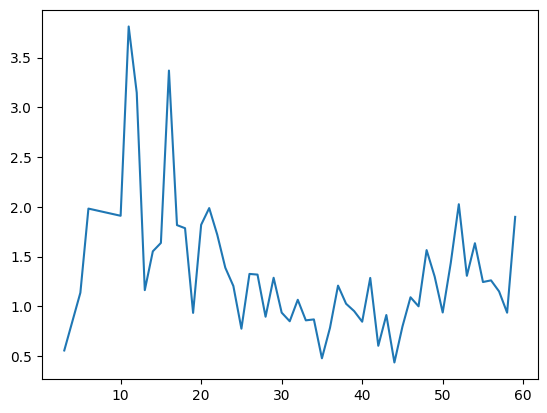

1.9036983985224702 4 23 0.8465118318288486


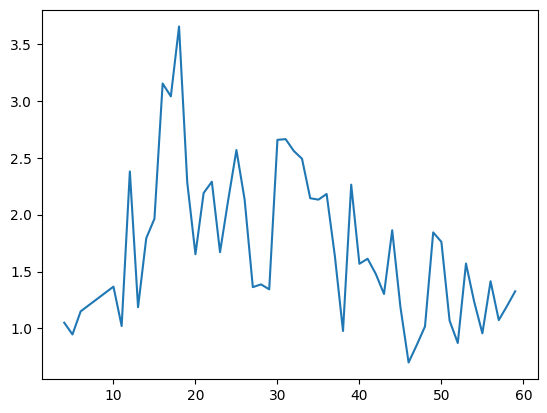

2.2704563129381166 15 35 1.878466812299961


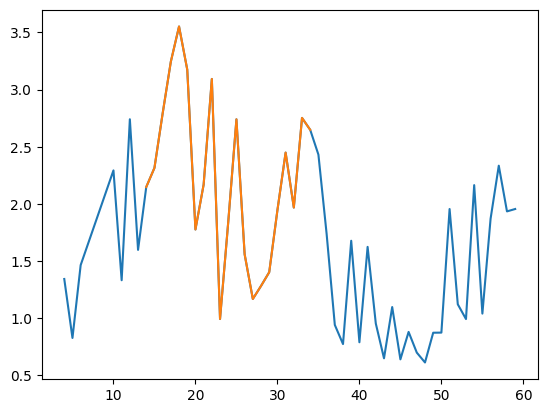

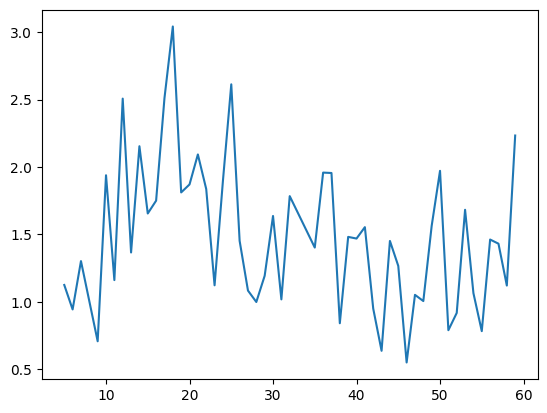

1.794666791333827 9 29 1.3224602822844287


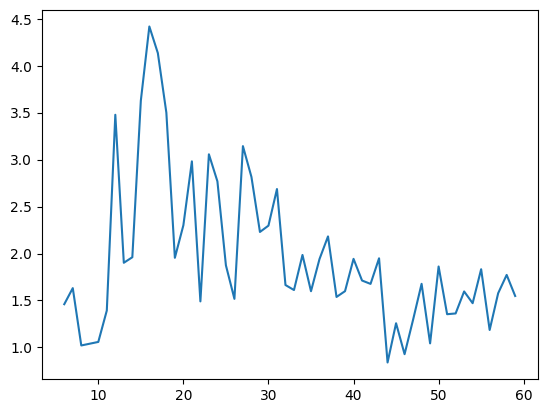

2.6570924046177735 11 31 1.225849893878295


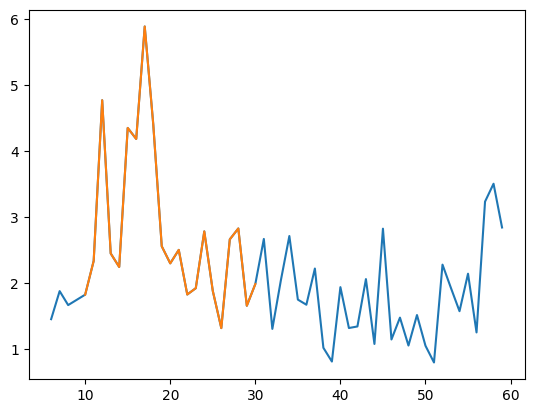

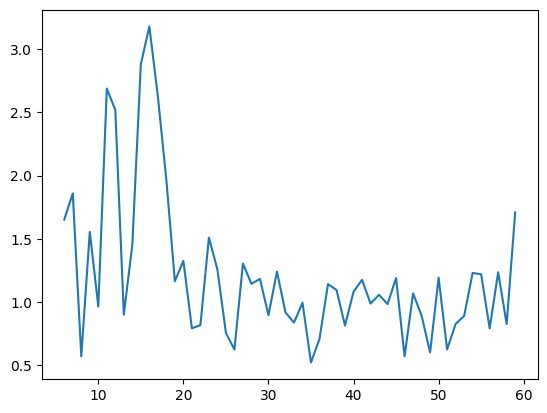

1.5735281039309523 5 25 1.7549465506896098


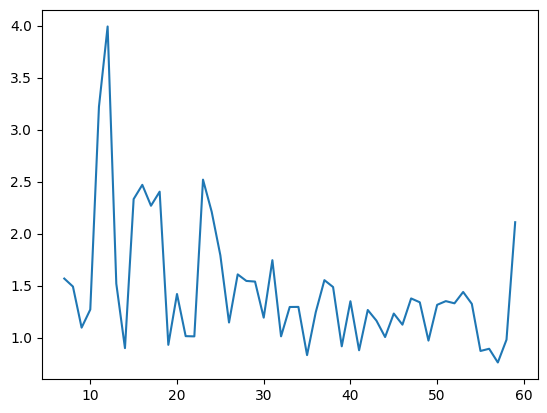

1.8459086918638992 10 30 1.1823476078104473


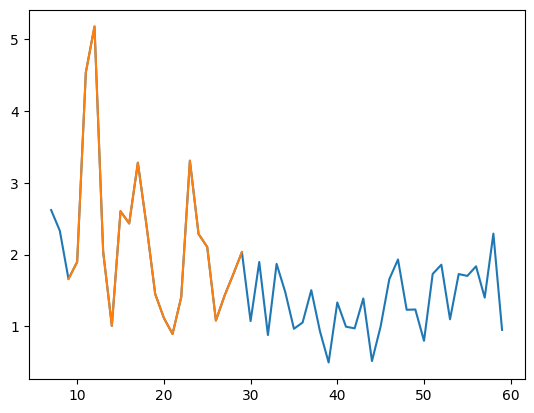

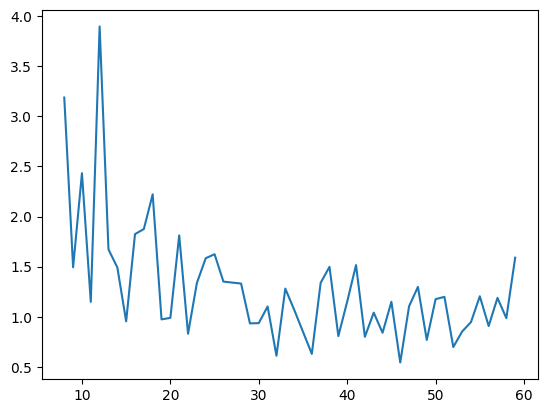

1.701720213575521 7 27 2.3409837744868565


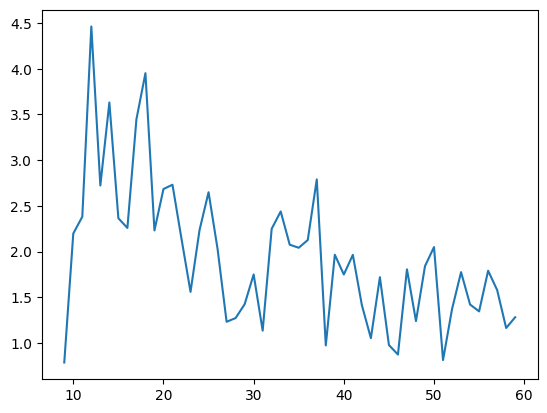

2.4451388458014685 9 29 1.491373899185621


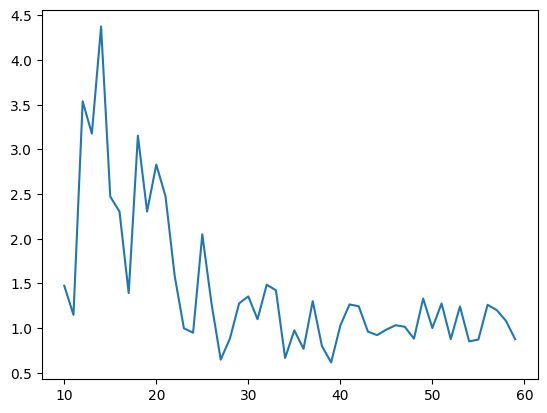

1.983322254684742 9 29 1.3108166776981176


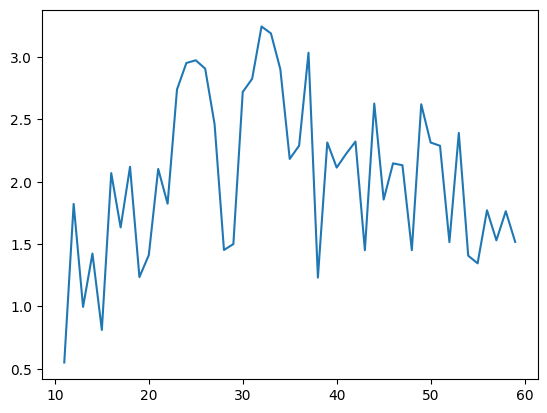

2.447263403433698 21 41 1.7570879058236835


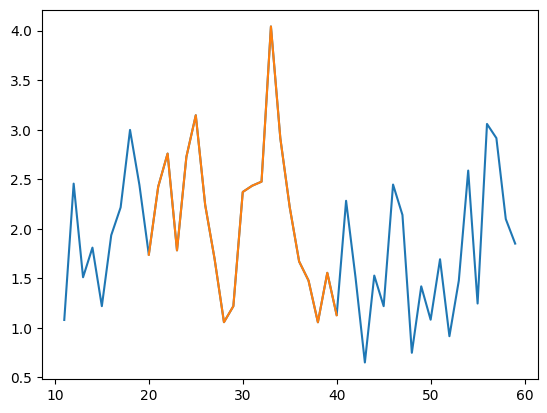

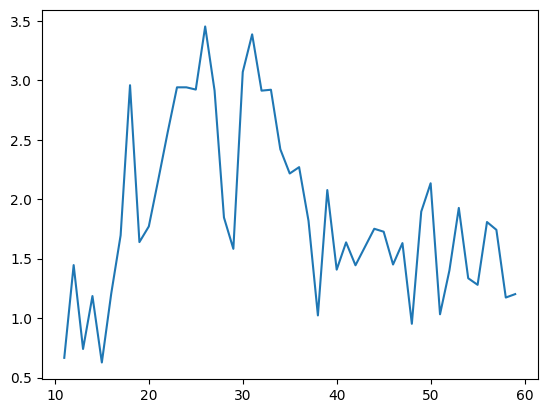

2.4949855483463548 16 36 0.916787001384038


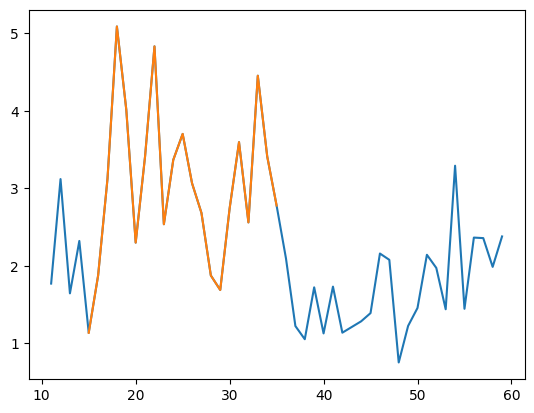

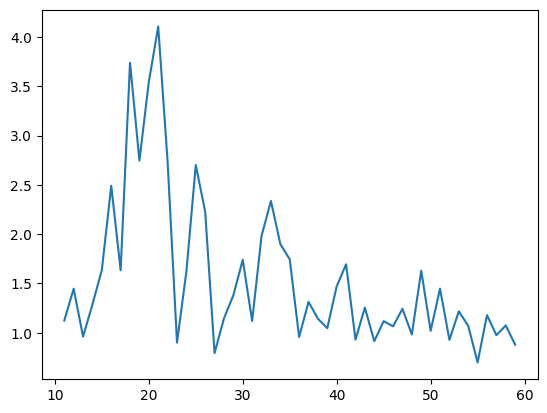

2.106200080350766 14 34 1.1239075434044958


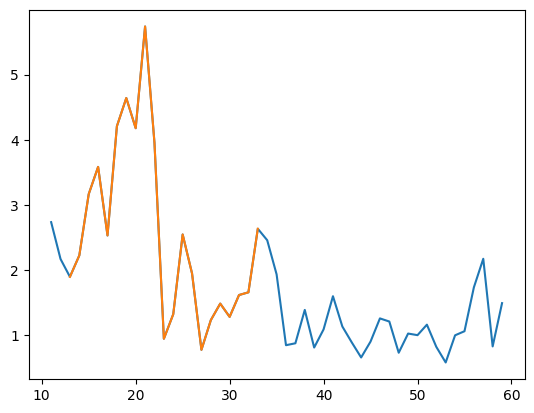

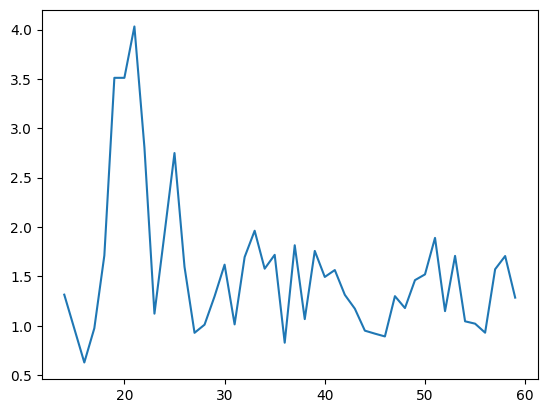

1.882988770910043 18 38 1.342996953444343


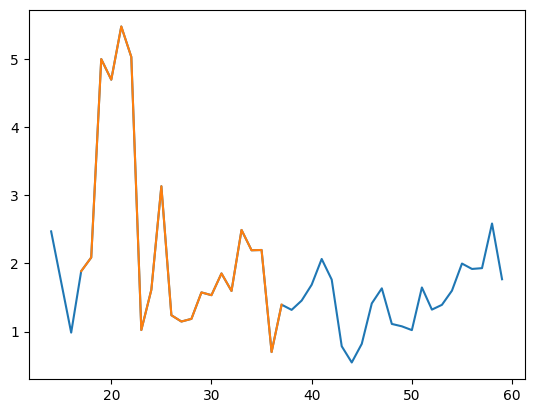

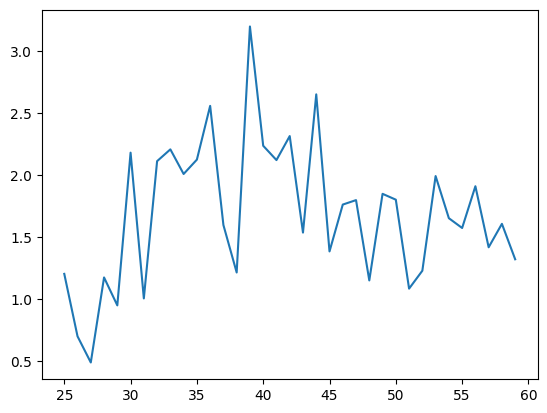

1.944608120077545 29 49 1.0633708842676723


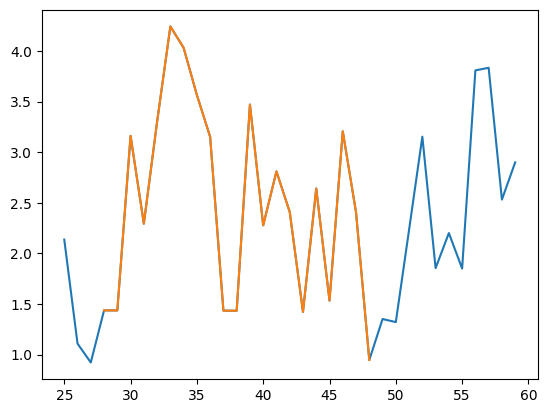

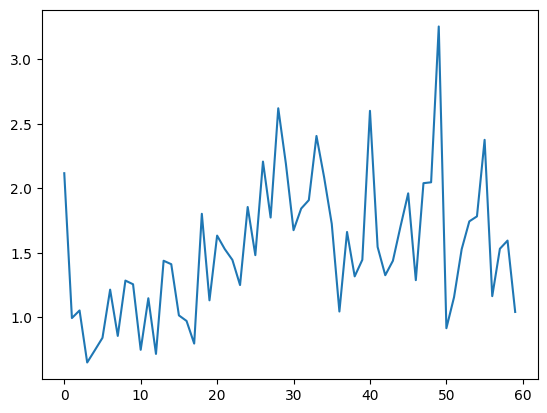

1.834227638683342 28 48 2.1975110666008266


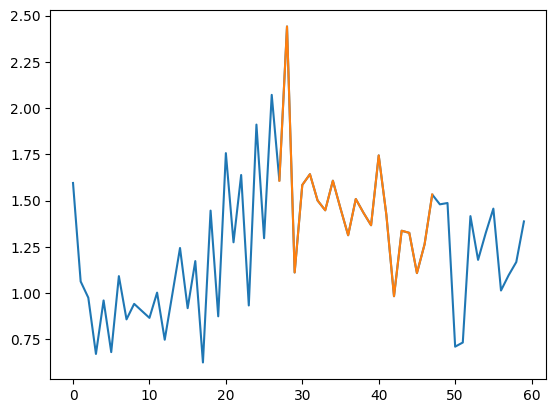

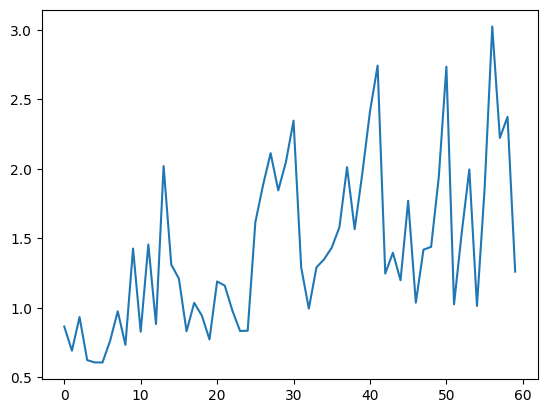

1.8051791420821788 37 57 1.7955634773254698


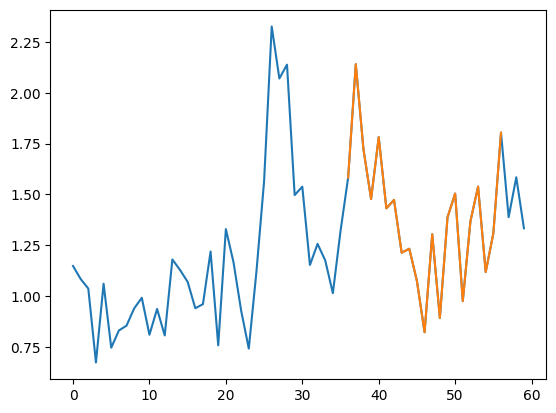

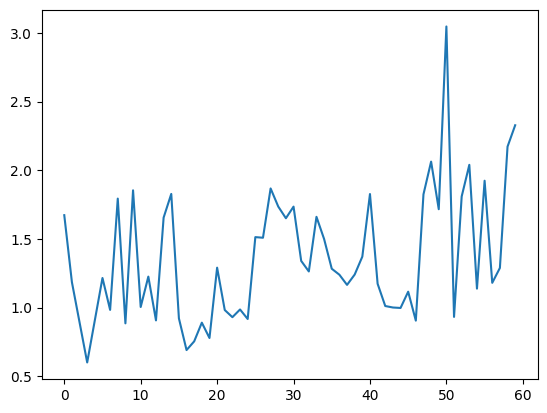

1.5131182407632413 37 57 1.2023885437906716


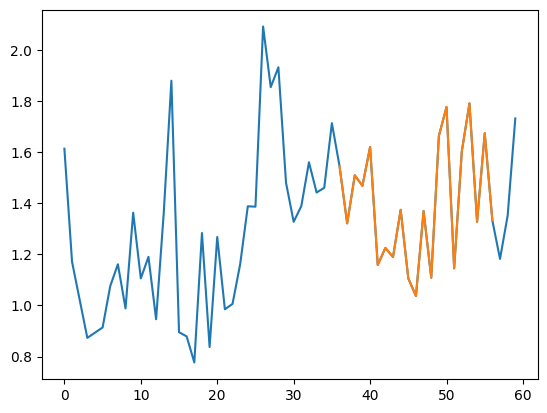

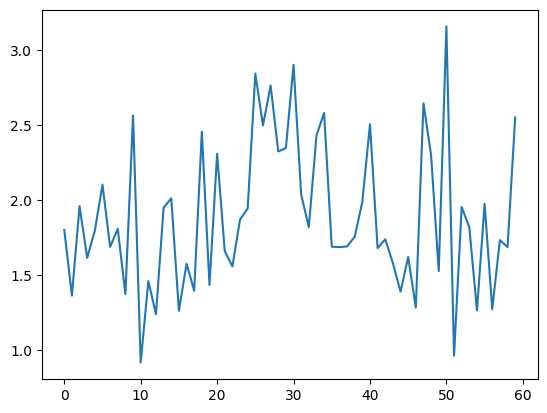

2.153310253672745 19 39 1.9452011383957029


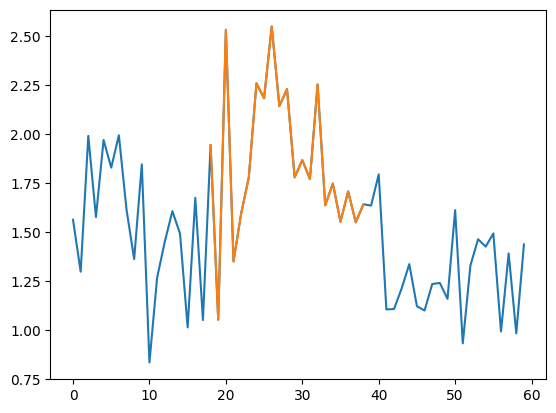

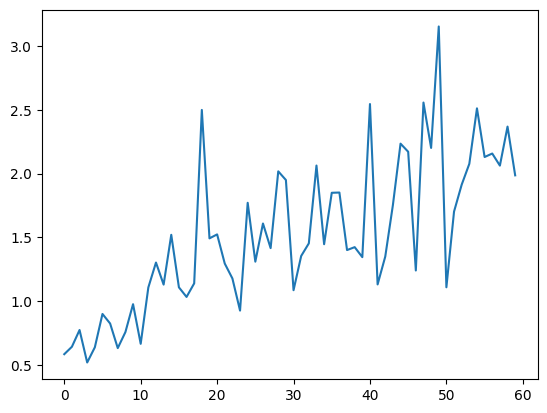

1.9587183471941183 37 57 1.6259709404160168


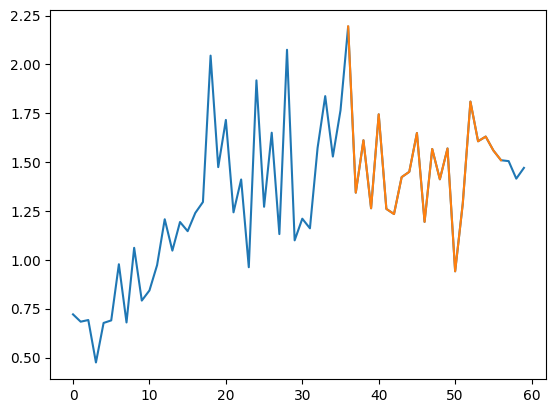

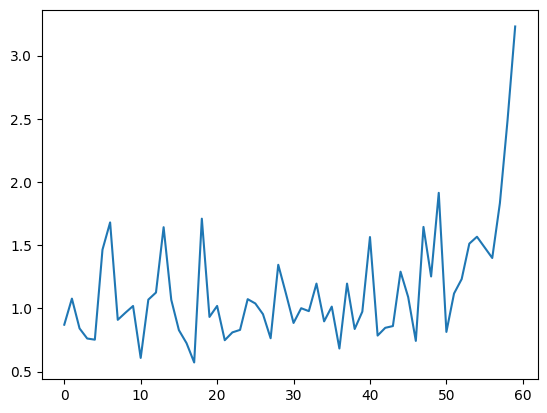

1.2882931791975007 37 57 0.9394315208487775


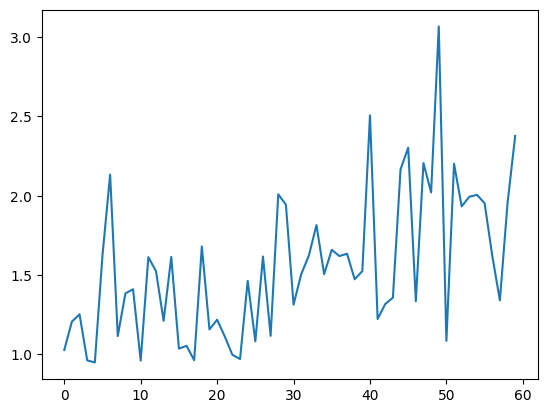

1.8377521147508793 37 57 1.6272166415258136


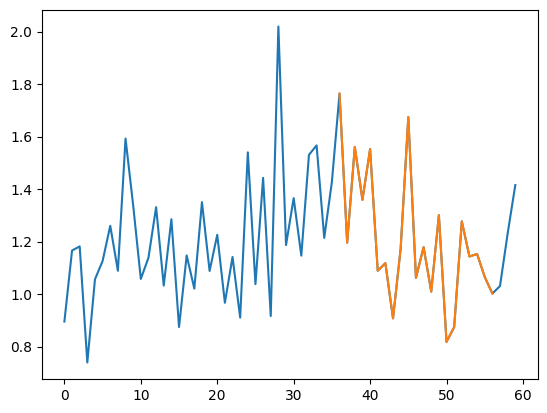

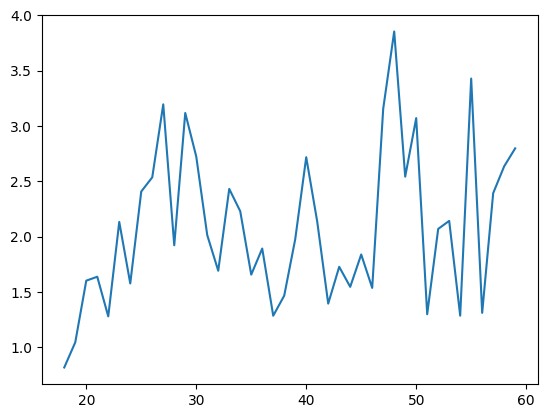

2.1684845712476872 37 57 1.589521919590655


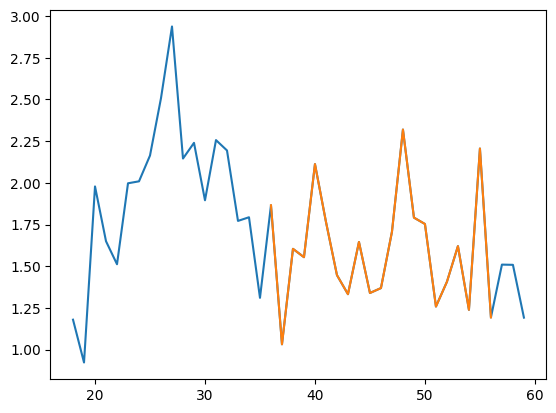

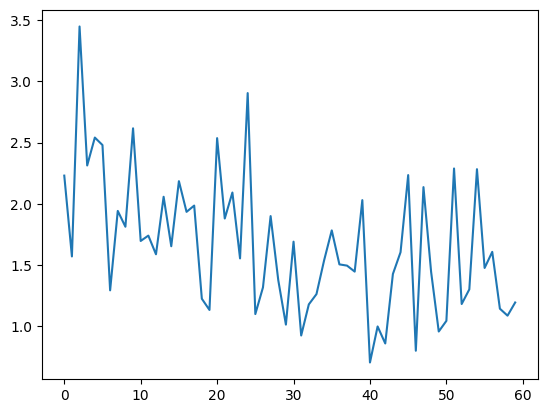

2.0064361517417937 1 21 1.8991267293689762


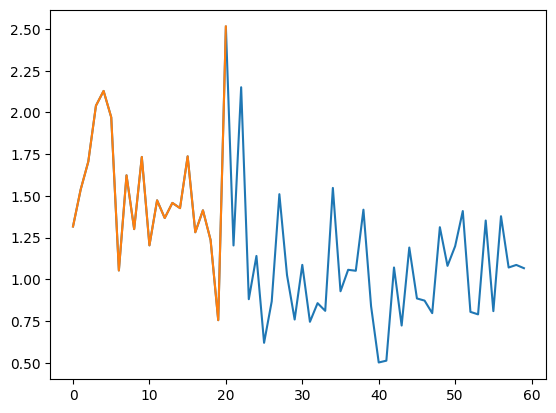

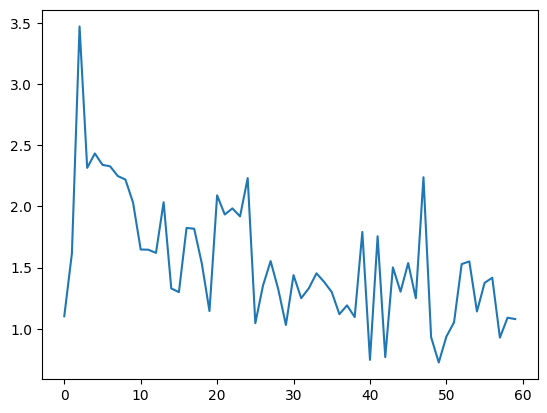

1.96668424701765 1 21 1.359145248297272


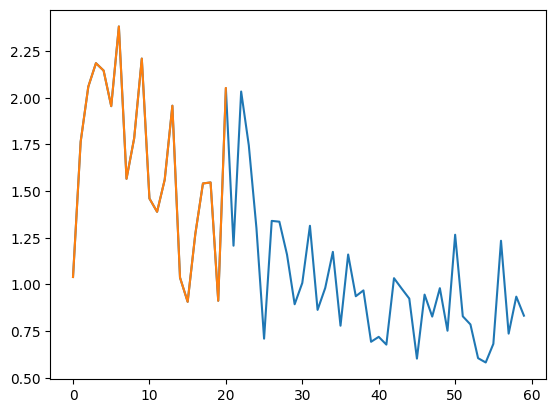

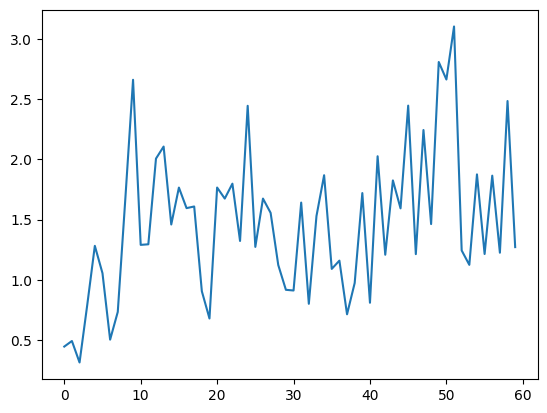

1.76835596228718 37 57 0.9366242400070101


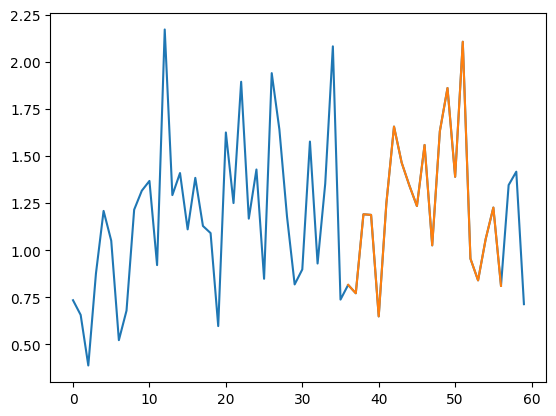

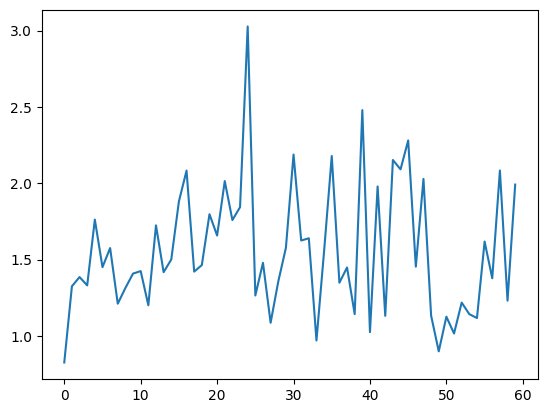

1.7079754239002047 14 34 1.458827265582677


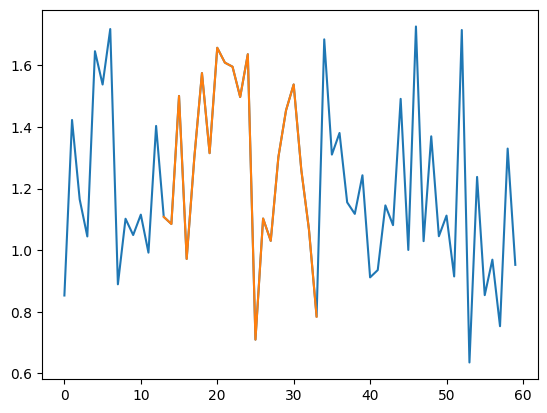

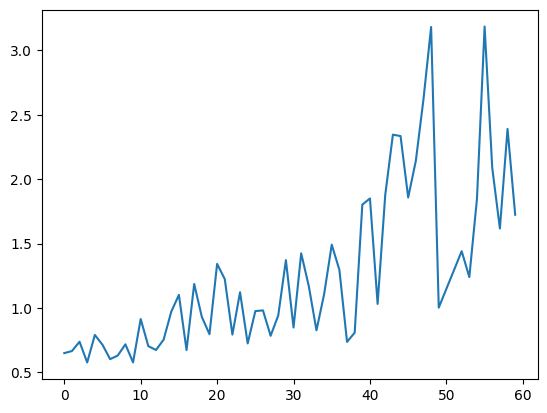

1.9295846887959158 37 57 1.0160586101031954


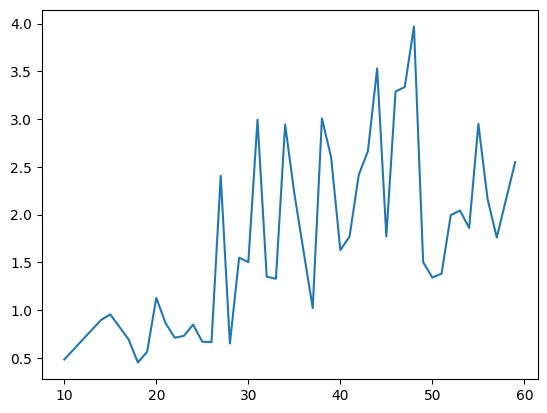

2.339428612168717 37 57 1.31943438122067


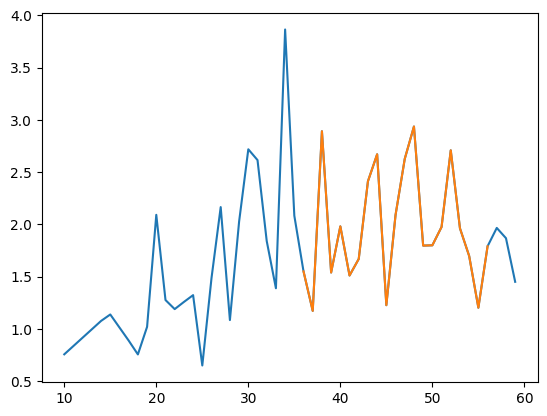

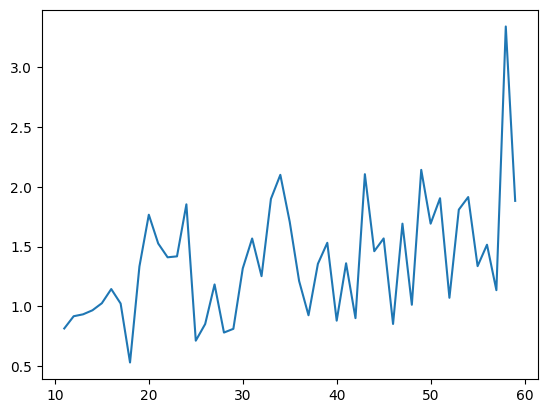

1.5519702726151992 37 57 1.0694618661682216


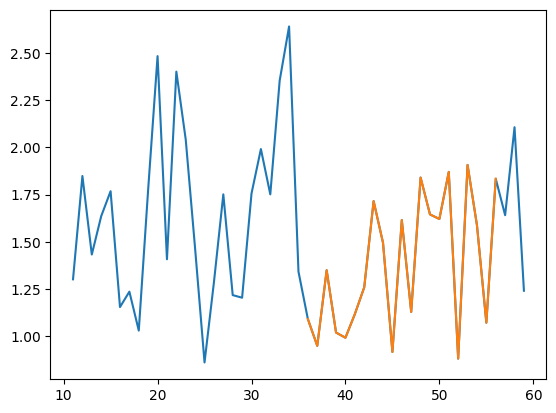

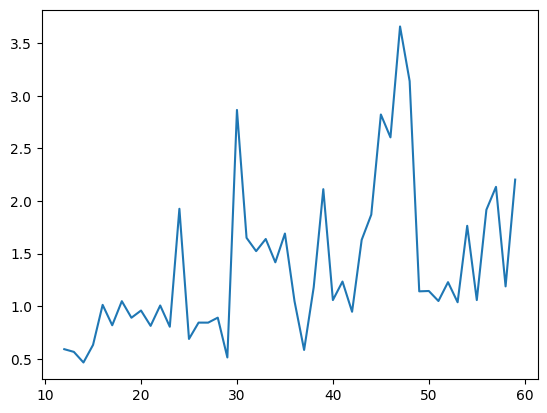

1.7600052772041546 29 49 0.7015559983715409


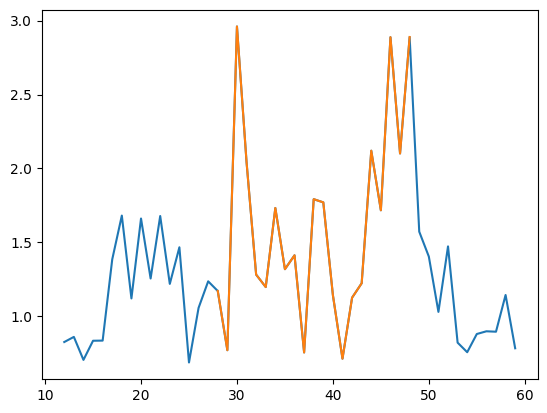

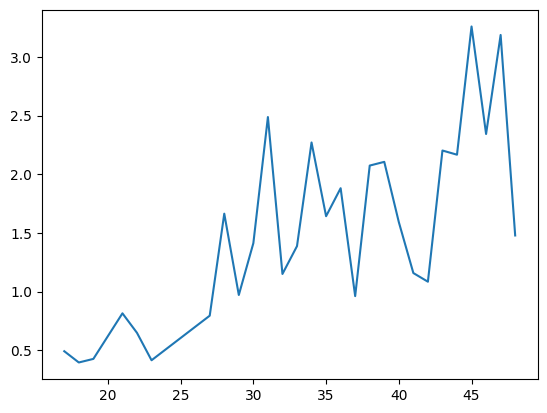

1.7992898440872023 26 46 1.2286334448443736


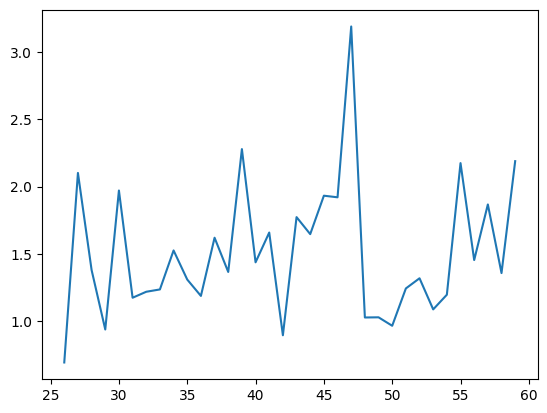

1.6080178509088545 26 46 1.3977570036527827


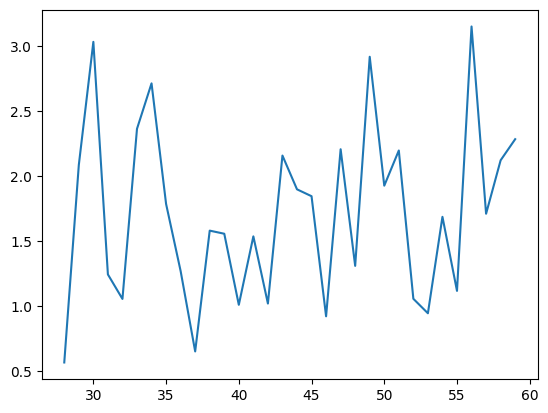

1.7214366324123334 28 48 1.324577094577774


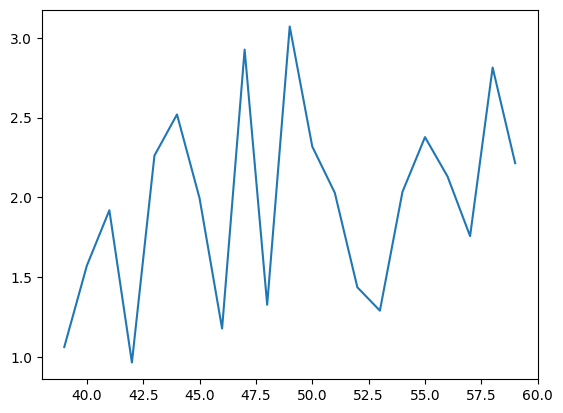

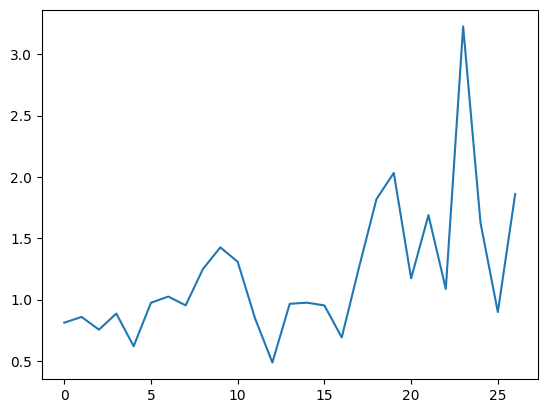

1.2696251748354452 4 24 0.7524148564091169


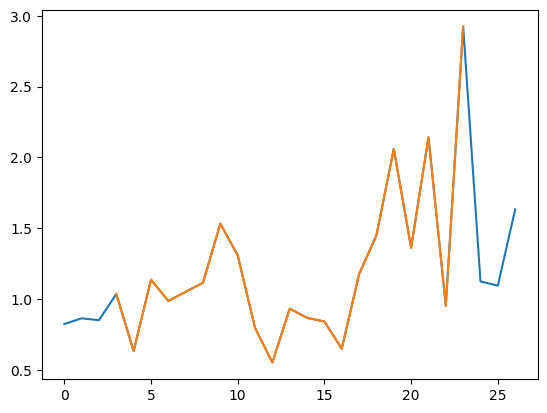

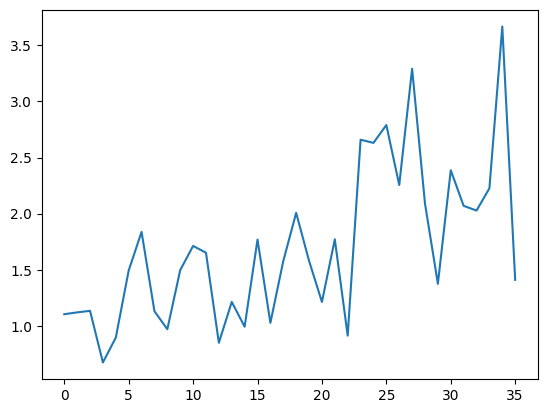

2.014984078493205 13 33 1.030912300901437


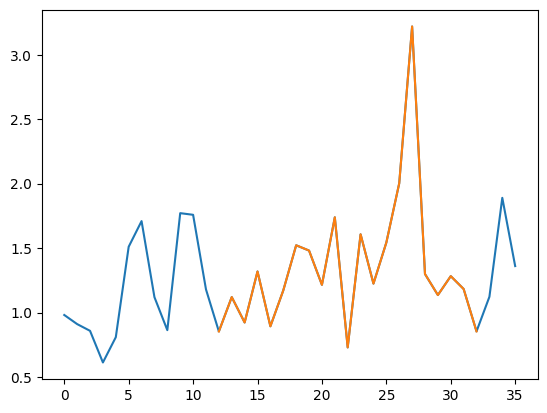

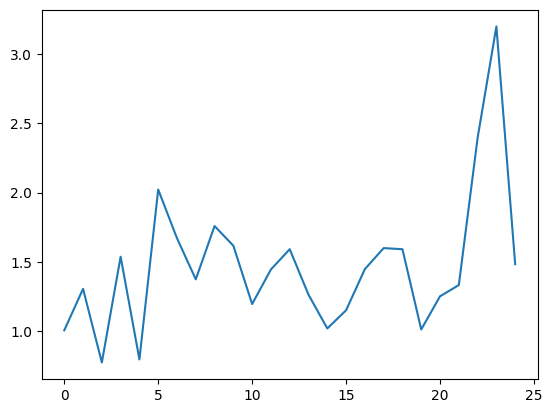

1.5372683651554173 2 22 1.041258849473662


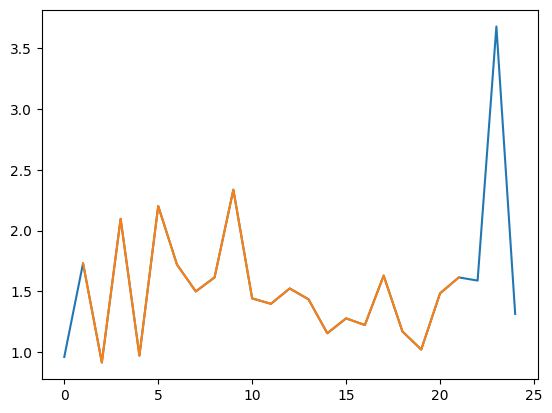

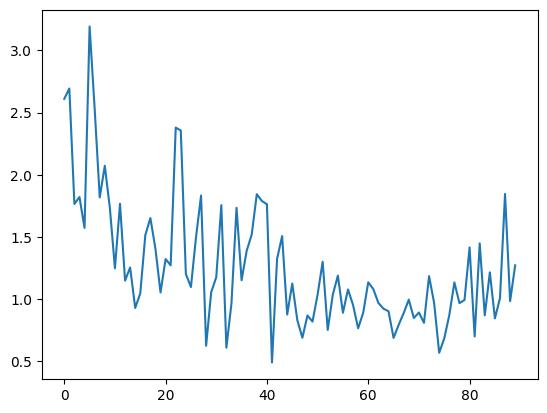

1.7205147485056262 -1 19 2.6517115732015335


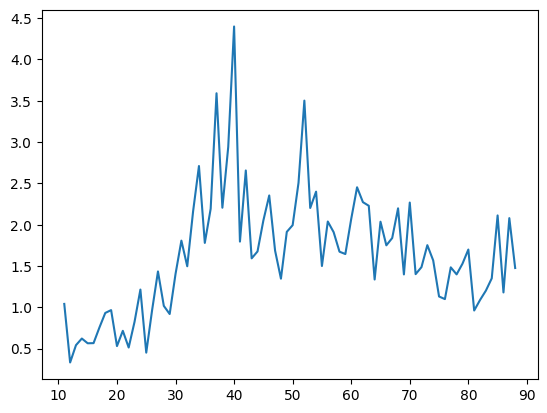

2.3568641630626934 33 53 1.829200407806181


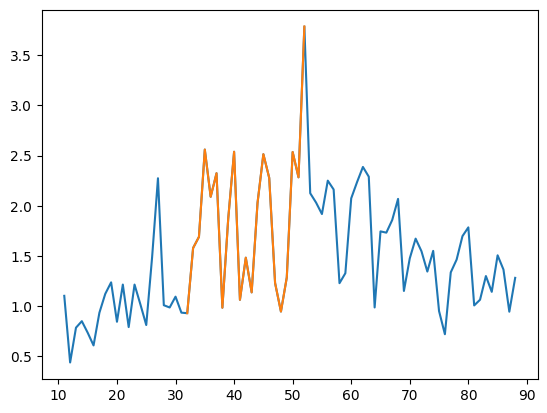

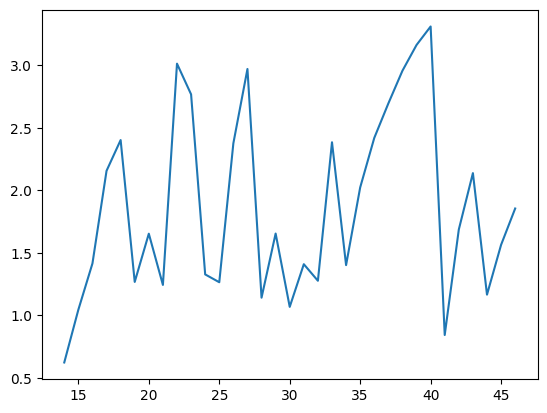

2.0722395342103463 19 39 1.8348558202696135


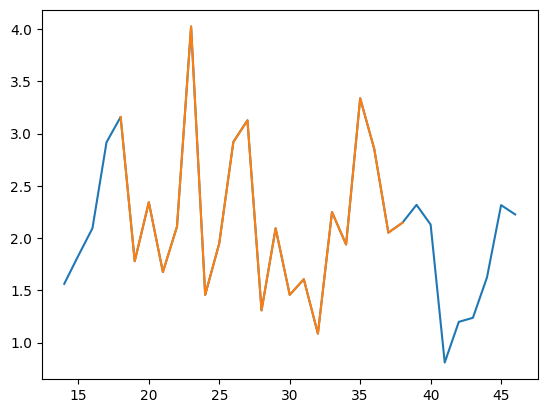

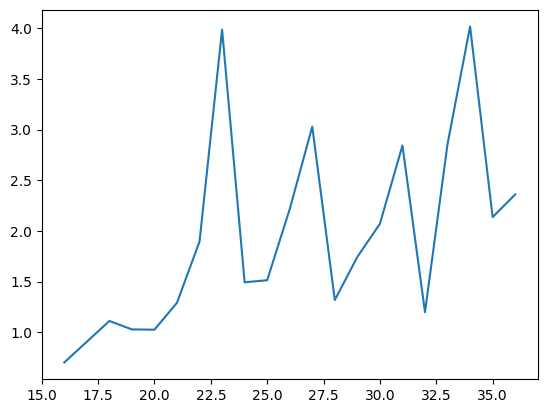

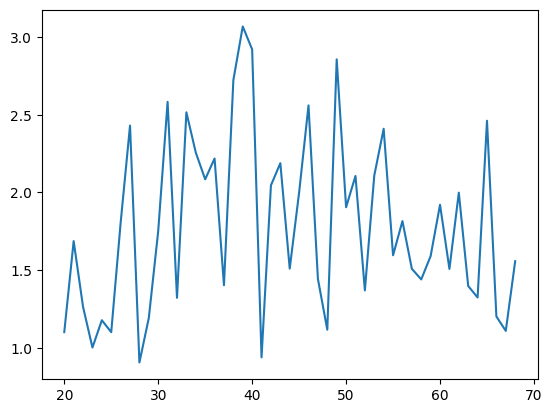

2.084098590338498 30 50 1.471032849994487


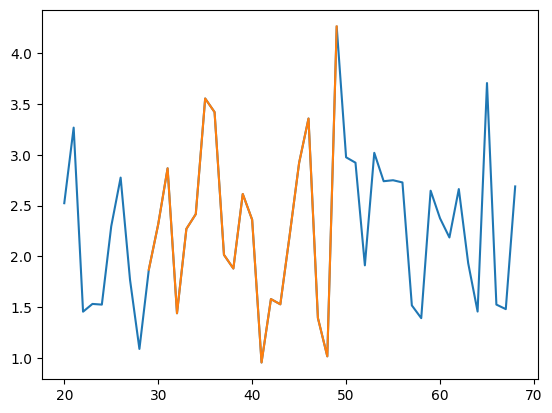

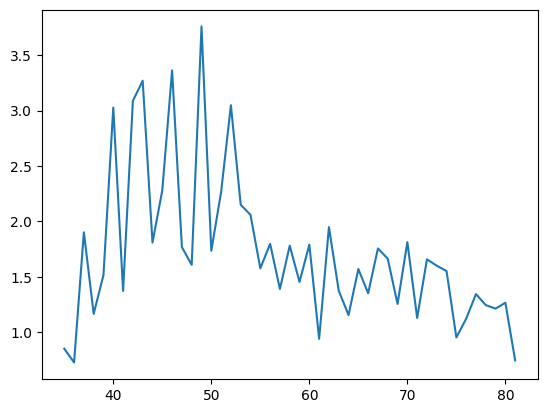

2.2087546548844803 39 59 1.34009027610501


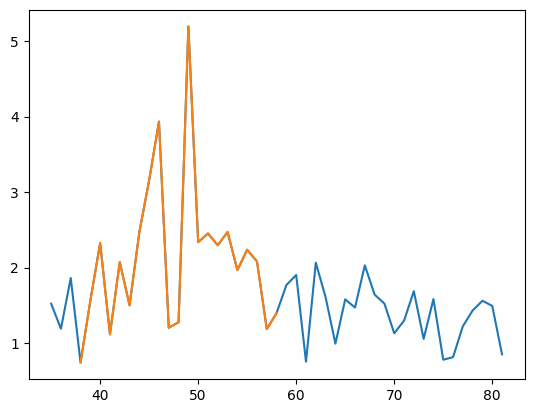

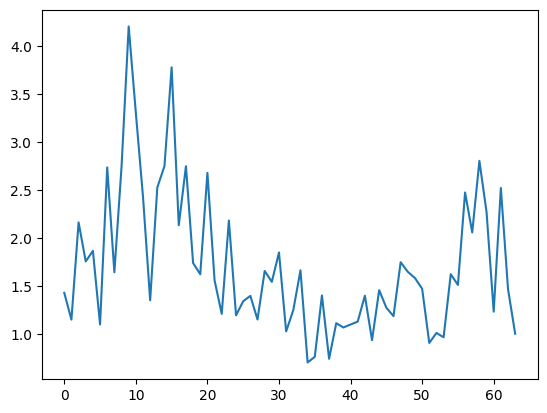

2.289640203860002 2 22 1.656894336014464


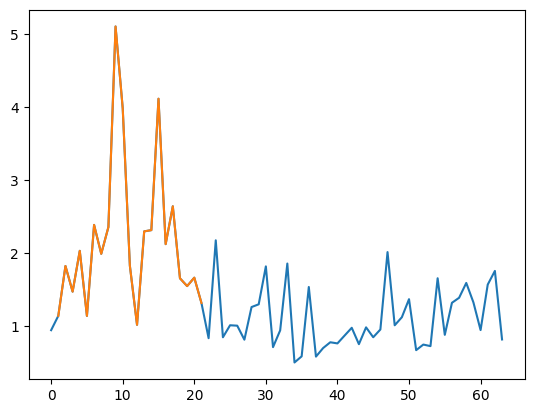

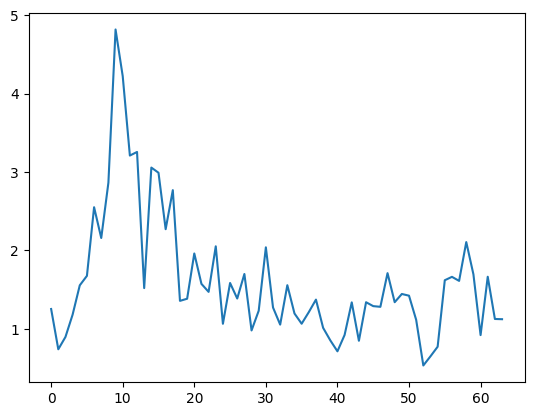

2.376419006819945 2 22 0.8190905653500653


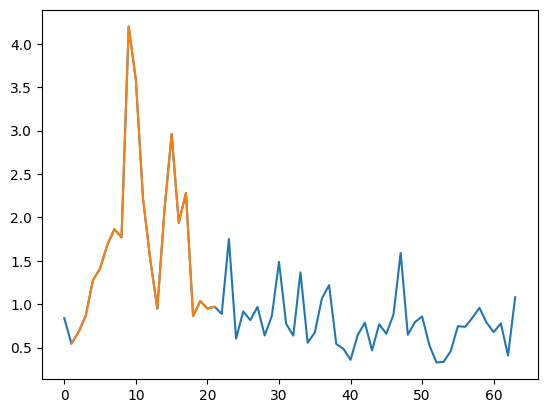

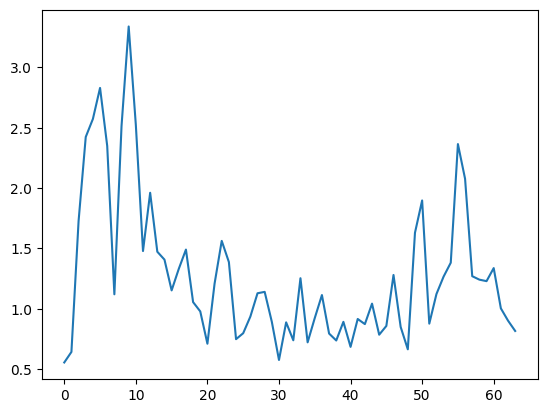

1.771276173466813 1 21 0.5982013333363843


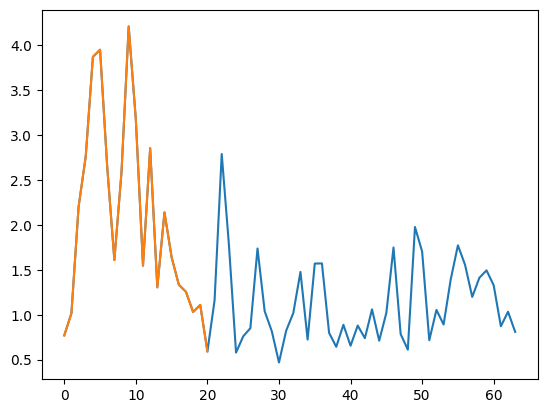

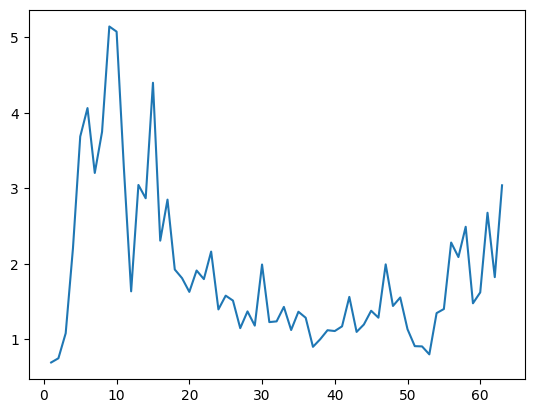

2.8622616832355154 3 23 0.9120690911206935


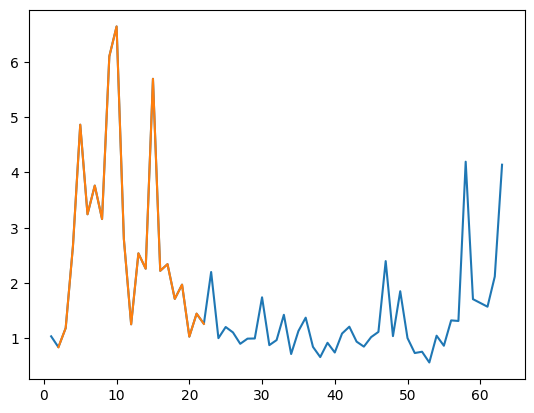

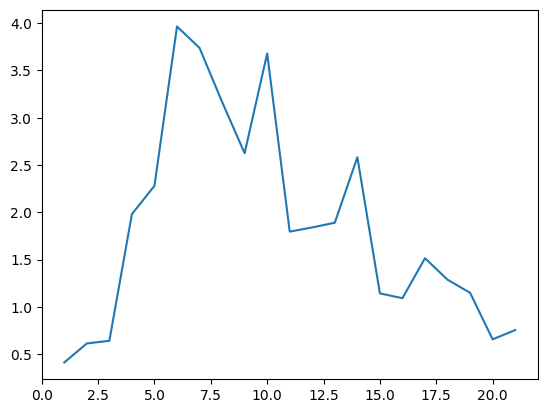

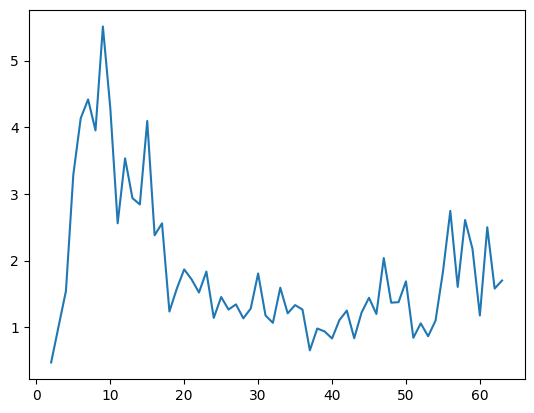

2.807879321802987 3 23 0.7420013513004968


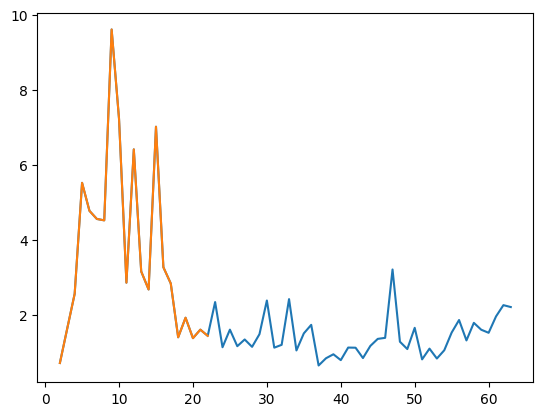

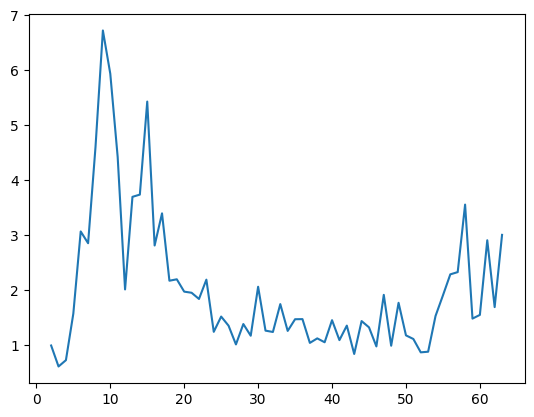

3.1102124999692458 4 24 0.6664224162822606


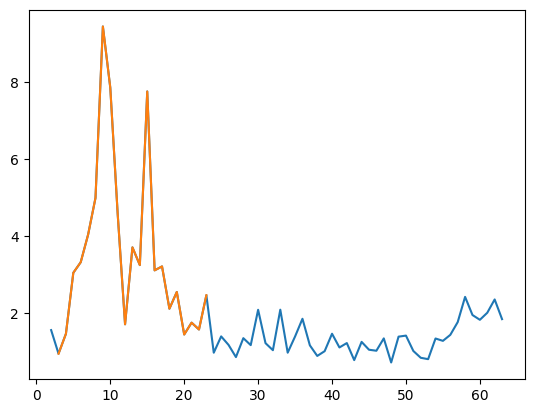

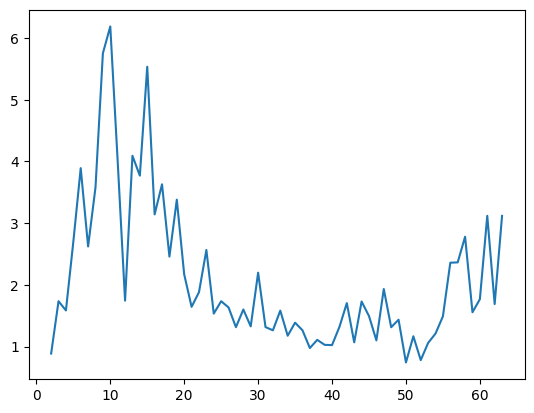

3.2412696232698357 2 22 1.3118001670937929


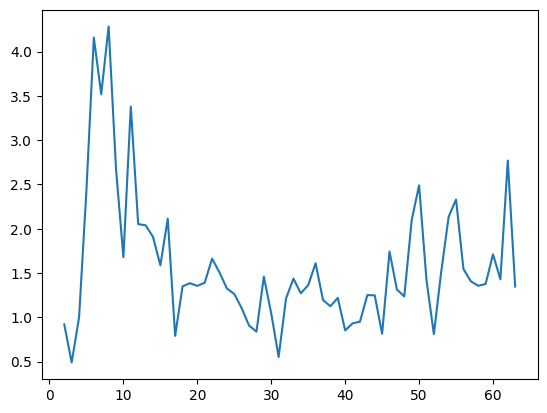

2.088617676850285 4 24 0.7436837426076148


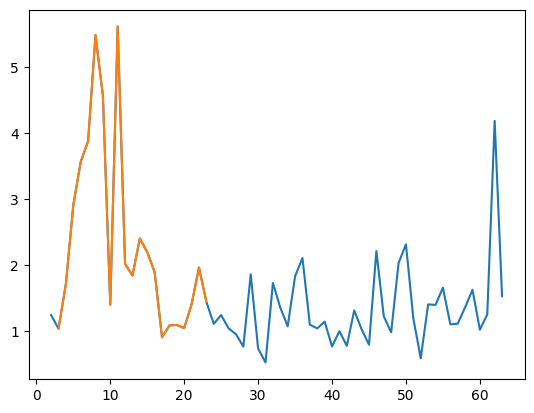

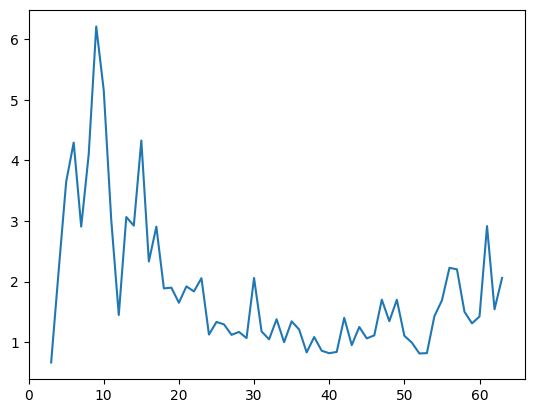

2.898918148887005 3 23 1.422047365125876


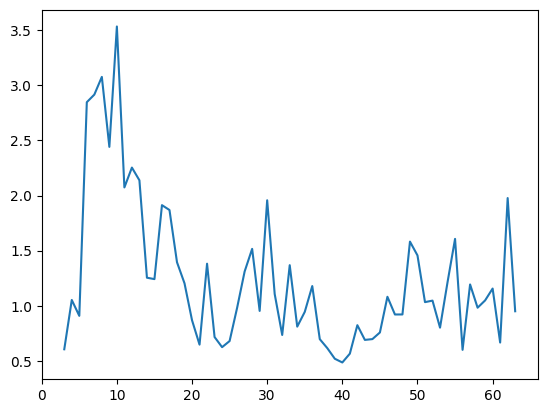

1.7312168796491914 3 23 0.8284787387280141


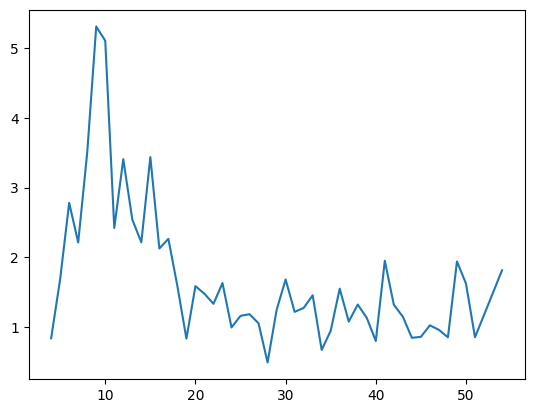

2.361491505203201 4 24 1.2602919940805313


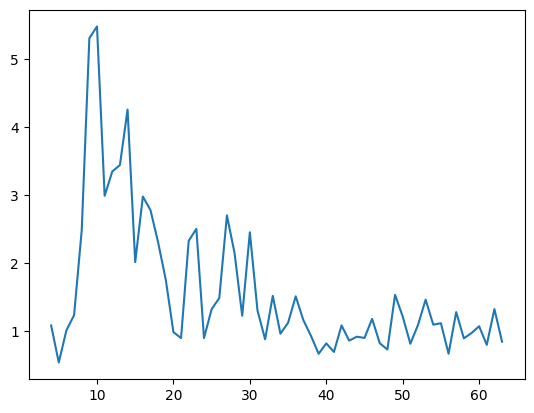

2.5895315161160557 7 27 1.1230957459301796


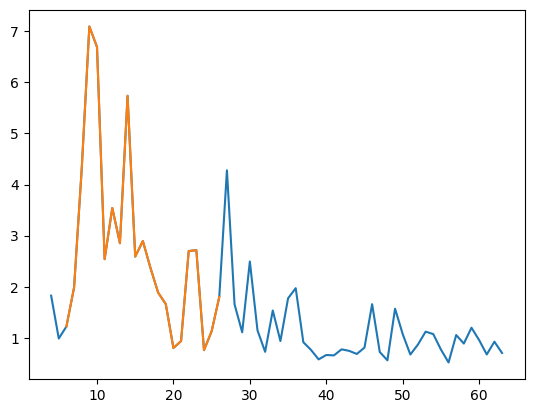

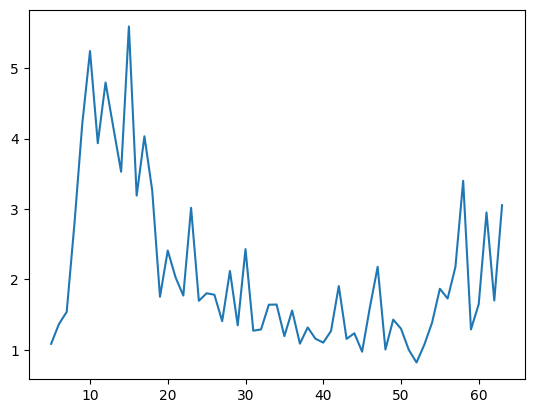

3.073421921227075 7 27 1.4534027217979335


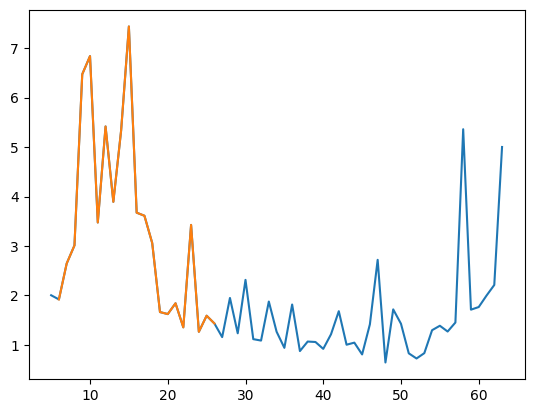

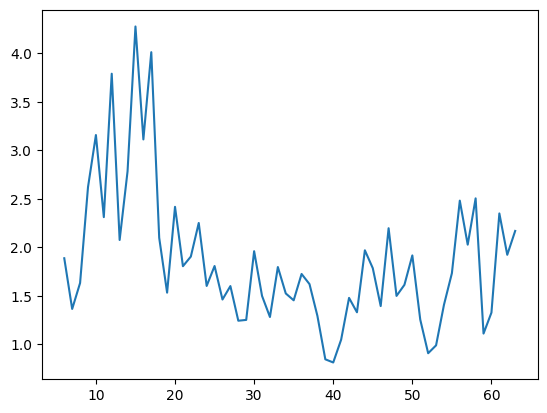

2.3751503747978084 5 25 1.6248761953672708


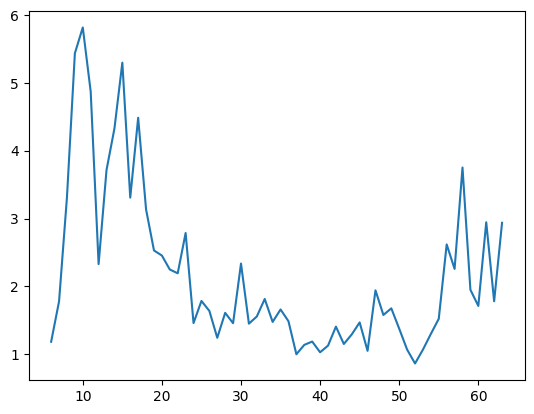

3.150188943561029 6 26 1.4787786897527422


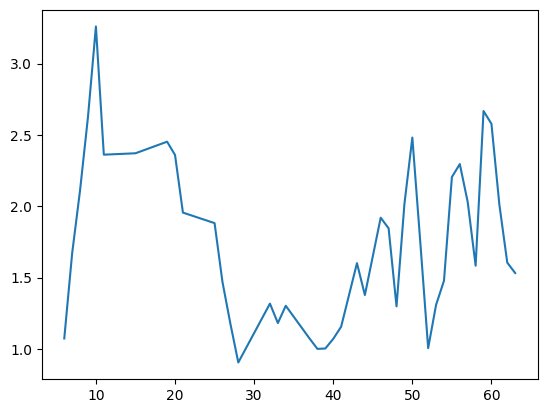

2.1417291130699083 6 26 1.3726830499294151


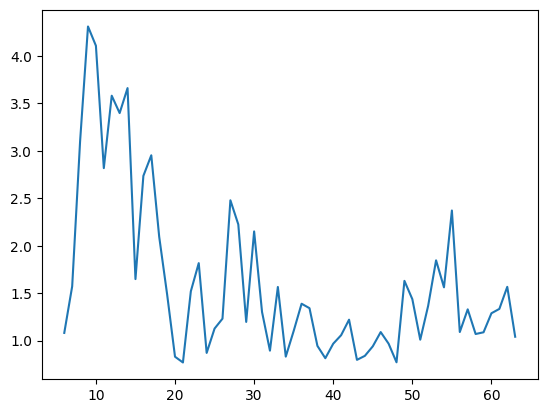

2.3224265849835235 7 27 1.3263150749012325


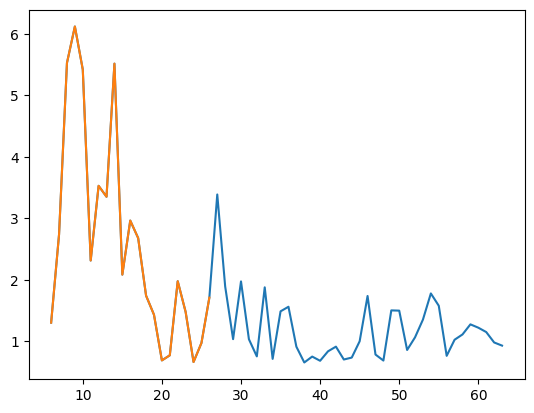

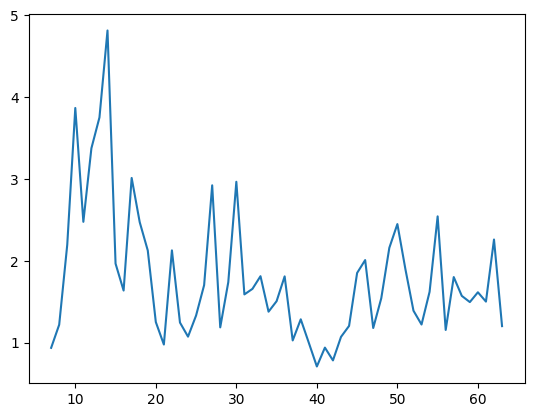

2.2866899344432583 9 29 1.7077940389835926


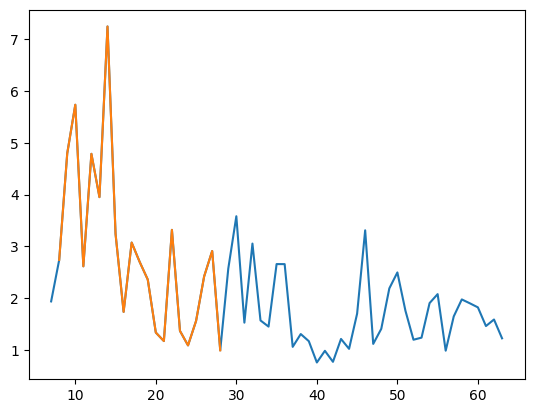

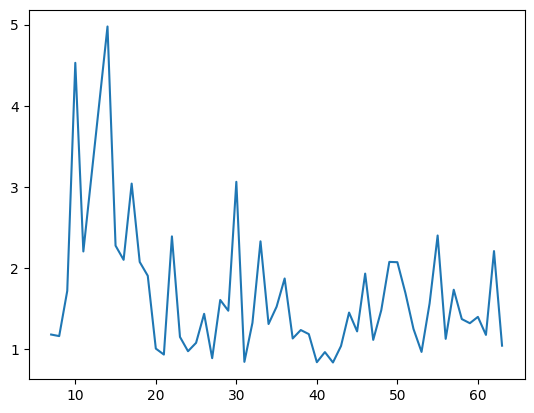

2.059510283685672 9 29 1.441087665386616


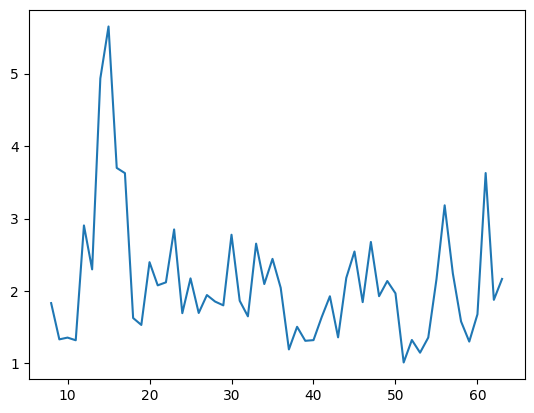

2.53179381781017 11 31 1.3386612584788637


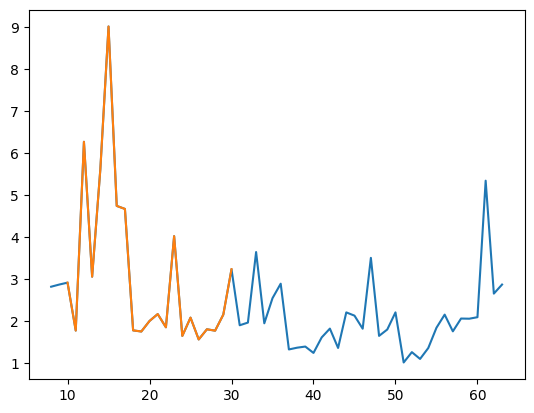

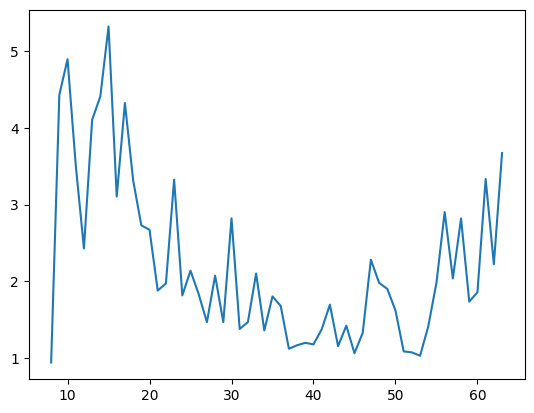

3.011053289849844 8 28 2.687585782824194


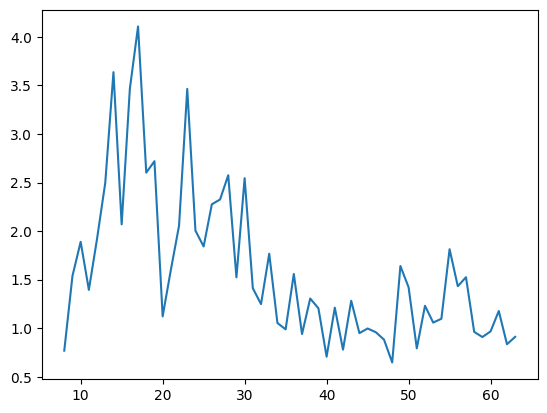

2.3640452636793547 9 29 1.153607142936147


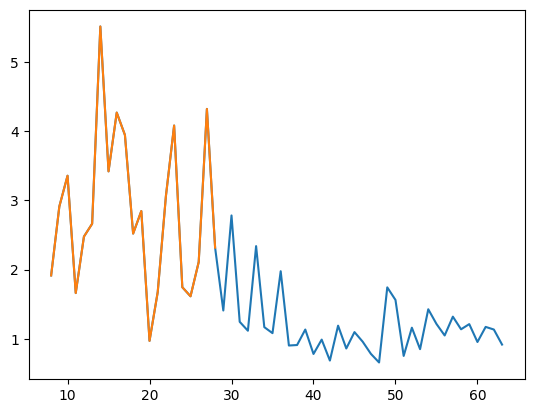

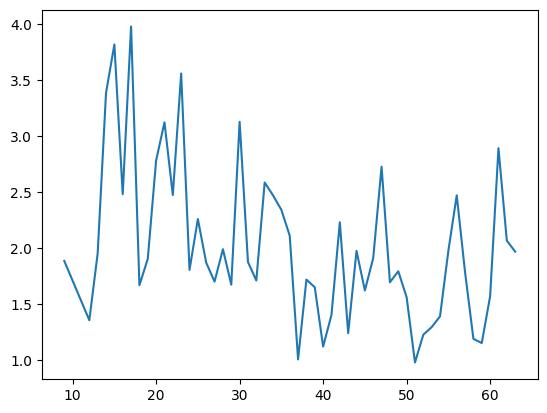

2.4897824581987757 13 33 1.6562887761210046


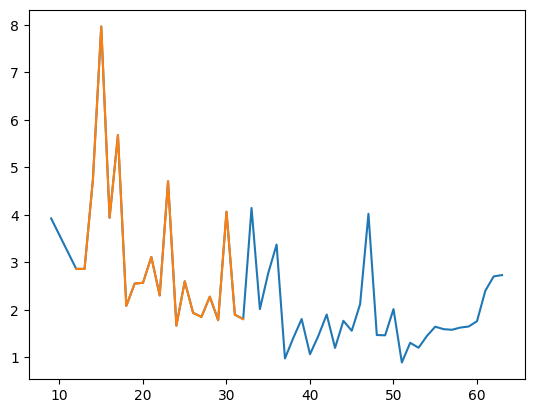

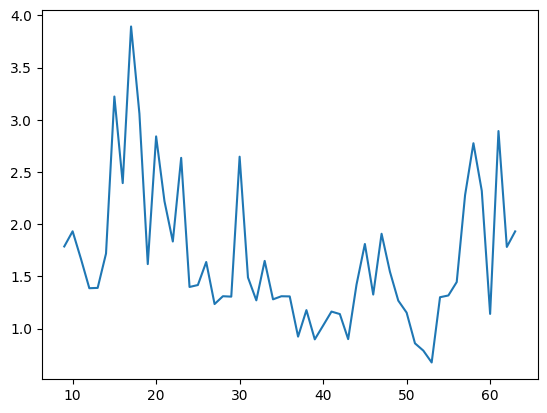

2.0364421420297845 9 29 1.8594789976165902


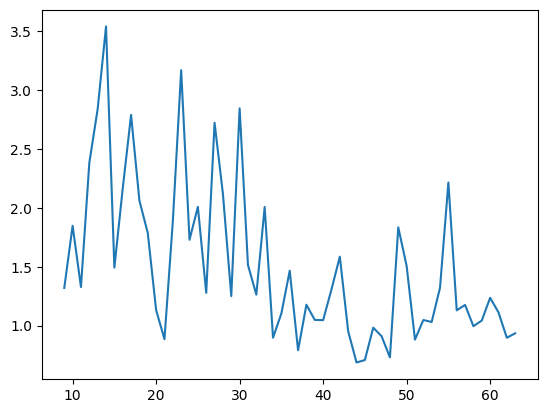

2.058243978839729 9 29 1.583150033981922


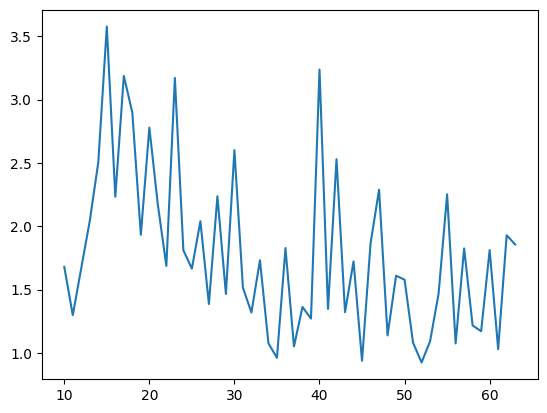

2.218545570248619 9 29 1.4891997930947378


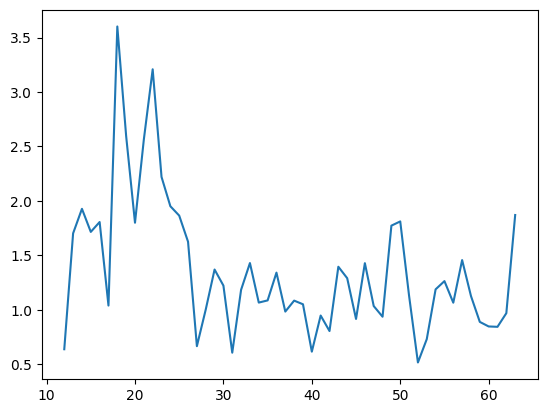

1.7659446926558526 12 32 1.1692075698707365


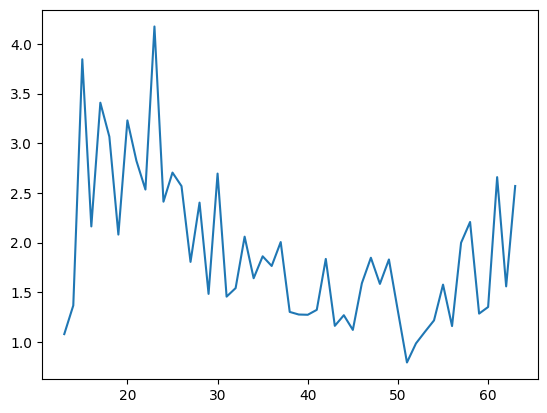

2.474204712926943 14 34 1.2227358101627885


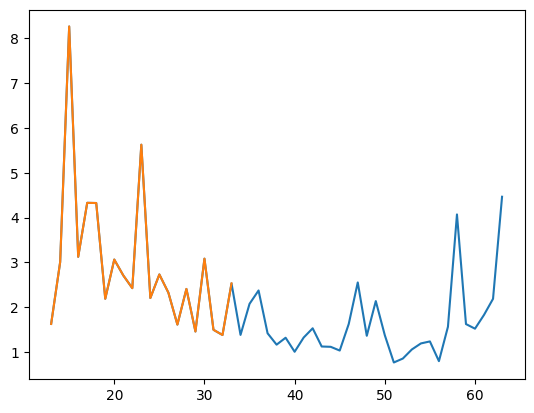

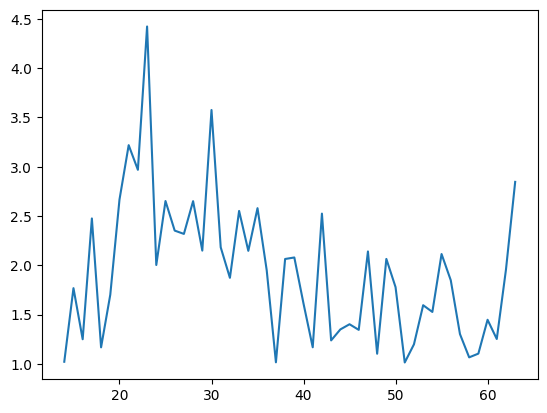

2.4344584489072174 18 38 1.8216757643164079


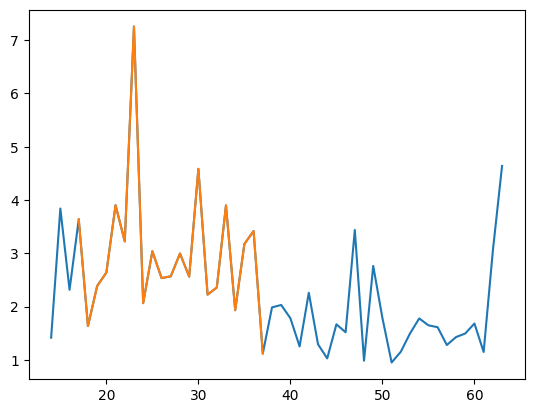

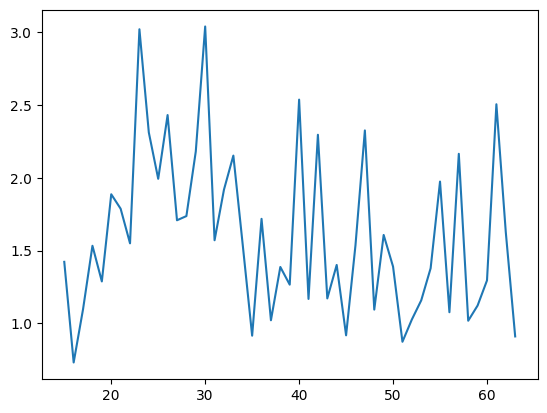

1.8892592516733657 19 39 1.4100218209219948


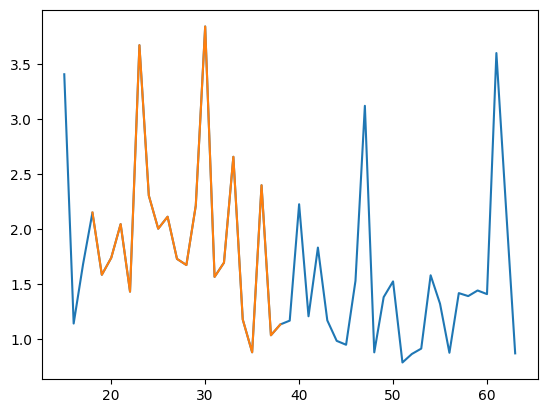

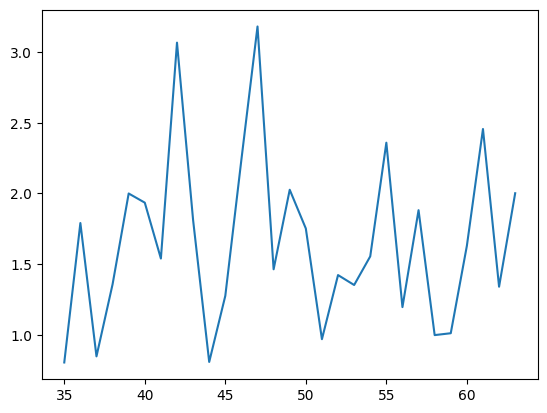

1.723078620682728 37 57 1.3184790372076098


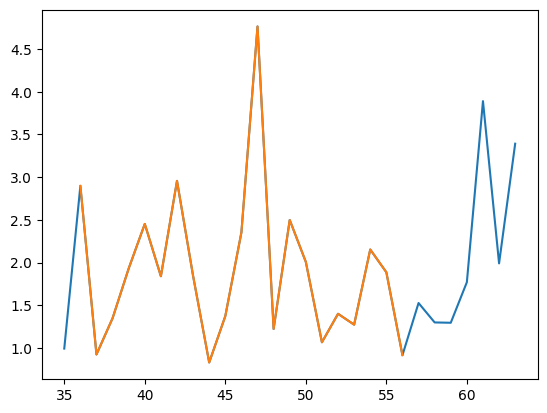

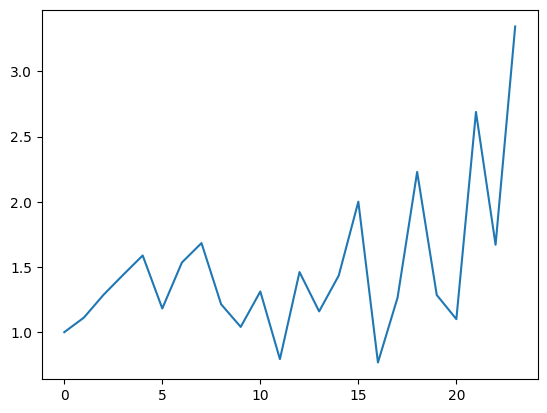

1.4358885417602214 1 21 1.0573329813733388


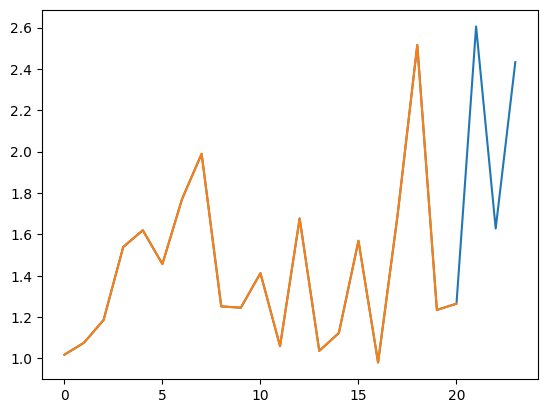

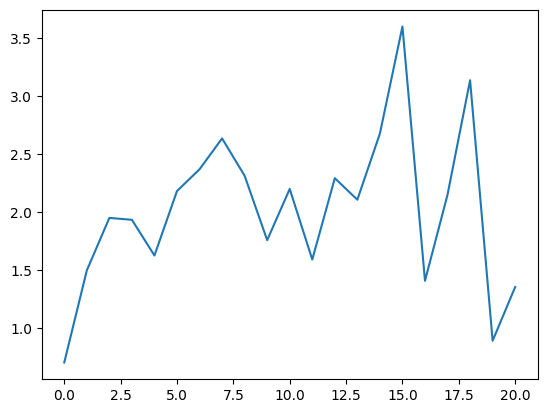

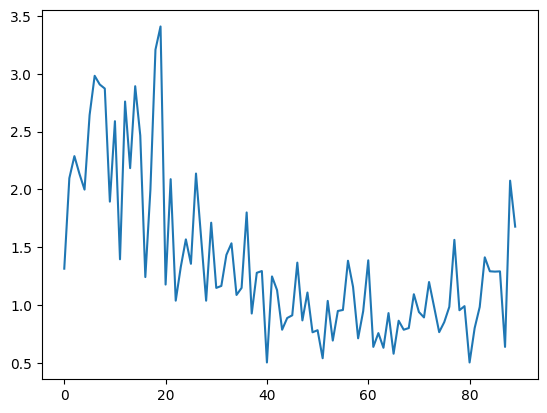

2.3447405360711557 0 20 1.7064298029071021


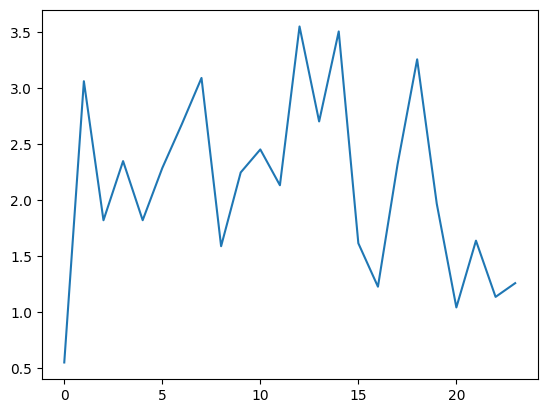

2.2996847832504734 0 20 1.8033020936679622


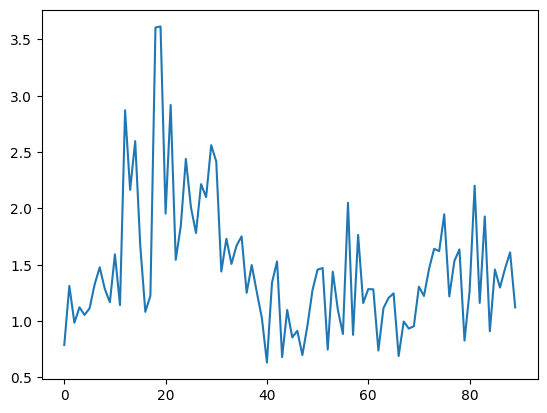

2.1805078751201368 11 31 1.367052358978731


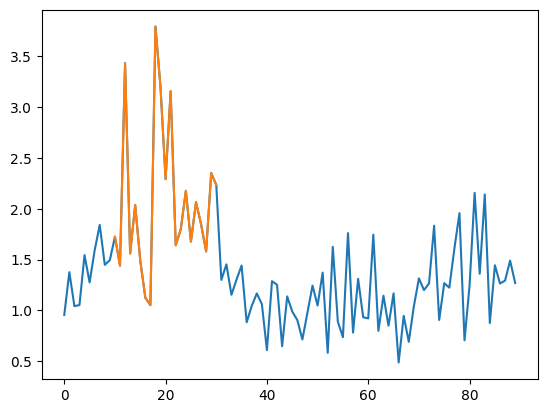

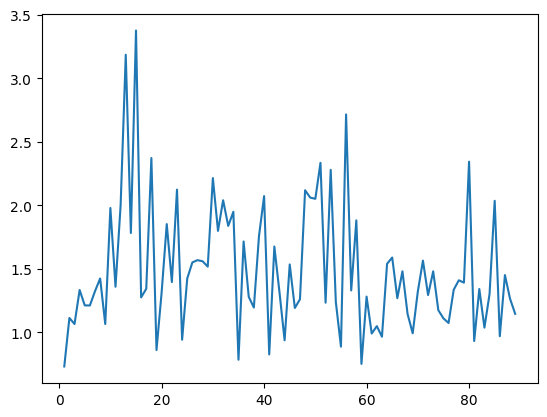

1.7849855599913993 11 31 1.668292791364923


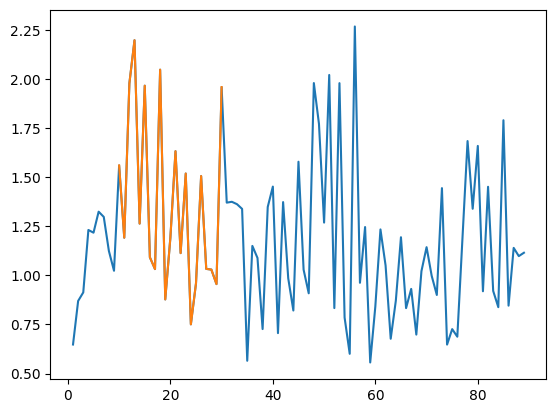

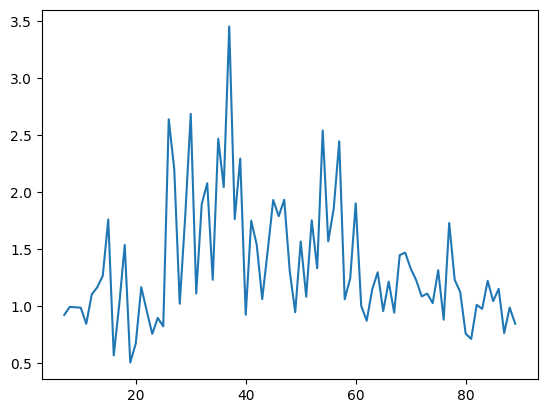

1.862351800164989 25 45 0.856052864291285


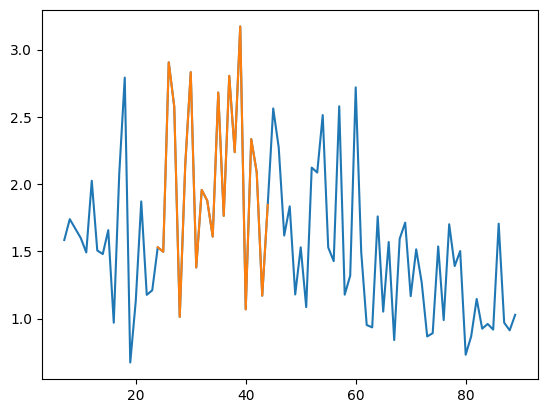

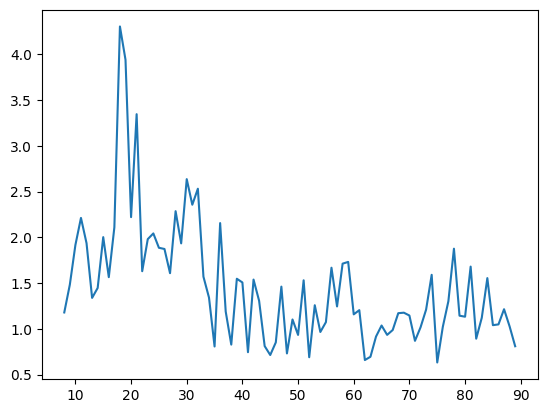

2.2370328871073863 11 31 2.0644084373570735


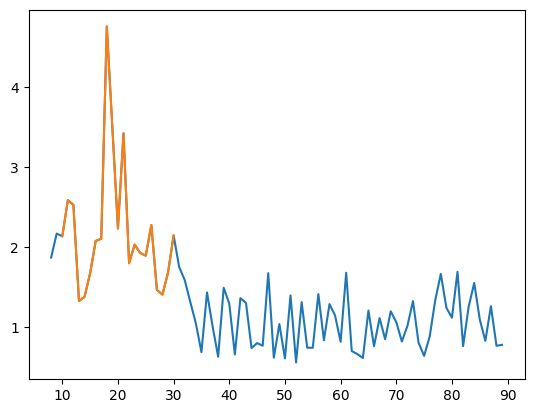

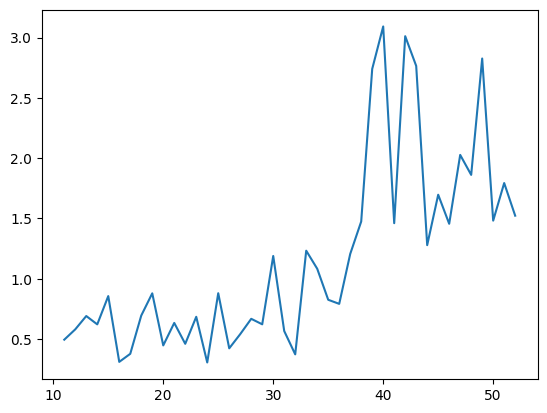

1.6685266457580963 30 50 0.9054175278420935


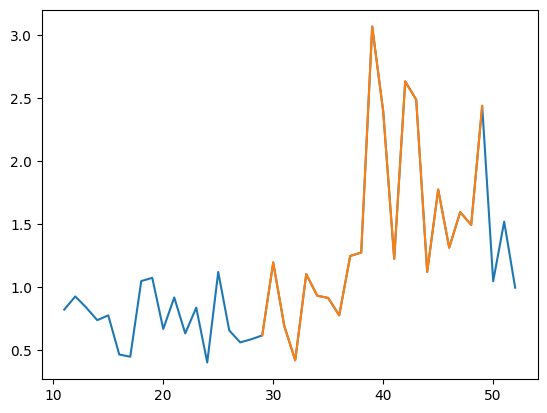

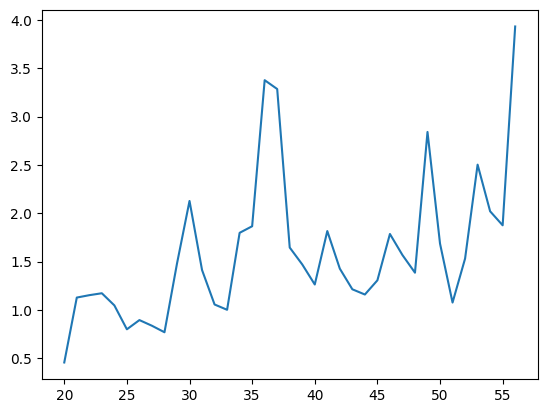

1.8138419220315345 34 54 1.3987087511479852


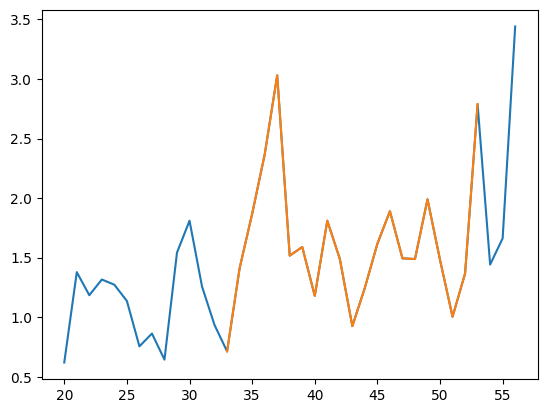

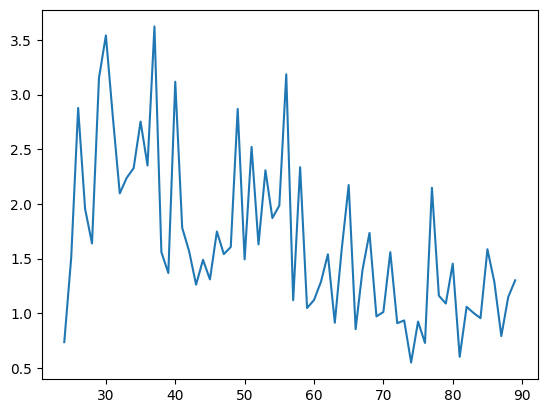

2.216245173429441 25 45 1.1215319250923907


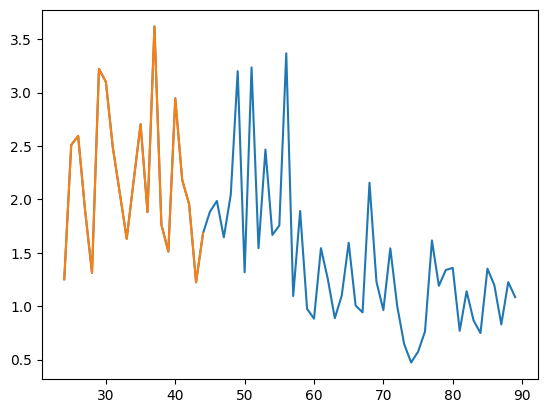

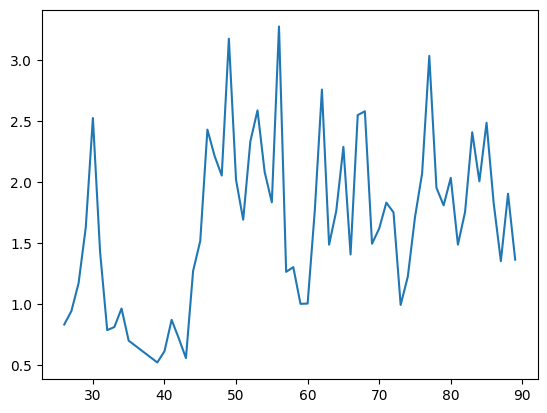

2.012322791423029 47 67 2.3241764822333284


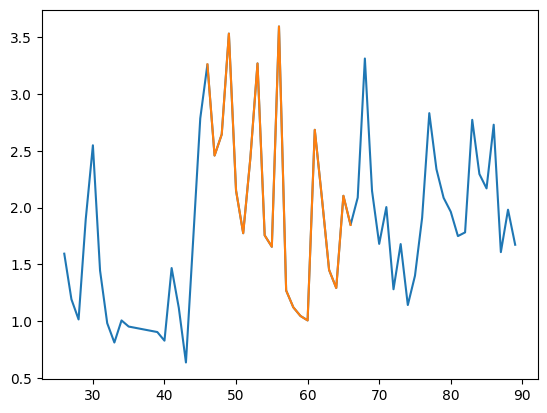

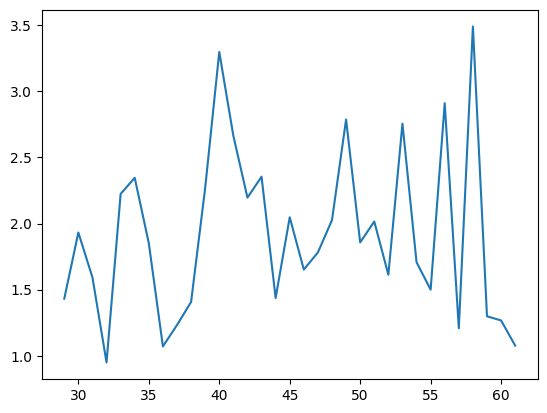

2.1417473564111367 37 57 1.151721213503744


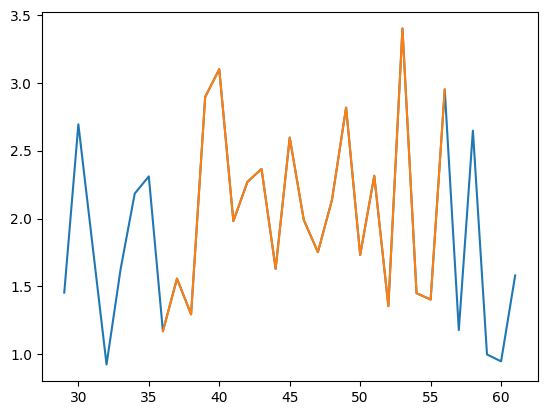

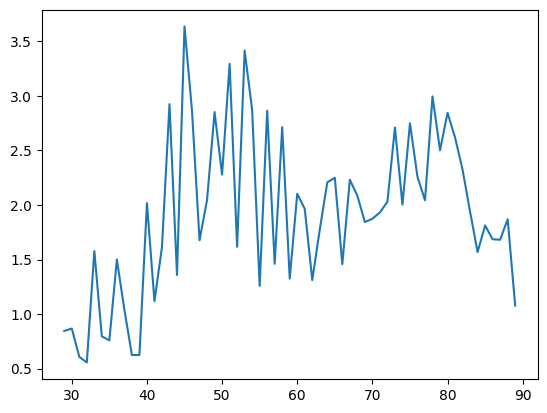

2.2751165005448386 44 64 2.1413607299367863


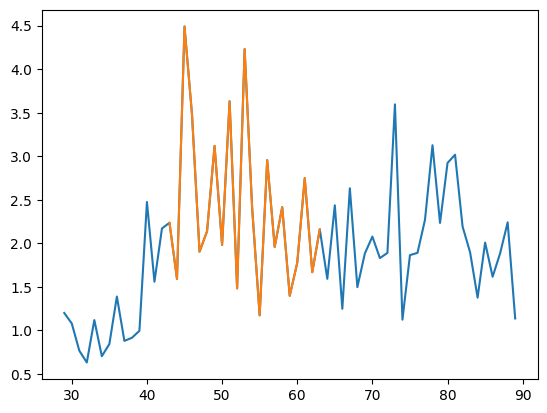

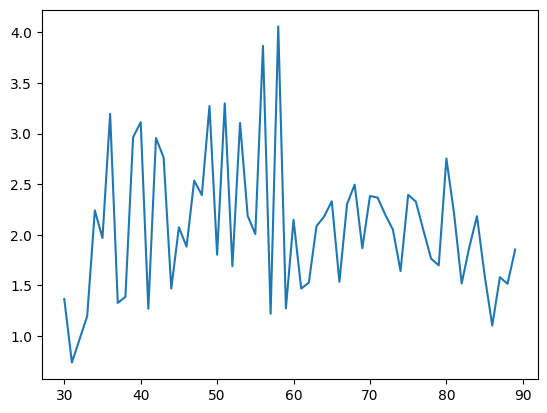

2.443424058646458 37 57 2.261019547744996


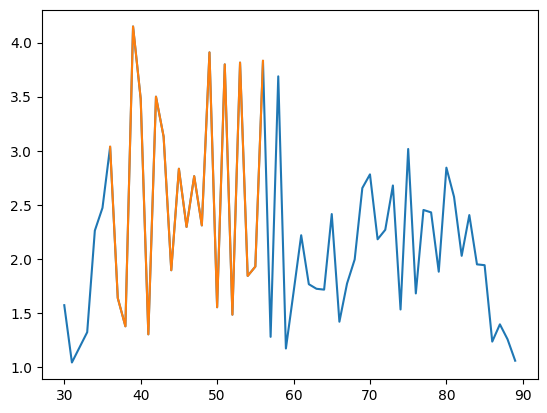

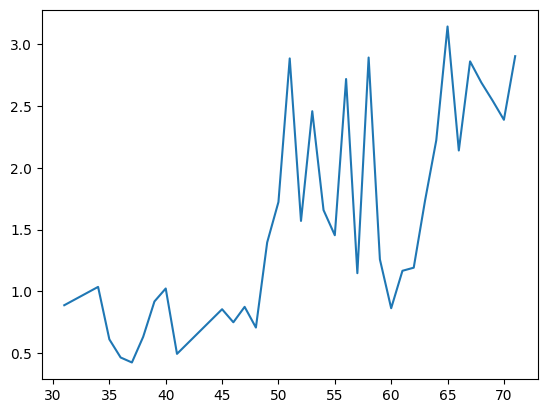

2.034273021522191 49 69 1.0511275140546044


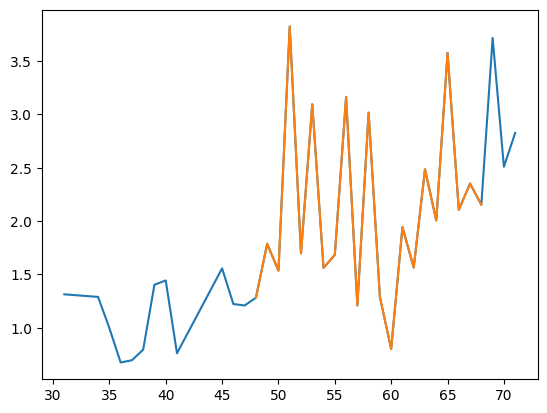

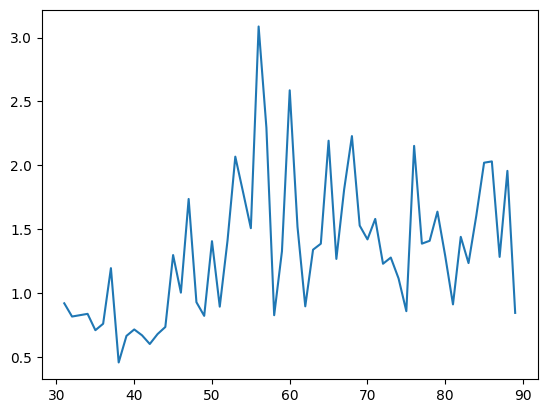

1.6810626471968506 51 71 1.1503331547077496


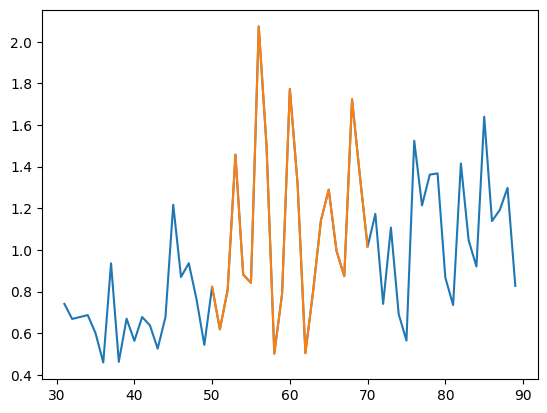

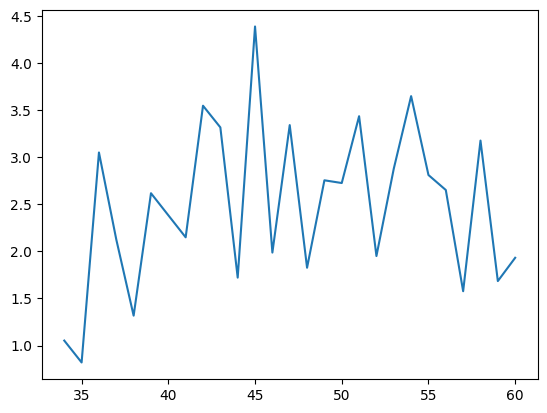

2.7122566106984456 35 55 0.9366531933569429


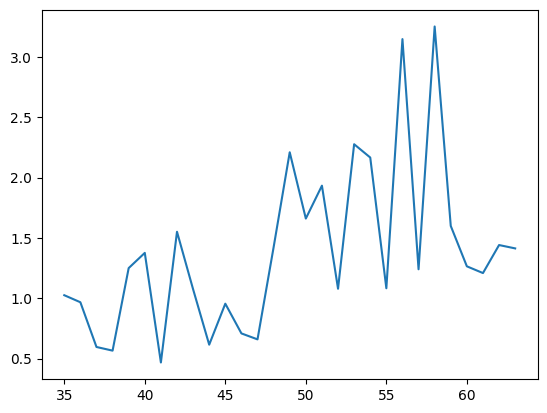

1.549712931503581 41 61 0.9221958985847795


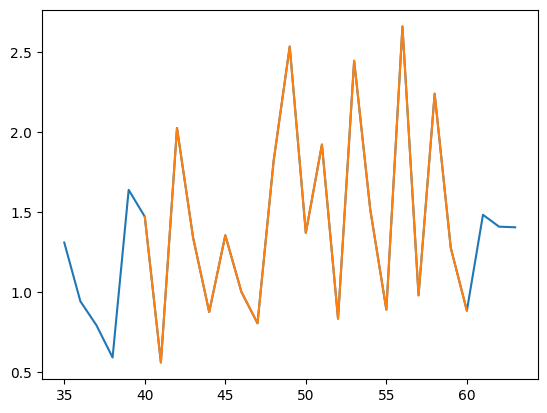

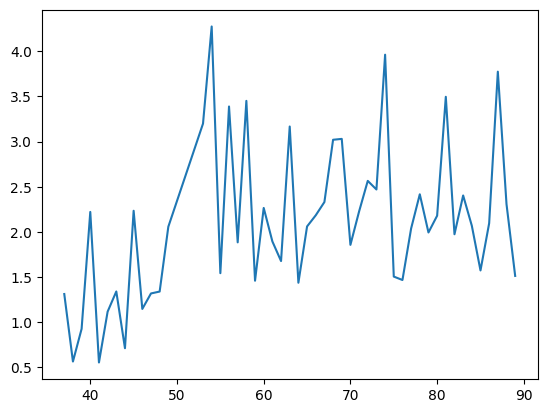

2.483269302765199 53 73 3.7374855670729508


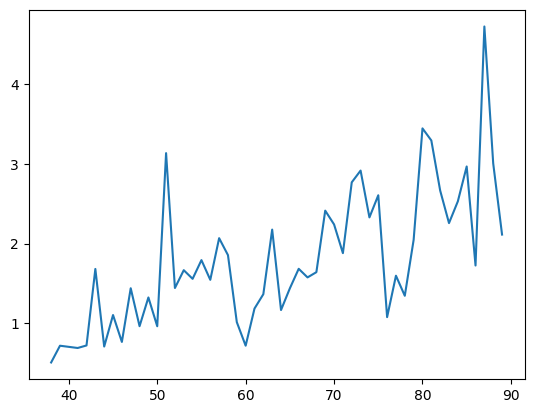

2.4506543694460476 67 87 1.6286700069812254


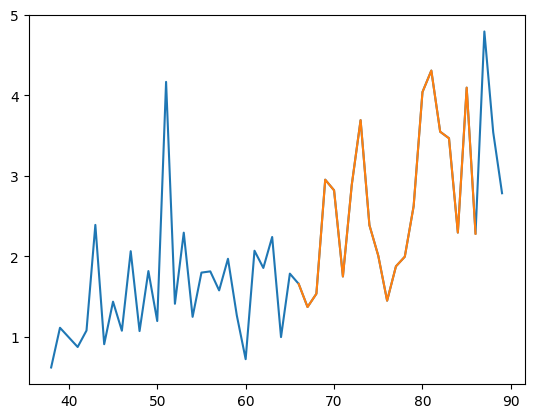

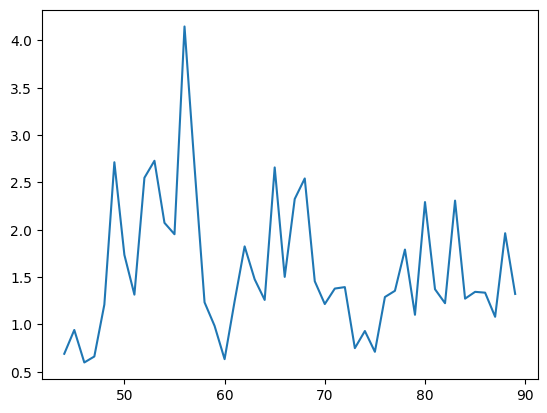

1.9531800708192304 48 68 0.9349959272027241


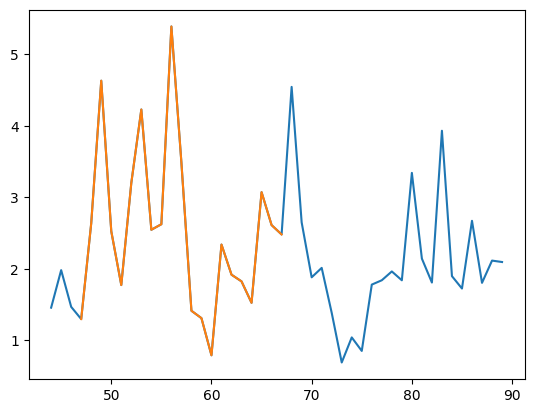

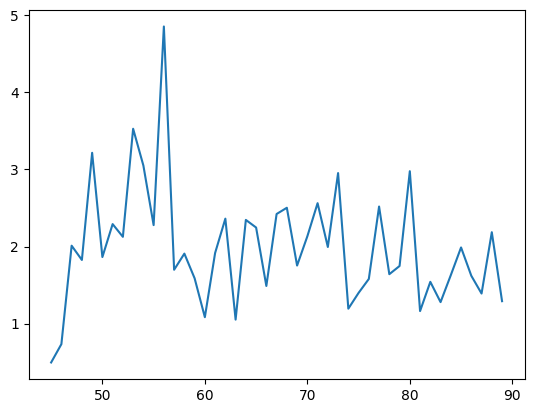

2.2727053306485625 52 72 2.2087693974179246


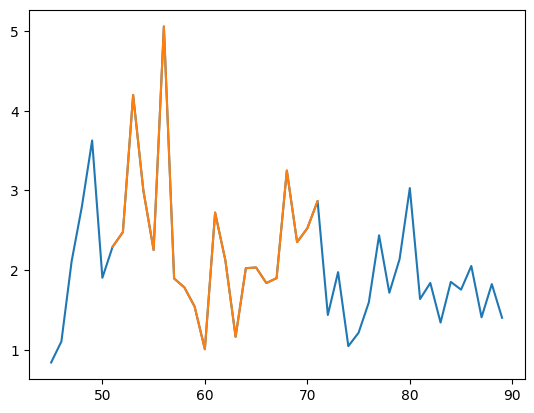

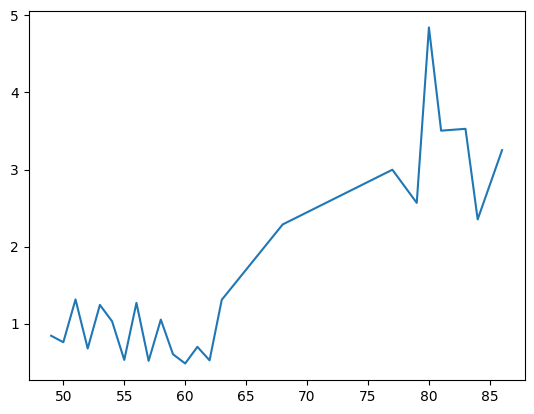

3.15456721338488 67 83 2.642430969869055


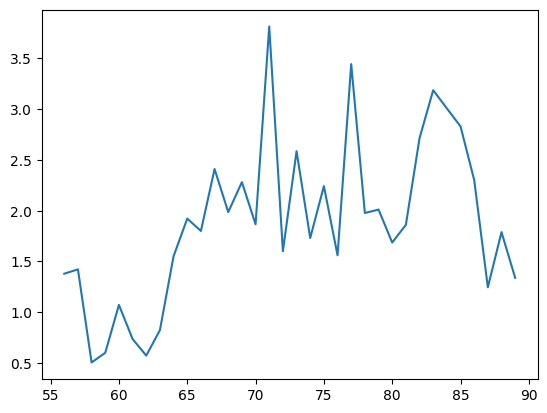

2.328660401062455 65 85 1.7369033597008863


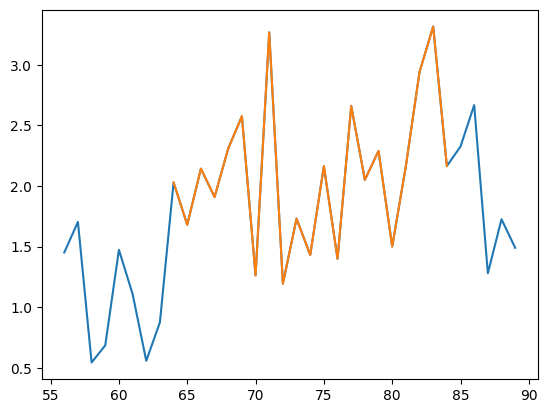

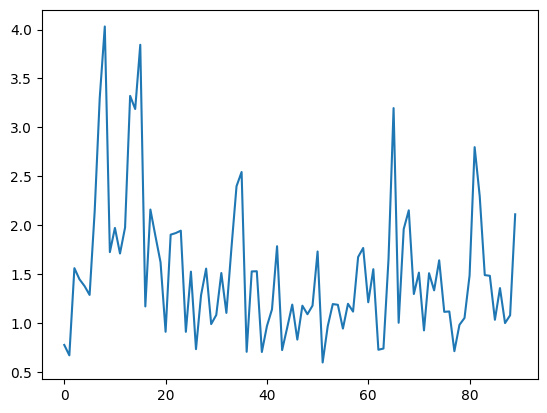

2.1341380455675028 2 22 1.1137430896374483


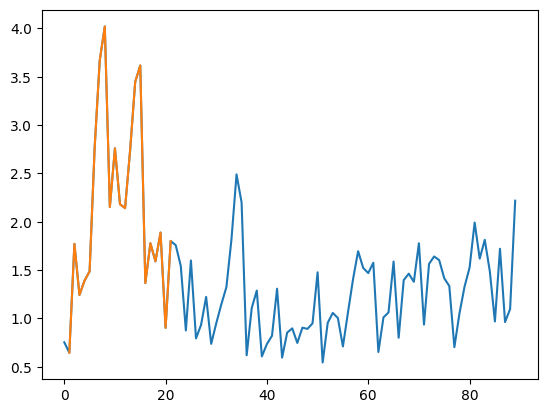

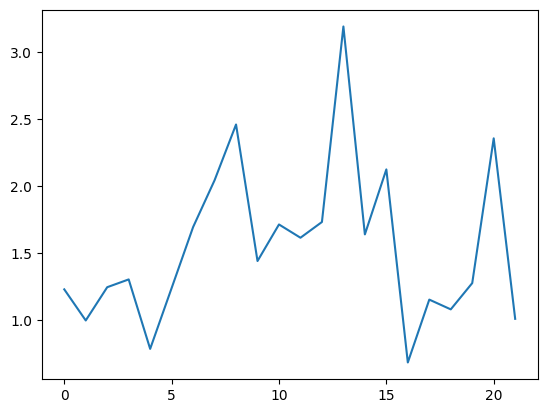

1.5703731541318244 -1 19 1.1112102287588512


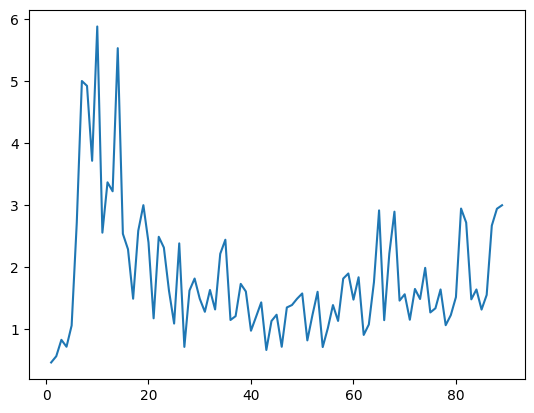

2.9655408589058116 5 25 0.8822471272104869


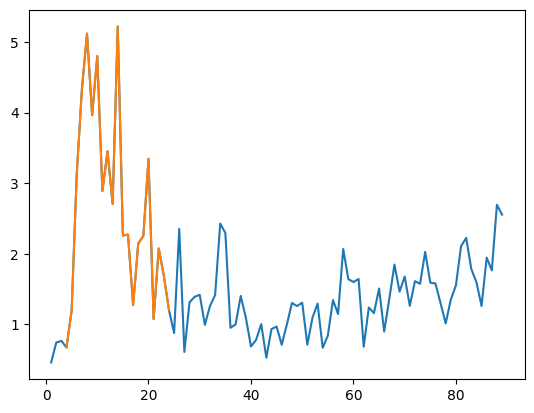

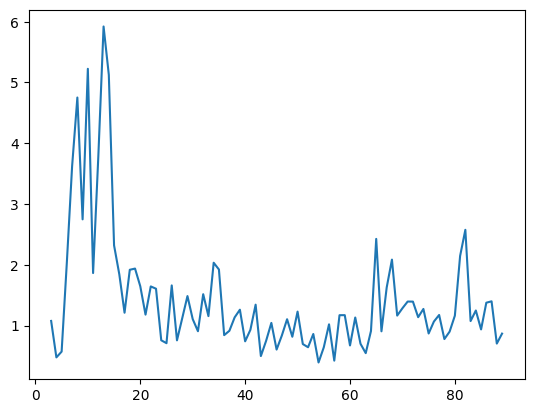

2.548821885994716 5 25 0.523690625860635


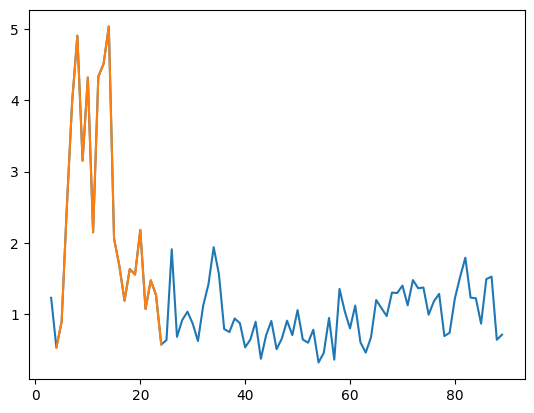

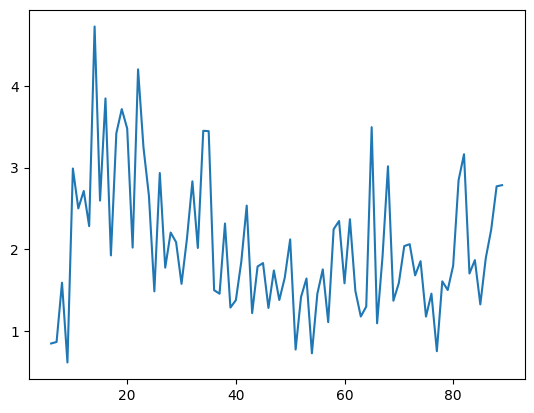

2.7804658759432286 9 29 1.10078191414518


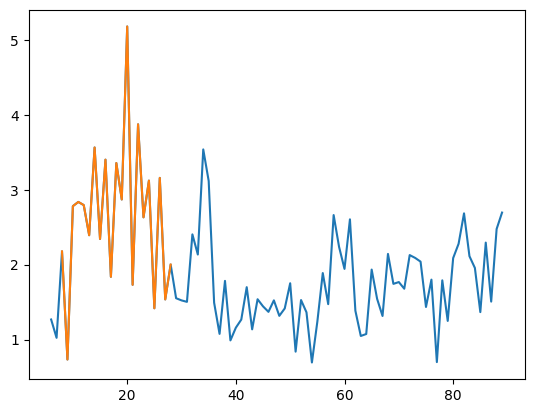

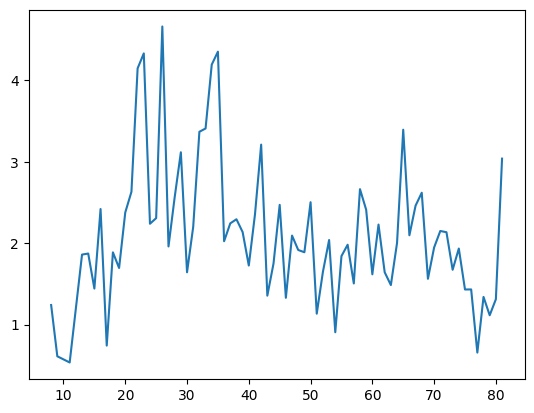

2.880424457827156 21 41 2.504616146487926


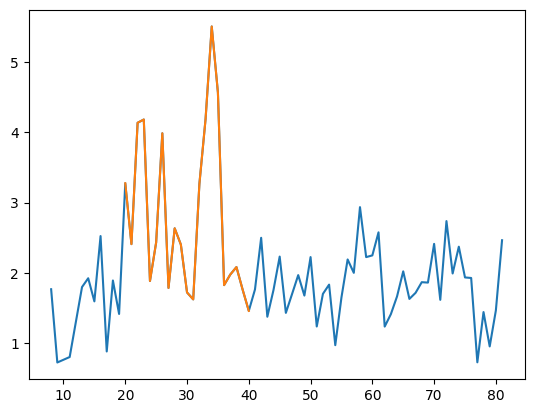

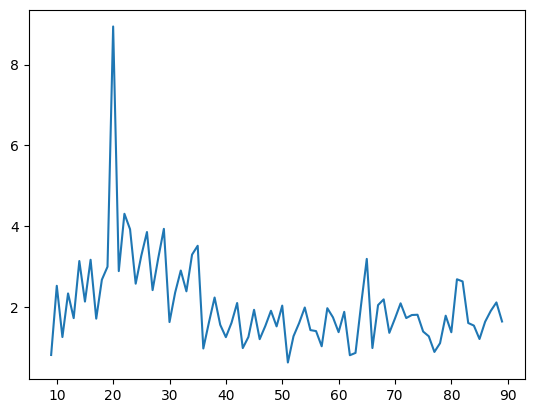

3.239398294047777 14 34 2.427495432521897


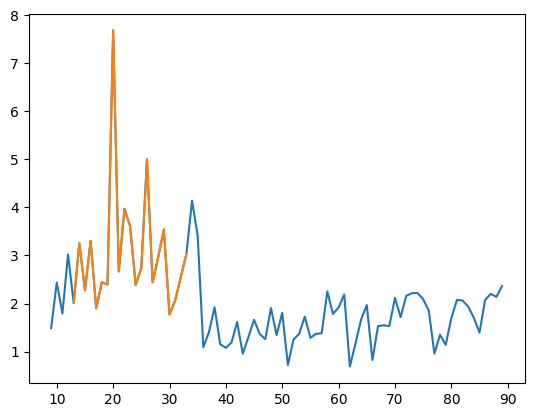

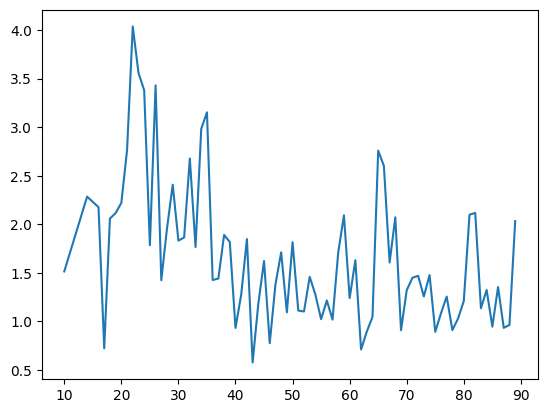

2.4157647515306957 15 34 2.2305663256955137


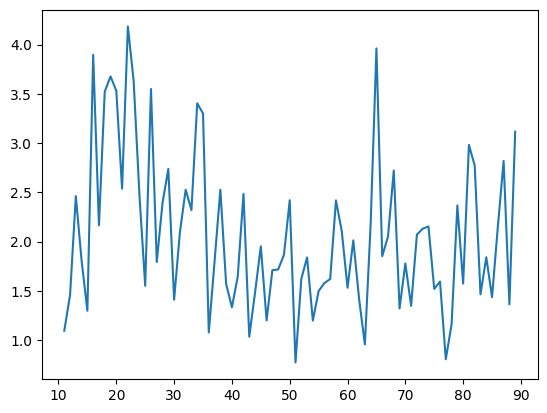

2.761125655579354 14 34 2.1325699989727465


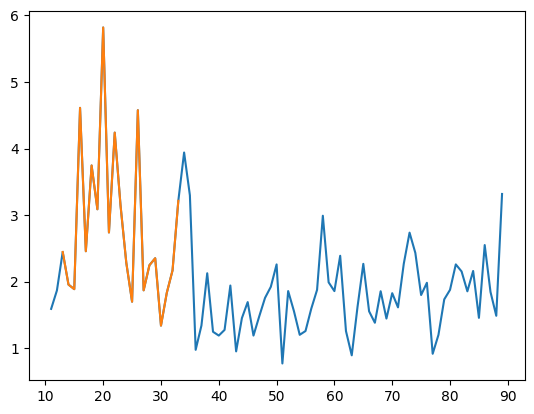

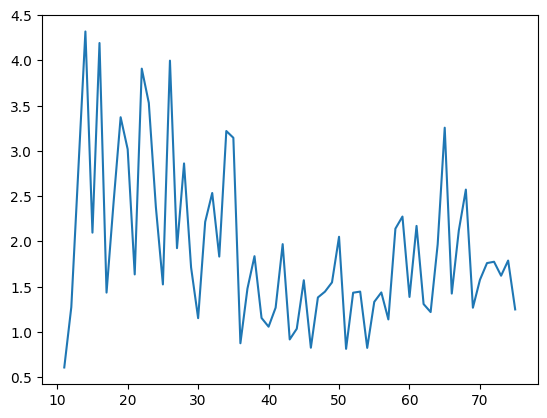

2.633272825169629 13 33 2.7970972099142344


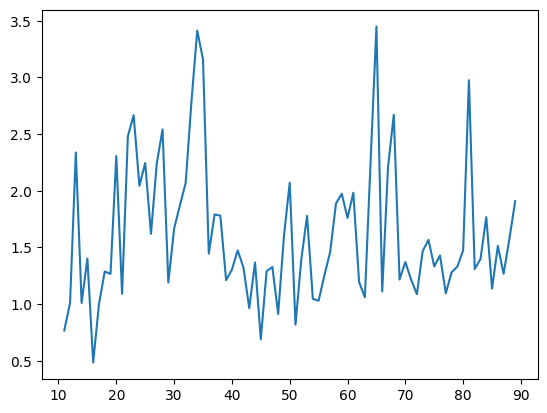

2.0455302623302507 17 37 0.741522137386413


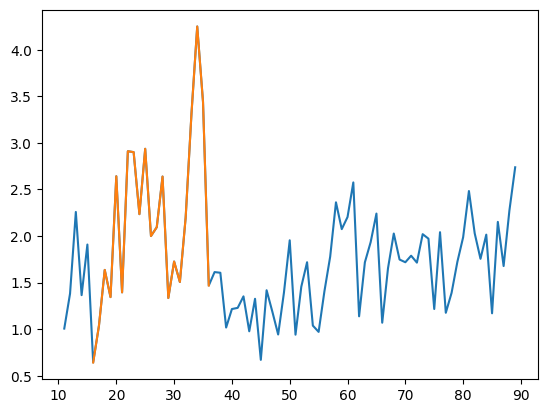

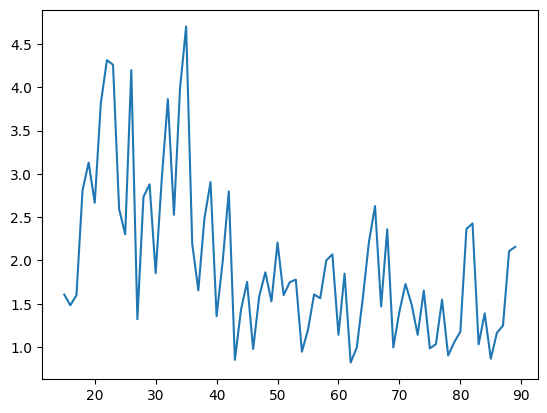

3.016021951960459 18 38 2.205469014321276


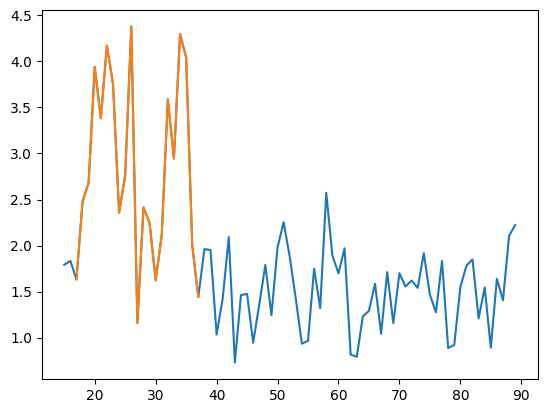

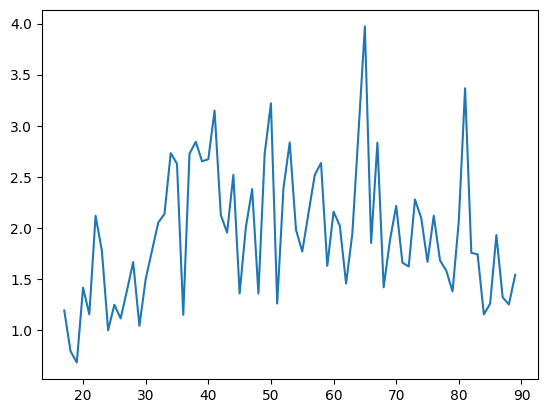

2.323997598688559 32 52 2.093420530521039


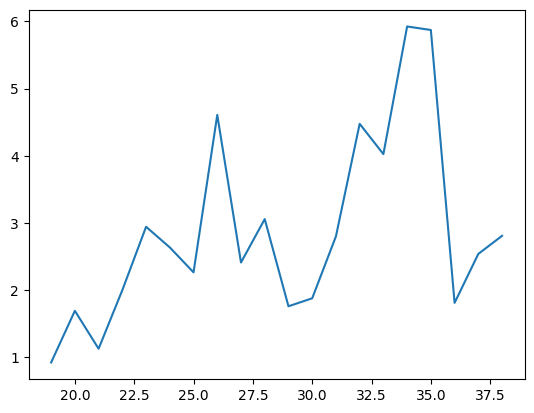

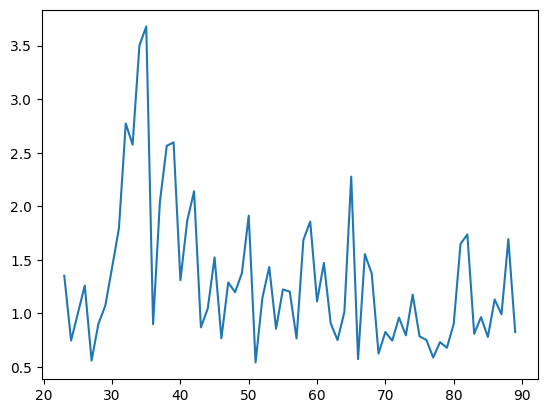

1.864272858710222 29 49 0.9866033140141202


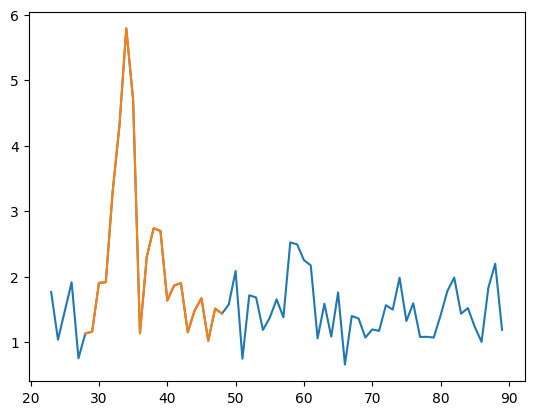

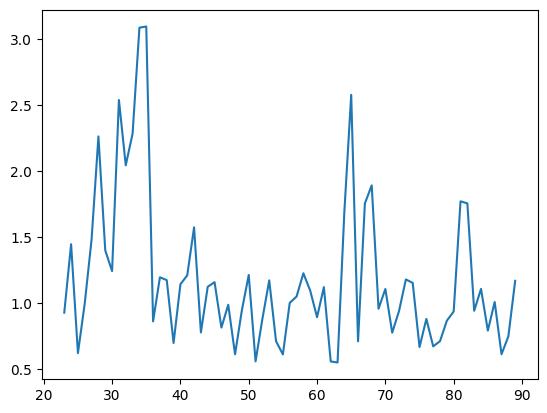

1.5345818433208325 23 43 1.1851509655321733


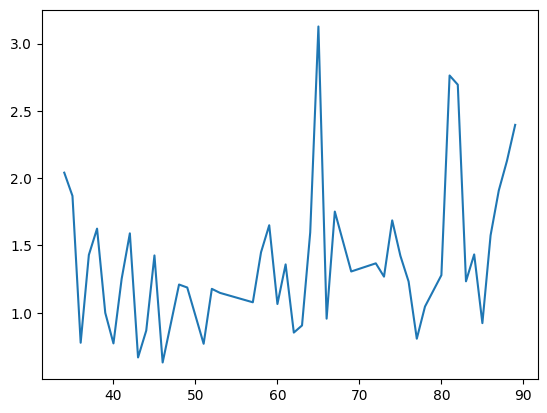

1.5866722809965172 63 83 0.8788760525009106


In [47]:
# Select tracks for plotting 
wave_dynamics = pd.DataFrame()
mem_dynamics = pd.DataFrame()
for c in np.unique(full_t.cell):
    t = full_t[full_t.cell == c]
    for i in np.unique(t.particle):
        cur = t[t.particle == i]
        cur = cur.reset_index()
        if len(cur)>= 20 and cur.norm_wave.max()>=3:
            max_wave,std,end = get_top_n_index(cur,20)
            plt.plot(cur.frame,cur.norm_wave)
            plt.show()
            if std != -1:
                cur_r = cur[(cur.frame>=std-2) & (cur.frame<=end-2)]
                print(max_wave,std-1,end-1,cur_r.iloc[0:2].norm_wave.mean())
                if len(cur_r) >=21:
                    plt.plot(cur.frame,cur.norm_wave/cur.norm_mem)
                    plt.plot(cur_r.frame,cur_r.norm_wave/cur_r.norm_mem)
    #                 plt.plot(cur.frame,cur.norm_mem)
    #                 plt.plot(cur_r.frame,cur_r.norm_wave)
                    plt.show()
                    cur_r.frame = cur_r.frame-cur_r.frame.min()

                    wave_dynamics[str(c)+'_'+str(i)] = cur_r.norm_wave.values[:21]
                    mem_dynamics[str(c)+'_'+str(i)] = cur_r.norm_mem.values[:21]

In [48]:
mem_dynamics.to_csv(PATH + 'csv_data/mem_dynamics.csv')

In [49]:
wave_dynamics.to_csv(PATH + 'csv_data/wave_dynamics.csv')

In [28]:
wave_dynamics = pd.read_csv(PATH + 'csv_data/wave_dynamics.csv',index_col = 0)
mem_dynamics = pd.read_csv(PATH + 'csv_data/mem_dynamics.csv',index_col = 0)

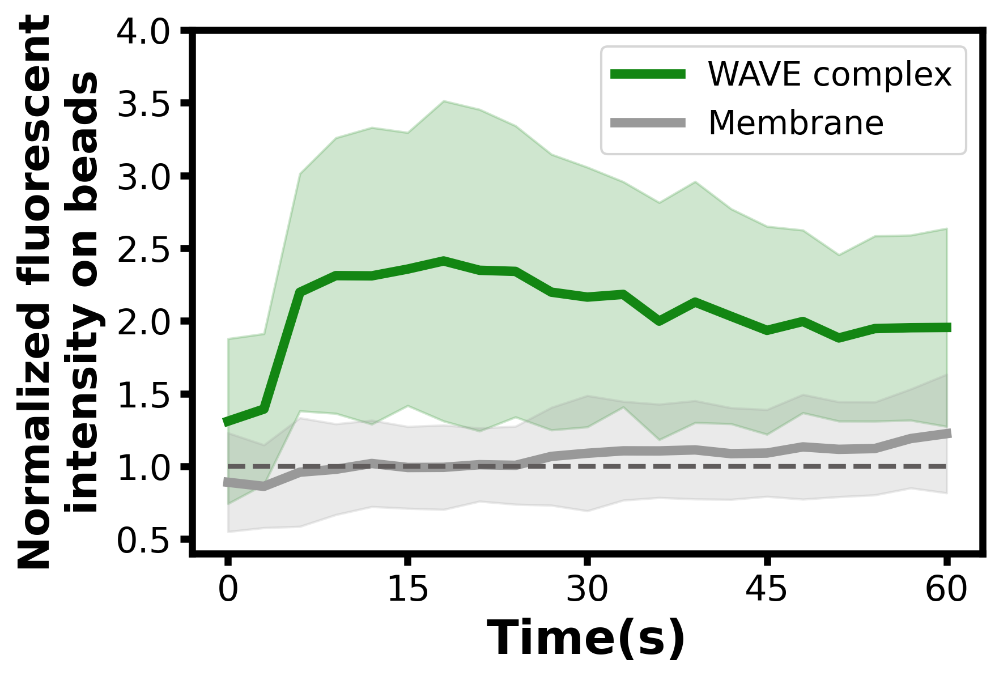

In [29]:
_,ax = plt.subplots(figsize = (6,4),dpi = 300)
ave = wave_dynamics.mean(axis = 1)
std = wave_dynamics.std(axis = 1)
plt.plot(np.arange(0,21),ave,lw = 4,c = '#138613',label = 'WAVE complex')
plt.fill_between(np.arange(0,21),ave-std,ave+std,alpha = 0.2,color = '#138613')
ave = mem_dynamics.mean(axis = 1)
std = mem_dynamics.std(axis = 1)
plt.plot(np.arange(0,21),ave,lw = 4,c = '#999999',label = 'Membrane')
plt.fill_between(np.arange(0,21),ave-std,ave+std,alpha = 0.2,color = '#999999')
plt.hlines(1,0,20,color = '#605c5c',ls = '--',lw = 2)
plt.ylim(0.4,4)
plt.xticks(np.arange(0,21,5),np.arange(0,61,15),size = 15)
plt.yticks(size =15)
plt.xlabel('Time(s)',size = 20,fontweight = 'bold')
plt.legend(fontsize = 14)
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(3)

# increase tick width
ax.tick_params(width=3,size = 5)
plt.ylabel('Normalized fluorescent\nintensity on beads',size = 18,fontweight = 'bold')
plt.savefig(PATH + 'result_figures/Fig4E_wave_dynamics.png',dpi = 300,bbox_inches = 'tight')

# Generate example time lapse images

In [53]:
example = io.imread(PATH + "example_images/221102_200nm_3s_7_cropped_example.tif")

In [54]:
cell = example[:,:,:,2]
beads = example[:,:,:,1]

t =  0
t =  15
t =  30
t =  45
t =  60
t =  75
t =  90
t =  105
t =  120
t =  135
t =  150
t =  165


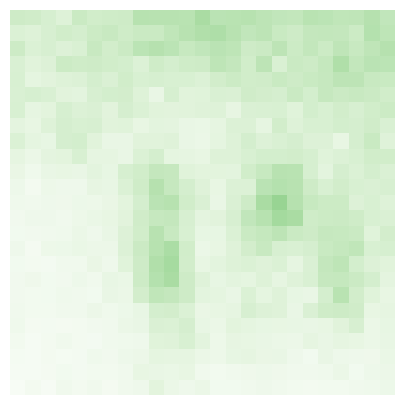

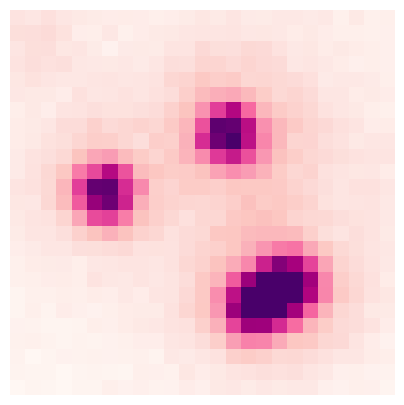

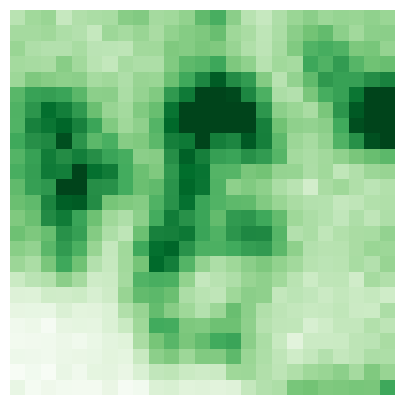

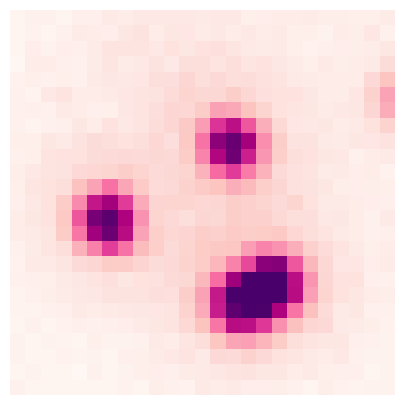

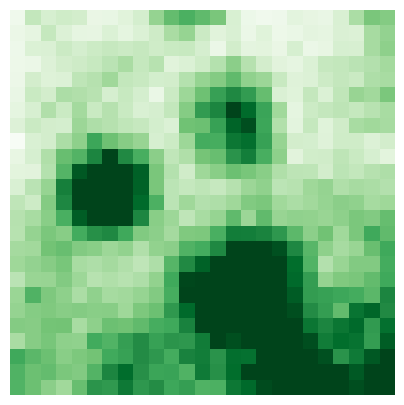

...

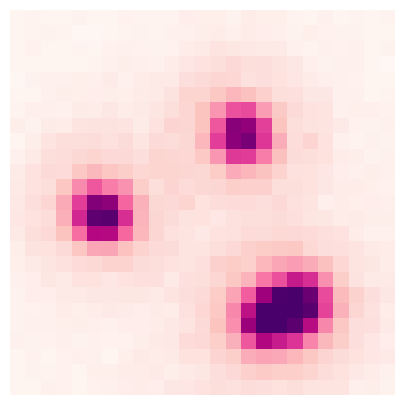

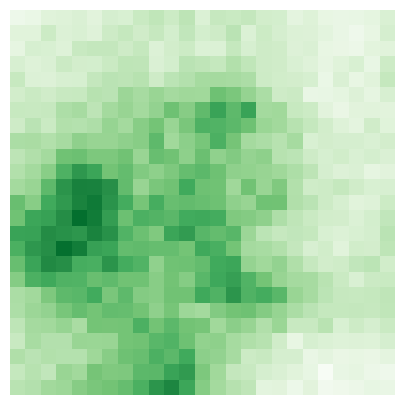

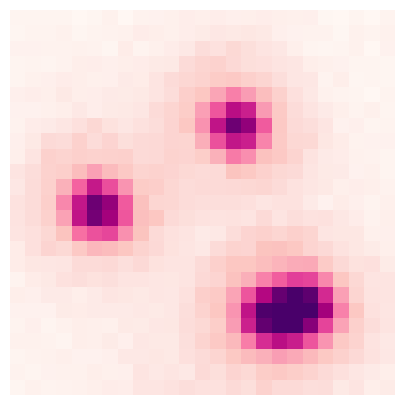

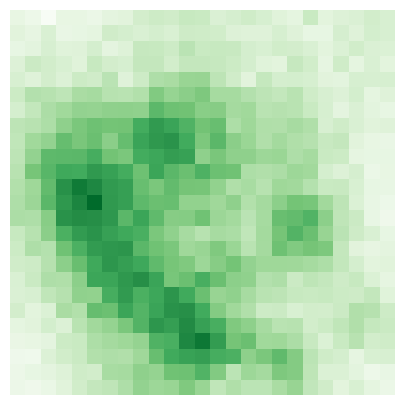

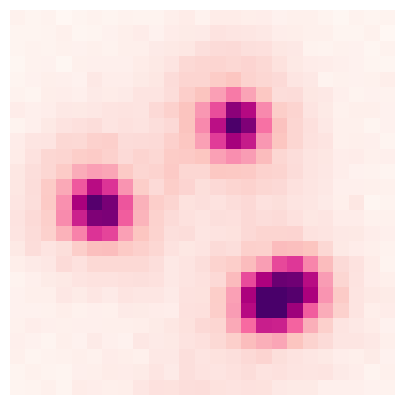

In [56]:
for i in range(5,61,5):
    print("t = ",i*3-15)
    plt.figure(figsize = (5,5))
    plt.imshow(cell[i],cmap = "Greens",vmax = 1200)
    plt.axis('off')
#     plt.savefig(PATH +'example_images/200nm_wave_'+str(i*3-15)+"s.png",dpi = 300,bbox_inches = 'tight')
    plt.figure(figsize = (5,5))
    plt.imshow(beads[i],cmap = "RdPu",vmax= 2000)
    plt.axis('off')
#     plt.savefig(PATH +'example_images/200nm_beads_'+str(i*3-15)+"s.png",dpi = 300,bbox_inches = 'tight')